In [1]:
import pandas as pd
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (accuracy_score, f1_score, 
                             confusion_matrix, roc_auc_score,
                             RocCurveDisplay)
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping

# Data Pre-processing

In [2]:
combined_stocks_df = pd.read_csv("filtered_stocks_combined.csv")

# Convert Date to datetime and set as index
combined_stocks_df["Date"] = pd.to_datetime(combined_stocks_df["Date"])
combined_stocks_df.set_index("Date", inplace=True)

# Drop unnecessary columns
if "index" in combined_stocks_df.columns:
    combined_stocks_df = combined_stocks_df.drop(columns=["index"])

# Pivot to multi-level columns: Ticker as level 1, feature as level 2
stocks_df = combined_stocks_df.pivot_table(
    index=combined_stocks_df.index,
    columns="ticker",
    values=[col for col in combined_stocks_df.columns if col != "ticker"]
)

# Sort columns for clarity and swap MultiIndex levels
stocks_df = stocks_df.sort_index(axis=1, level=0)
stocks_df_leveled = stocks_df.swaplevel(axis=1)
stocks_df_leveled = stocks_df_leveled.sort_index(axis=1, level=0)

# ---------------------------
# Time-based split and feature engineering per ticker
# ---------------------------
# Store splits for each ticker
train_dict, val_dict, test_dict = {}, {}, {}

# Compute log returns, then split each ticker's data into train (60%), val (20%) and test (20%)
for ticker in stocks_df_leveled.columns.levels[0]:
    # Compute log return from Close prices
    stocks_df_leveled.loc[:, (ticker, 'log_return')] = np.log(
        stocks_df_leveled[ticker]['Close'] / stocks_df_leveled[ticker]['Close'].shift(1)
    )
    # Get ticker dataframe and drop NA
    df = stocks_df_leveled[ticker].dropna().sort_index()
    total_len = len(df)
    train_end = int(total_len * 0.6)
    val_end = train_end + int(total_len * 0.2)

    # Store splits
    train_dict[ticker] = df.iloc[:train_end]
    val_dict[ticker] = df.iloc[train_end:val_end]
    test_dict[ticker] = df.iloc[val_end:]

# Define features and binary classification target based on log_return
features = ['Open', 'High', 'Low', 'Close', 'Volume']
for split in [train_dict, val_dict, test_dict]:
    for ticker, df in split.items():
        df['target'] = (df['log_return'] > 0).astype(int)

# RNN Sequences

In [3]:
# generate sequences of a fixed length for RNN
def create_sequences(data, sequence_length, feature_cols):
    X, y = [], []
    # Ensure the data is sorted by date
    data = data.sort_index()
    for i in range(sequence_length, len(data)):
        seq = data.iloc[i-sequence_length:i][feature_cols].values  # shape: (sequence_length, num_features)
        target = data.iloc[i]['target']
        X.append(seq)
        y.append(target)
    return np.array(X), np.array(y)

# Set the sequence length/rolling window size
sequence_length = 60

In [4]:
# Helper function to process a split (train, val or test) across tickers
def process_split(split_dict, sequence_length, feature_cols):
    X_list, y_list = [], []
    for ticker, df in split_dict.items():
        # Only create sequences if there are enough data points
        if len(df) > sequence_length:
            X_seq, y_seq = create_sequences(df, sequence_length, feature_cols)
            X_list.append(X_seq)
            y_list.append(y_seq)
    if X_list:
        return np.concatenate(X_list, axis=0), np.concatenate(y_list, axis=0)
    else:
        return None, None

X_train, y_train = process_split(train_dict, sequence_length, features)
X_val, y_val = process_split(val_dict, sequence_length, features)
X_test, y_test = process_split(test_dict, sequence_length, features)


# Feature Scaling

In [5]:
n_features = X_train.shape[-1]
X_train_reshaped = X_train.reshape(-1, n_features)
scaler = StandardScaler()
scaler.fit(X_train_reshaped)

X_train_scaled = scaler.transform(X_train_reshaped).reshape(X_train.shape)
X_val_scaled = scaler.transform(X_val.reshape(-1, n_features)).reshape(X_val.shape)
X_test_scaled = scaler.transform(X_test.reshape(-1, n_features)).reshape(X_test.shape)


# Building the Model

In [6]:
model = Sequential()
model.add(SimpleRNN(128, activation='relu', input_shape=(sequence_length, n_features)))
model.add(Dense(1))

opt = tf.keras.optimizers.Adam(learning_rate=0.001, decay=1e-6)
model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\optimizers\base_optimizer.py:34: UserWarning: Argument `decay` is no longer supported and will be ignored.
  warnings.warn(


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ simple_rnn (SimpleRNN)          │ (None, 128)            │        17,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 17,281 (67.50 KB)

 Trainable params: 17,281 (67.50 KB)

 Non-trainable params: 0 (0.00 B)

# Model Training & Evaluation

Epoch 1/50
661/661 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.4984 - loss: 1.0079 - val_accuracy: 0.5017 - val_loss: 0.6981
Epoch 2/50
661/661 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - accuracy: 0.5135 - loss: 0.7238 - val_accuracy: 0.5060 - val_loss: 0.6944
Epoch 3/50
661/661 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - accuracy: 0.5077 - loss: 0.7127 - val_accuracy: 0.5017 - val_loss: 0.6943
Epoch 4/50
661/661 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - accuracy: 0.5101 - loss: 0.6976 - val_accuracy: 0.5017 - val_loss: 0.6989
Epoch 5/50
661/661 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - accuracy: 0.5151 - loss: 0.6945 - val_accuracy: 0.4948 - val_loss: 0.7051
Epoch 6/50
661/661 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - accuracy: 0.5132 - loss: 0.7059 - val_accuracy: 0.5052 - val_loss: 0.6980
Epoch 7/50
661/661 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - accuracy: 0.5044 - loss: 0.6962 - val_accuracy: 0.5037 - val_loss: 0.6939
Epoch 8/50
661/661 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.5135 - loss: 0.6939 - val_accuracy: 0

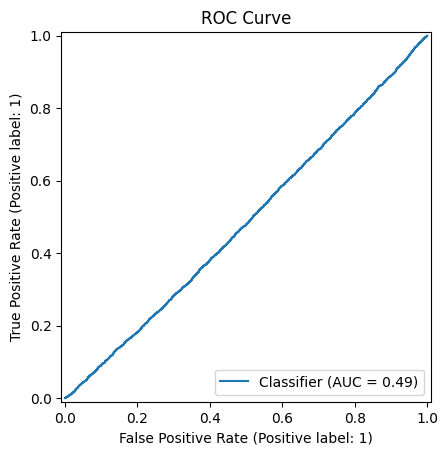

In [7]:
# Train the model
history = model.fit(X_train_scaled, y_train,
                    epochs=50,
                    batch_size=64,
                    validation_data=(X_val_scaled, y_val),
                    verbose=1)

# ---------------------------
# Evaluate the Model
# ---------------------------
# Get prediction probabilities on test set
y_pred_prob = model.predict(X_test_scaled).ravel()
y_pred_binary = (y_pred_prob > 0.5).astype(int)

# Compute evaluation metrics
accuracy = accuracy_score(y_test, y_pred_binary)
f1 = f1_score(y_test, y_pred_binary)
auc_roc = roc_auc_score(y_test, y_pred_prob)

print(f"Accuracy: {accuracy:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"AUC-ROC Score: {auc_roc:.4f}")

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred_binary)
print("\nConfusion Matrix:")
print(pd.DataFrame(conf_matrix, 
                   index=['Actual Down', 'Actual Up'],
                   columns=['Predicted Down', 'Predicted Up']))

# Plot ROC curve
RocCurveDisplay.from_predictions(y_test, y_pred_prob)
plt.title('ROC Curve')
plt.show()

Loaded data with 75500 records.
Data sorted by 'Date' and 'index'.
           Date   index    Open    High     Low   Close     Volume  OpenInt  \
0    2011-01-03   45725  41.600  42.293  41.600  42.204  123930383        0   
1510 2011-01-03  123841  19.549  19.549  19.338  19.358   22577420        0   
3020 2011-01-03  220493  30.830  31.480  30.790  31.290    6245382        0   
4530 2011-01-03  692217   8.440   8.550   8.390   8.470   21152390        0   
6040 2011-01-03  711850  48.320  49.242  48.276  48.599    6232990        0   

     ticker  
0      AAPL  
1510    ABT  
3020   ADBE  
4530    AMD  
6040   AMGN  
Processing all tickers:
 ['AAPL' 'ABT' 'ADBE' 'AMD' 'AMGN' 'AMZN' 'AXP' 'BAC' 'BSX' 'C' 'CAT'
 'CMCSA' 'COST' 'CSCO' 'CVX' 'DHR' 'DIS' 'GE' 'GOOGL' 'GS' 'HD' 'HON'
 'IBM' 'INTU' 'JNJ' 'JPM' 'KO' 'LLY' 'MCD' 'MRK' 'MSFT' 'NVDA' 'ORCL'
 'PEP' 'PFE' 'PG' 'PGR' 'QCOM' 'SMFG' 'SPGI' 'SYK' 'T' 'TMO' 'TXN' 'UNH'
 'UNP' 'VZ' 'WFC' 'WMT' 'XOM']

Processing ticker: AAPL
Ticker: AAP

c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0168 - val_loss: 0.0198
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0013 - val_loss: 0.0084
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.7854e-04 - val_loss: 0.0102
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0312e-04 - val_loss: 0.0037
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3388e-04 - val_loss: 0.0046
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5594e-04 - val_loss: 0.0025
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5753e-04 - val_loss: 0.0040
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8031e-04 - val_loss: 0.0015
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9939e-04 - val_loss: 0.0019
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9336e-04 - val_loss: 0.0035
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Ticker: AAPL - MAE: 2.96, RMSE: 3.42, MAPE: 2.82%
Directional Accuracy for AAPL: 49.32%


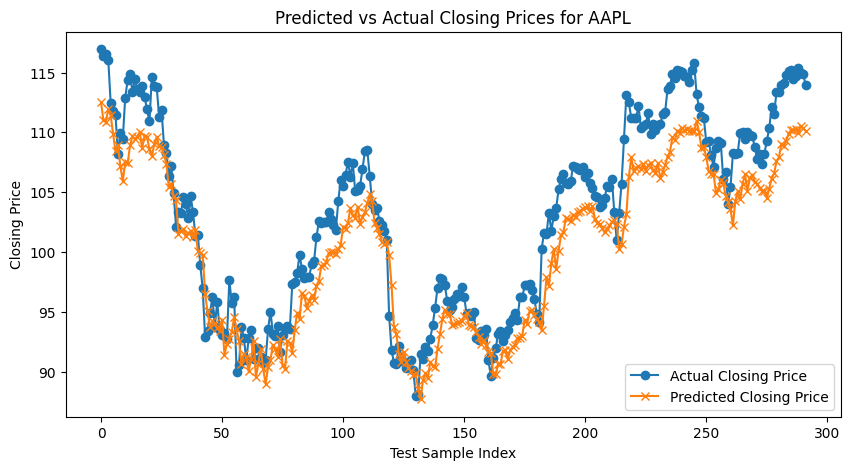

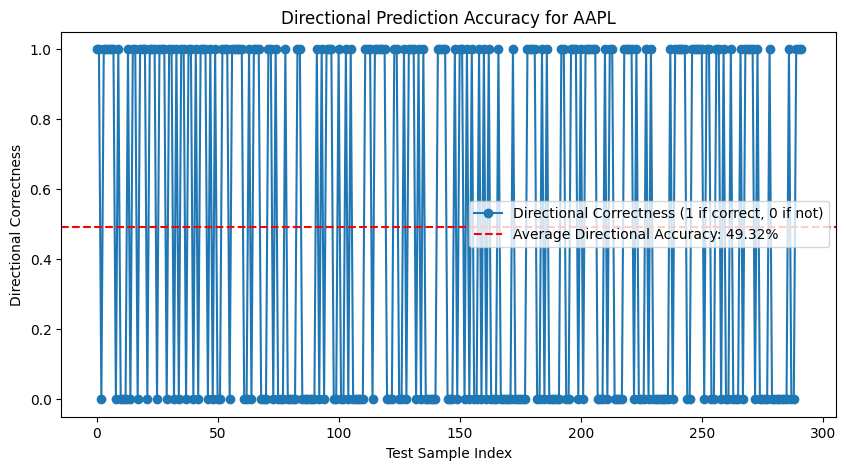

ROC AUC for AAPL: 0.54


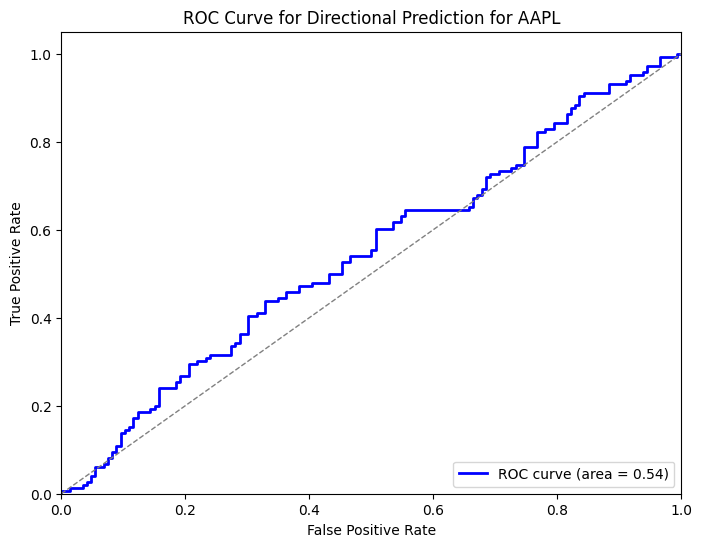


Processing ticker: ABT
Ticker: ABT - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0907 - val_loss: 0.0237
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.5670e-04 - val_loss: 0.0096
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0641e-04 - val_loss: 0.0061
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0291e-04 - val_loss: 0.0054
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0807e-04 - val_loss: 0.0032
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5030e-04 - val_loss: 0.0034
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1546e-04 - val_loss: 0.0030
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1600e-04 - val_loss: 0.0033
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6484e-04 - val_loss: 0.0018
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1229e-04 - val_loss: 0.0020
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Ticker: ABT - MAE: 0.81, RMSE: 1.02, MAPE: 2.03%
Directional Accuracy for ABT: 52.40%


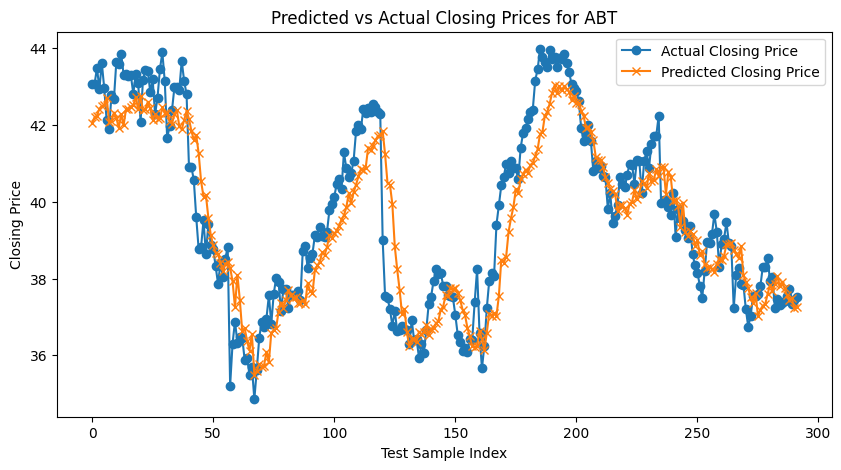

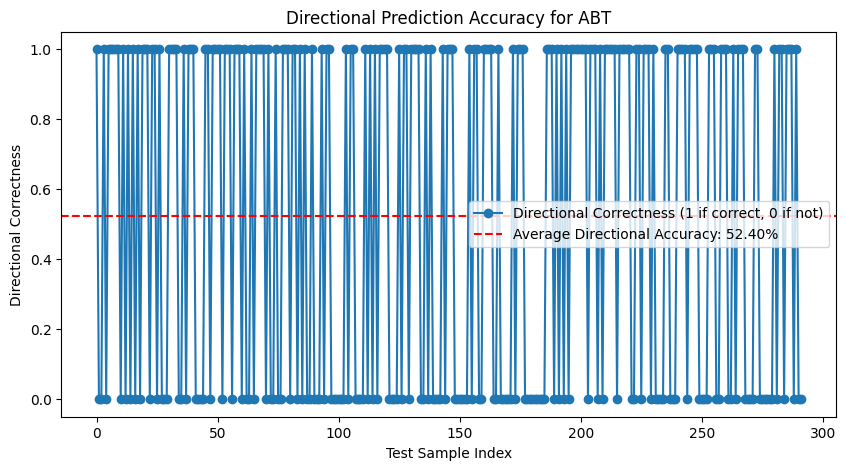

ROC AUC for ABT: 0.53


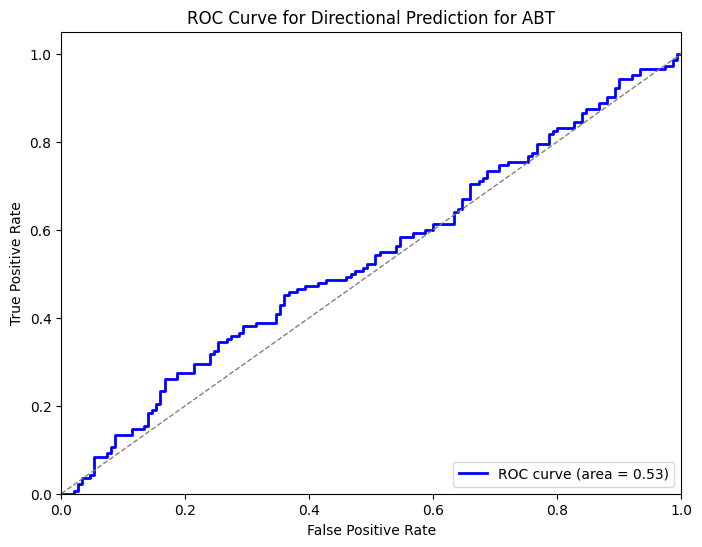


Processing ticker: ADBE
Ticker: ADBE - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0107 - val_loss: 0.0022
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5048e-04 - val_loss: 0.0033
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6606e-04 - val_loss: 0.0021
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.6653e-04 - val_loss: 0.0014
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.3886e-04 - val_loss: 0.0020
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.3128e-04 - val_loss: 0.0013
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.3448e-04 - val_loss: 0.0012
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.0967e-04 - val_loss: 0.0012
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.8306e-04 - val_loss: 0.0014
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.0021e-04 - val_loss: 0.0011
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Ticker: ADBE - MAE: 7.45, RMSE: 8.05, MAPE: 7.55%
Directional Accuracy for ADBE: 47.26%


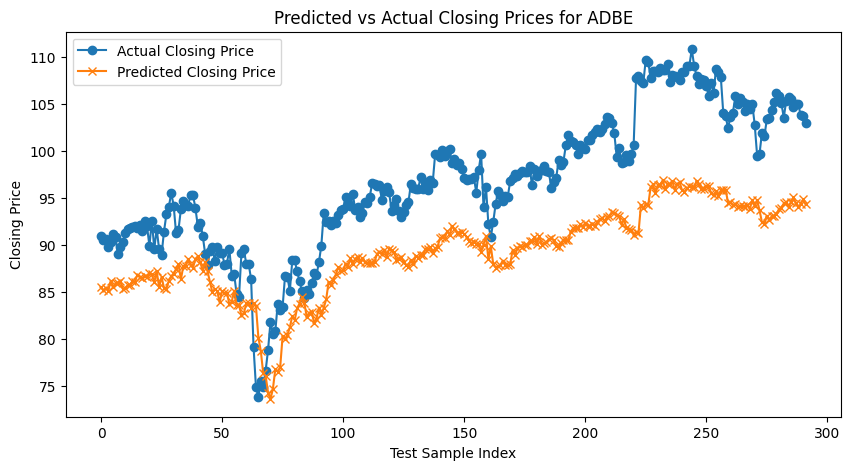

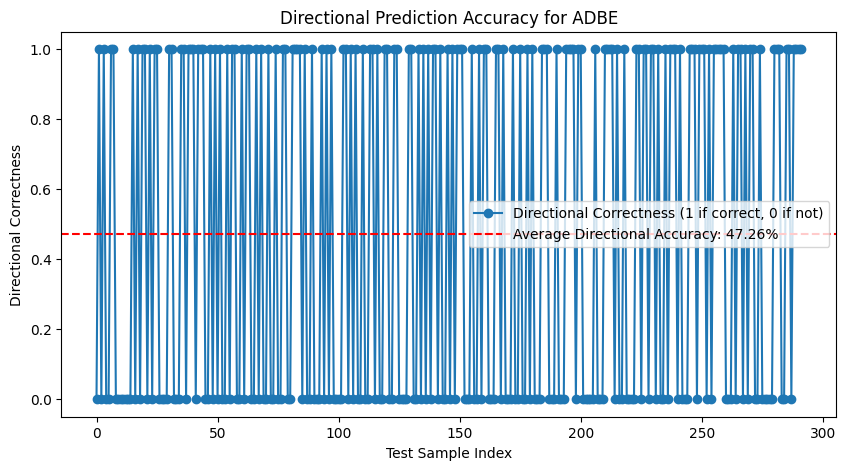

ROC AUC for ADBE: 0.62


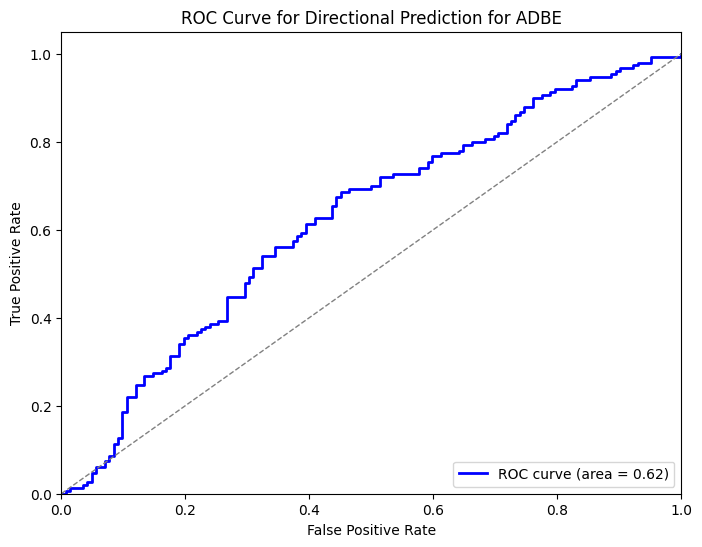


Processing ticker: AMD
Ticker: AMD - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0333 - val_loss: 7.4949e-04
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0012 - val_loss: 4.1530e-04
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7023e-04 - val_loss: 3.1770e-04
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1460e-04 - val_loss: 2.6963e-04
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8254e-04 - val_loss: 2.3435e-04
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4500e-04 - val_loss: 1.9812e-04
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5025e-04 - val_loss: 1.8648e-04
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2268e-04 - val_loss: 2.0147e-04
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2857e-04 - val_loss: 1.8919e-04
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2308e-04 - val_loss: 1.6323e-04
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Ticker: AMD - MAE: 0.25, RMSE: 0.39, MAPE: 4.98%
Directio

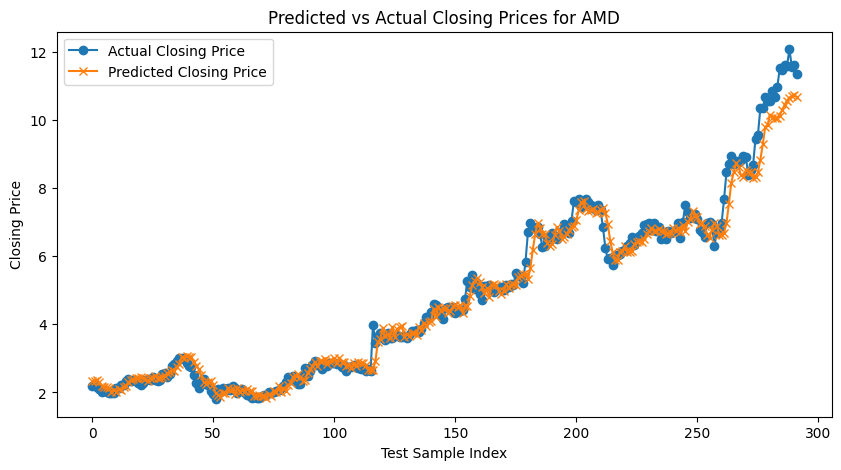

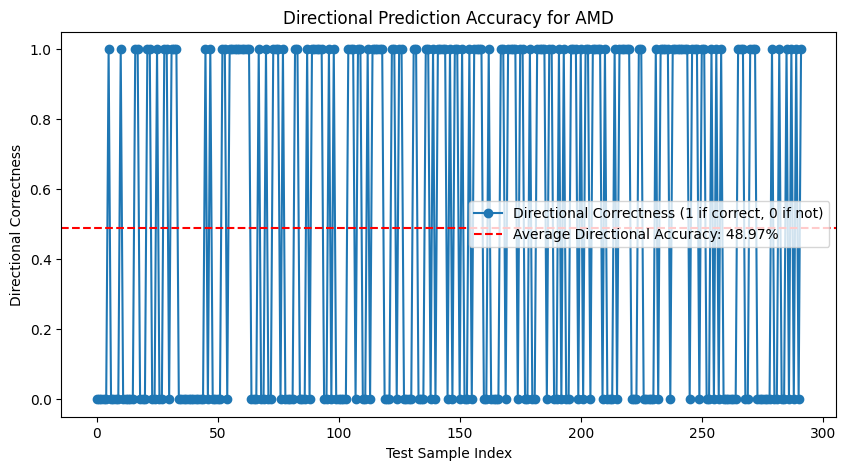

ROC AUC for AMD: 0.52


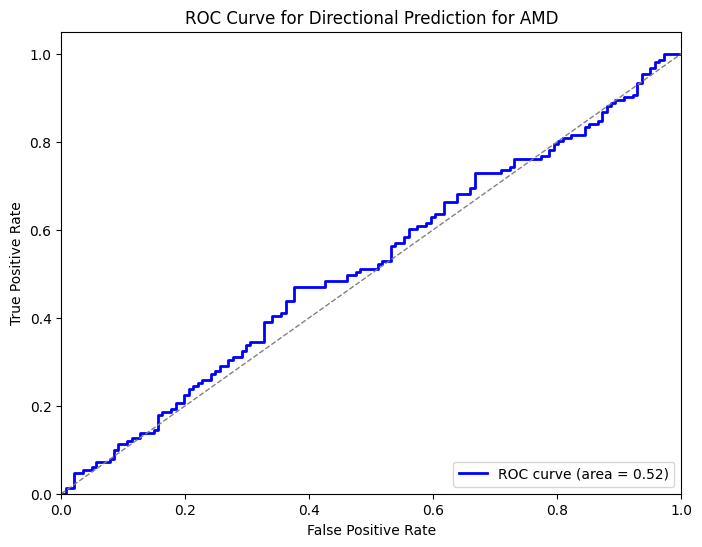


Processing ticker: AMGN
Ticker: AMGN - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0071 - val_loss: 0.0159
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1975e-04 - val_loss: 0.0142
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4556e-04 - val_loss: 0.0077
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.3157e-04 - val_loss: 0.0063
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.4663e-04 - val_loss: 0.0059
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.4899e-04 - val_loss: 0.0043
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.3215e-04 - val_loss: 0.0037
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.9730e-04 - val_loss: 0.0045
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.1064e-04 - val_loss: 0.0029
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.8204e-04 - val_loss: 0.0036
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Ticker: AMGN - MAE: 7.63, RMSE: 8.41, MAPE: 4.95%
Directional Accuracy for AMGN: 47.26%


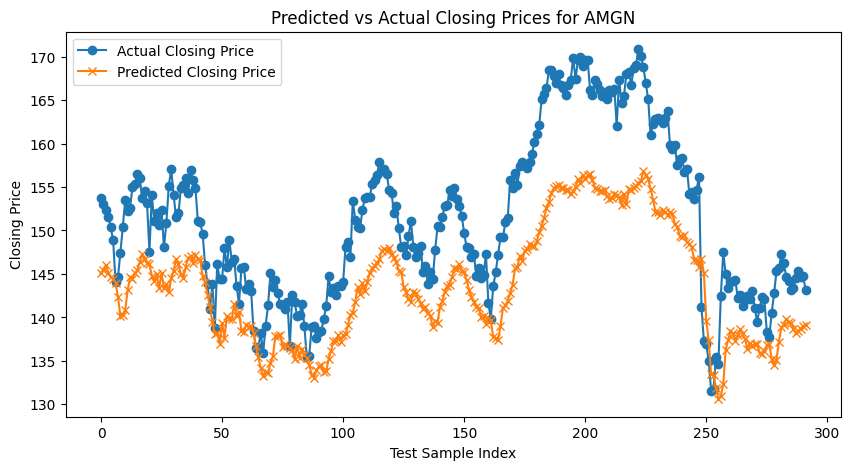

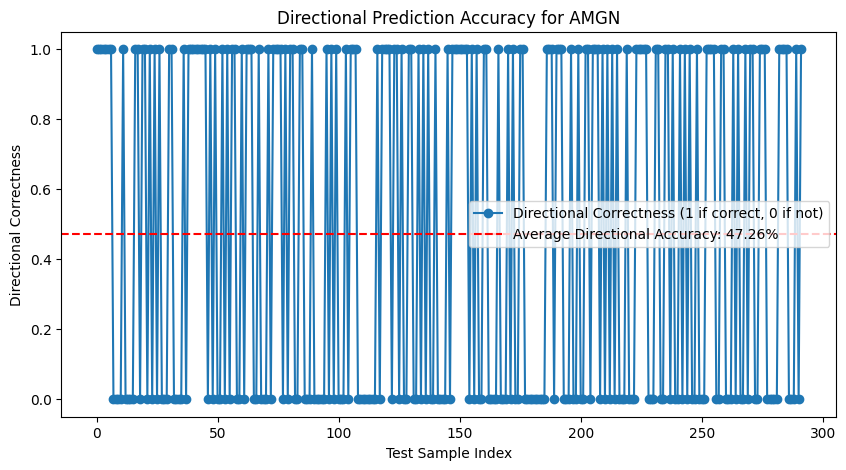

ROC AUC for AMGN: 0.55


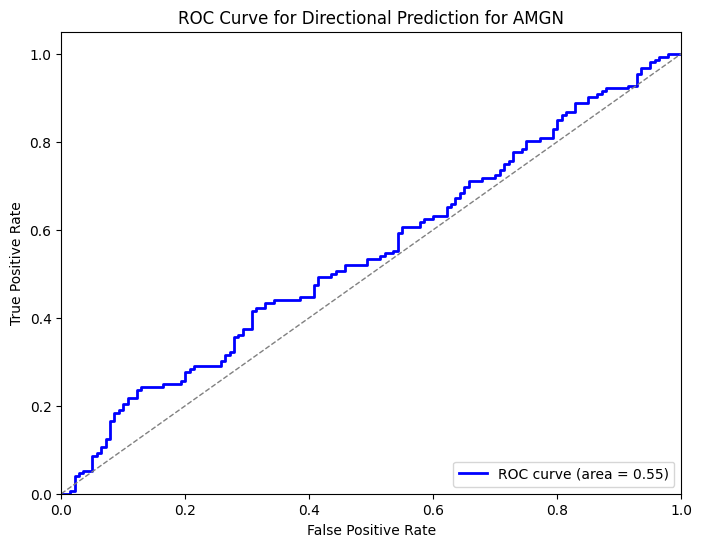


Processing ticker: AMZN
Ticker: AMZN - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0059 - val_loss: 0.0090
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3399e-04 - val_loss: 0.0057
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4766e-04 - val_loss: 0.0058
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.6040e-04 - val_loss: 0.0038
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.9902e-04 - val_loss: 0.0039
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.8394e-04 - val_loss: 0.0029
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.8942e-04 - val_loss: 0.0023
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.4115e-04 - val_loss: 0.0025
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.3713e-04 - val_loss: 0.0020
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.3839e-04 - val_loss: 0.0013
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Ticker: AMZN - MAE: 81.07, RMSE: 88.43, MAPE: 11.21%
Directional Accuracy for AMZN: 45.55%


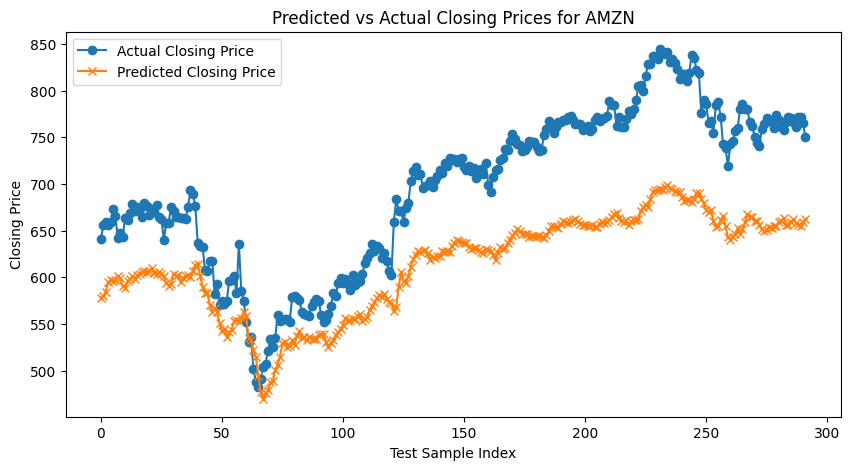

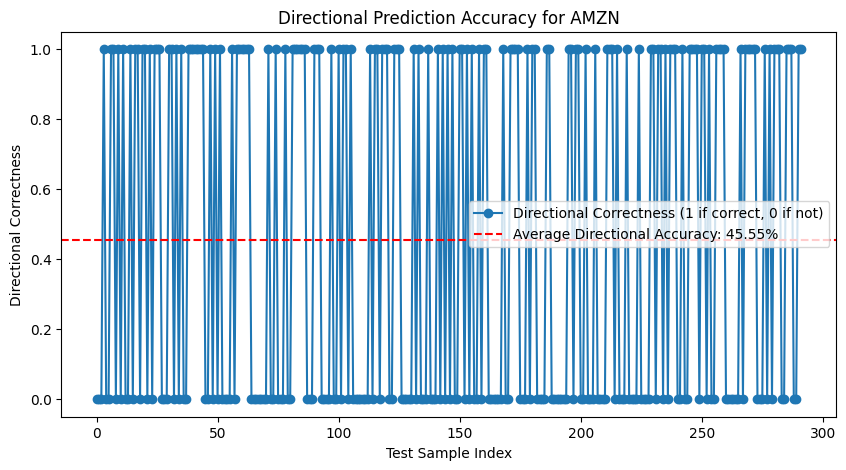

ROC AUC for AMZN: 0.53


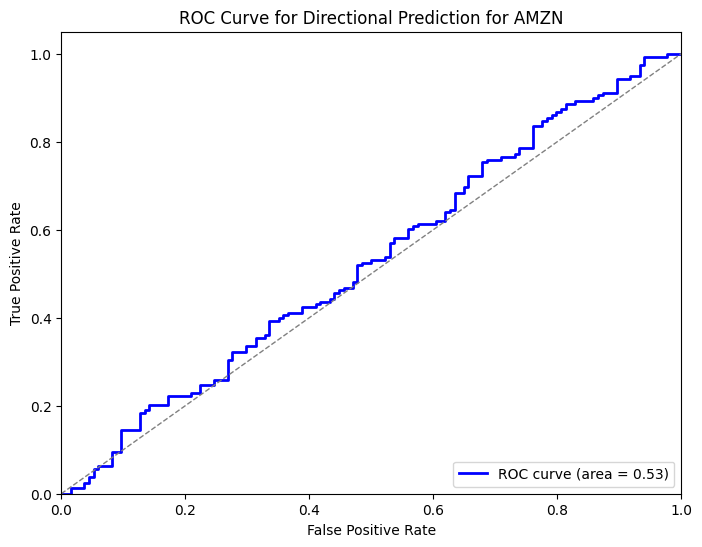


Processing ticker: AXP
Ticker: AXP - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0135 - val_loss: 0.0018
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0014 - val_loss: 0.0018
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.5064e-04 - val_loss: 0.0010
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7158e-04 - val_loss: 9.4523e-04
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0598e-04 - val_loss: 9.1624e-04
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1868e-04 - val_loss: 9.4840e-04
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5091e-04 - val_loss: 8.3801e-04
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9692e-04 - val_loss: 7.7498e-04
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0464e-04 - val_loss: 7.3288e-04
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5502e-04 - val_loss: 9.7816e-04
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Ticker: AXP - MAE: 1.17, RMSE: 1.60, MAPE: 1.88%
Directional Accuracy 

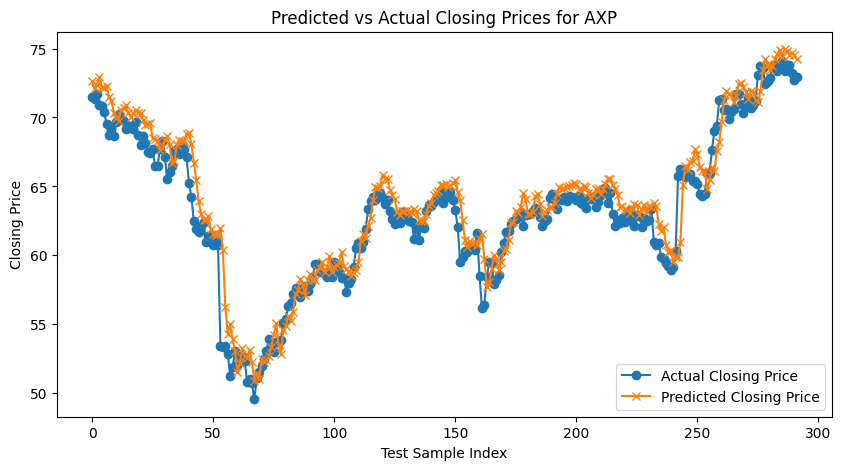

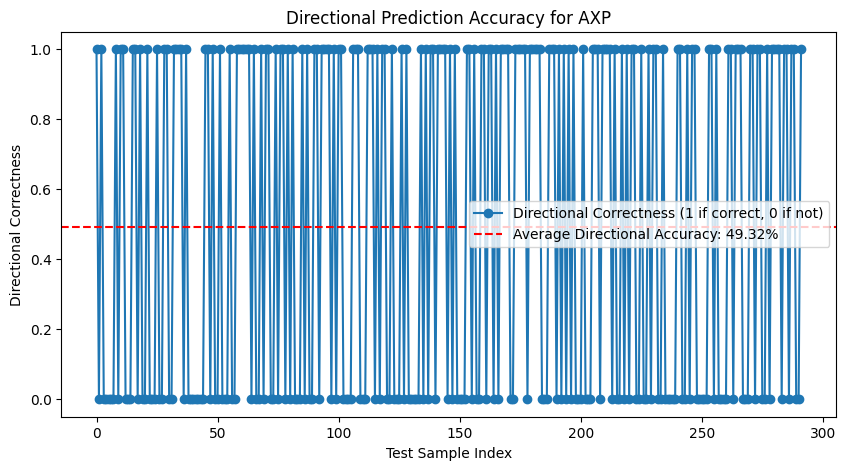

ROC AUC for AXP: 0.49


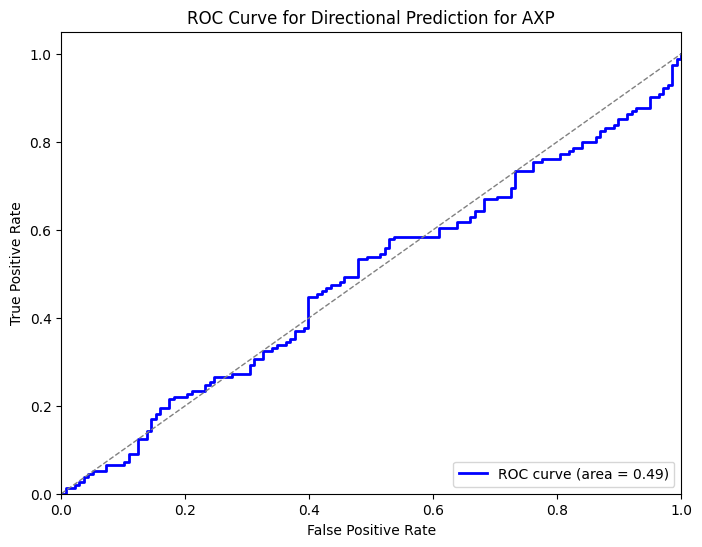


Processing ticker: BAC
Ticker: BAC - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0120 - val_loss: 4.6408e-04
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.3453e-04 - val_loss: 4.1125e-04
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5461e-04 - val_loss: 4.9490e-04
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5381e-04 - val_loss: 3.1564e-04
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.4821e-04 - val_loss: 5.3769e-04
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.9588e-04 - val_loss: 3.6222e-04
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.4846e-04 - val_loss: 4.5500e-04
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.5940e-04 - val_loss: 2.8790e-04
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.6713e-04 - val_loss: 4.4914e-04
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 2.5987e-04 - val_loss: 6.1733e-04
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Ticker: BAC - MAE: 0.45, RMSE: 0.60, MAPE: 2.77%
Dire

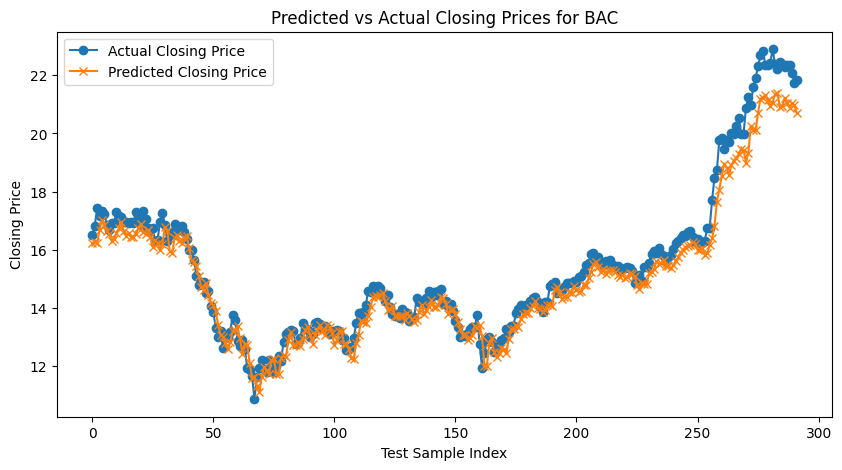

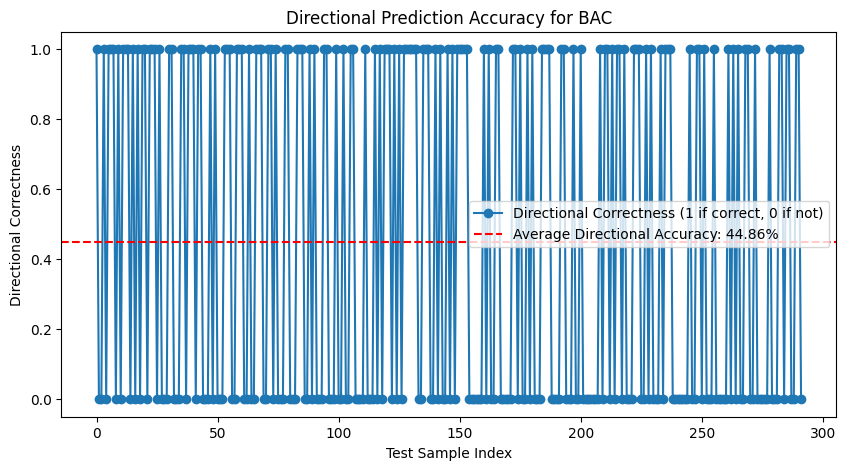

ROC AUC for BAC: 0.51


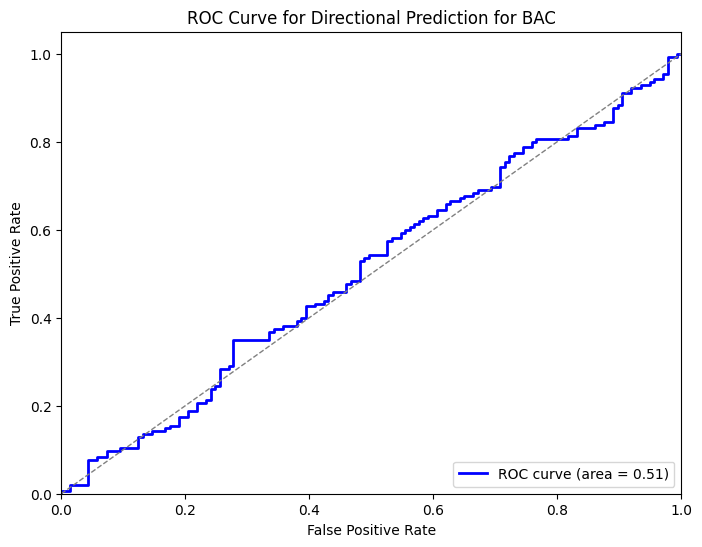


Processing ticker: BSX
Ticker: BSX - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0061 - val_loss: 0.0082
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5191e-04 - val_loss: 0.0059
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.4409e-04 - val_loss: 0.0029
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.0733e-04 - val_loss: 0.0027
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.7802e-04 - val_loss: 0.0019
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.9314e-04 - val_loss: 0.0014
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.8669e-04 - val_loss: 0.0023
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.6723e-04 - val_loss: 0.0019
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.5612e-04 - val_loss: 0.0029
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.6681e-04 - val_loss: 0.0013
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Ticker: BSX - MAE: 1.36, RMSE: 1.52, MAPE: 6.25%
Directional Accuracy for BSX: 47.95%


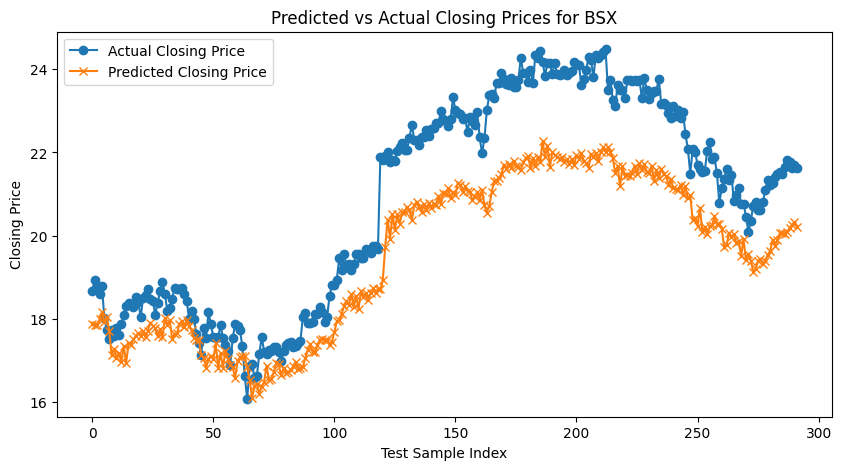

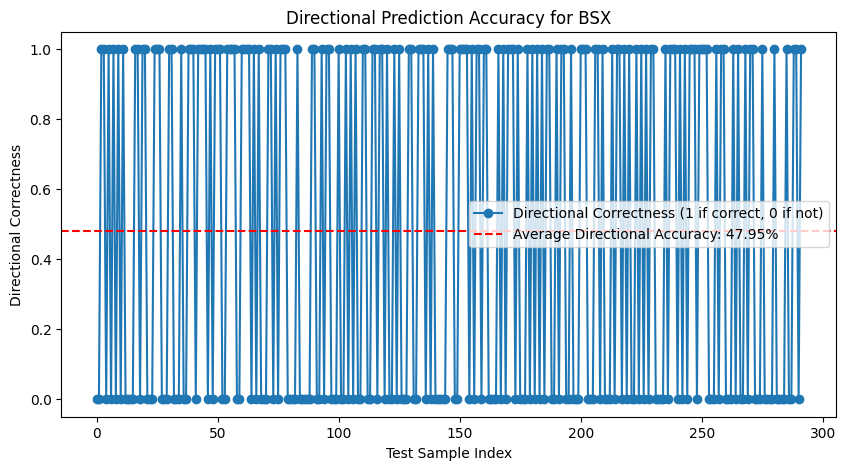

ROC AUC for BSX: 0.56


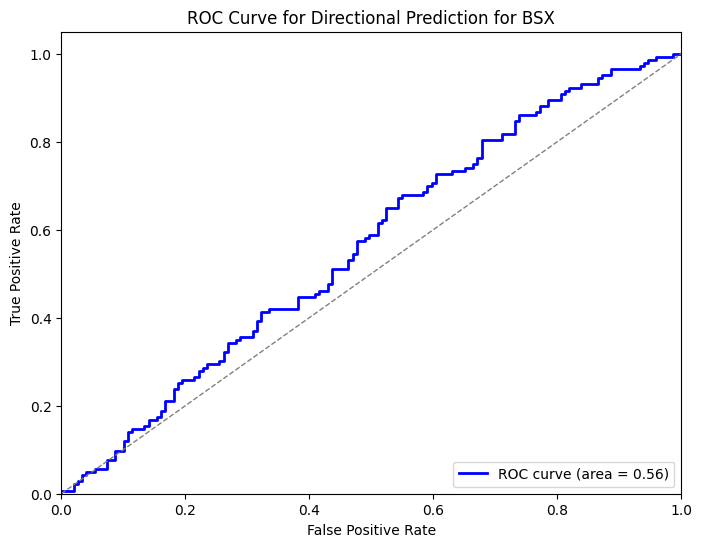


Processing ticker: C
Ticker: C - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0094 - val_loss: 0.0010
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.7672e-04 - val_loss: 7.3635e-04
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.7840e-04 - val_loss: 6.3674e-04
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.8759e-04 - val_loss: 6.0414e-04
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.9466e-04 - val_loss: 7.3827e-04
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.7369e-04 - val_loss: 5.9105e-04
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.1039e-04 - val_loss: 4.6994e-04
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2544e-04 - val_loss: 0.0012
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.8361e-04 - val_loss: 9.8979e-04
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.1423e-04 - val_loss: 4.3614e-04
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Ticker: C - MAE: 0.71, RMSE: 0.97, MAPE: 1.57%
Directional Ac

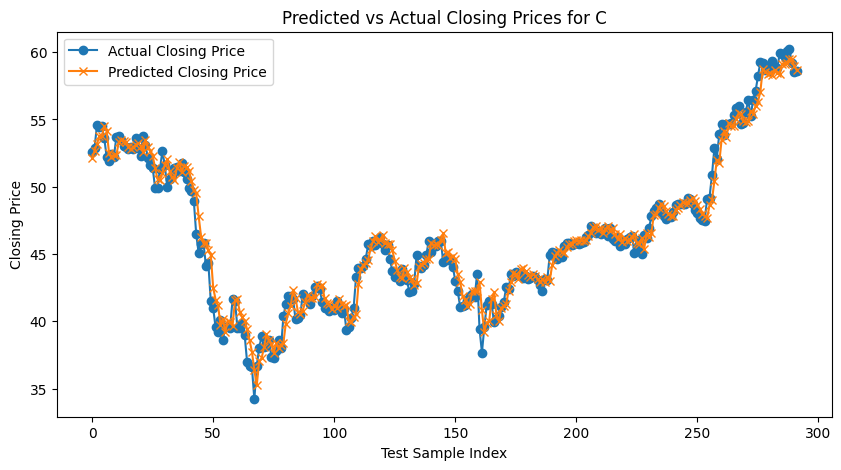

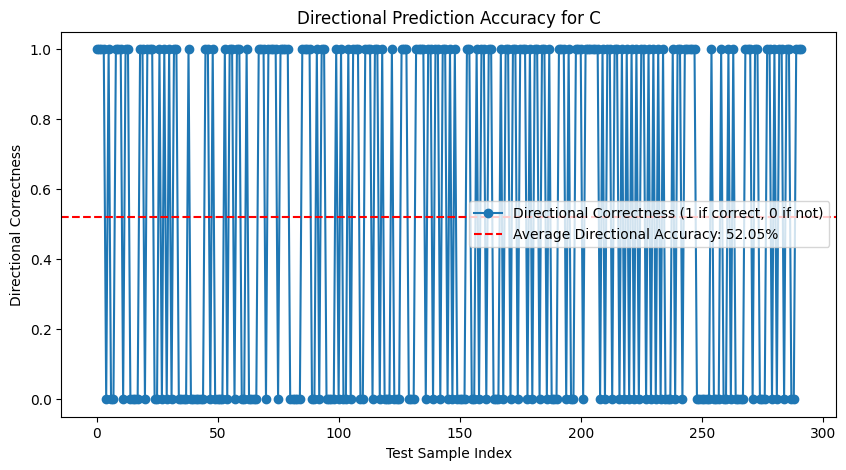

ROC AUC for C: 0.53


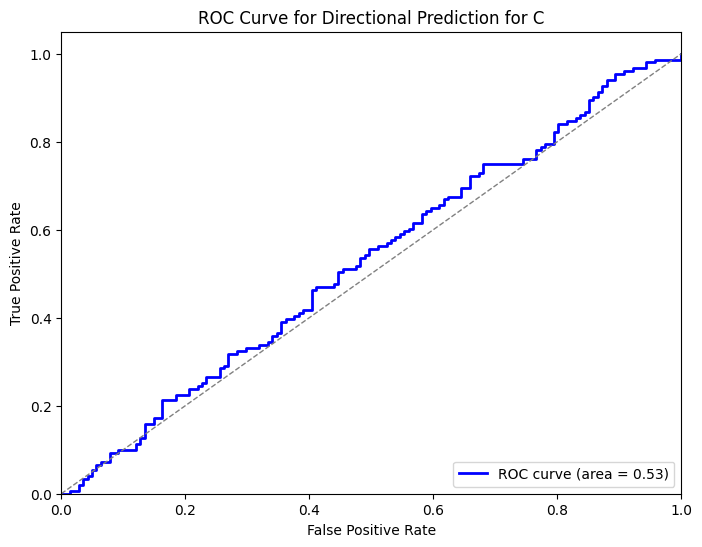


Processing ticker: CAT
Ticker: CAT - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.1909 - val_loss: 0.0092
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0116 - val_loss: 0.0068
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0067 - val_loss: 0.0064
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0051 - val_loss: 0.0054
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0057 - val_loss: 0.0044
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0042 - val_loss: 0.0039
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0039 - val_loss: 0.0036
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0032 - val_loss: 0.0034
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0033 - val_loss: 0.0031
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0032 - val_loss: 0.0032
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Ticker: CAT - MAE: 1.87, RMSE: 2.50, MAPE: 2.58%
Directional Accuracy for CAT: 49.66%


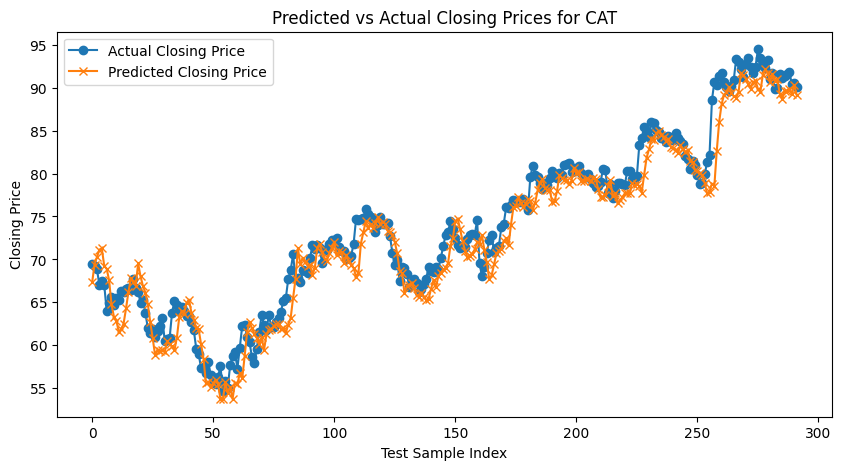

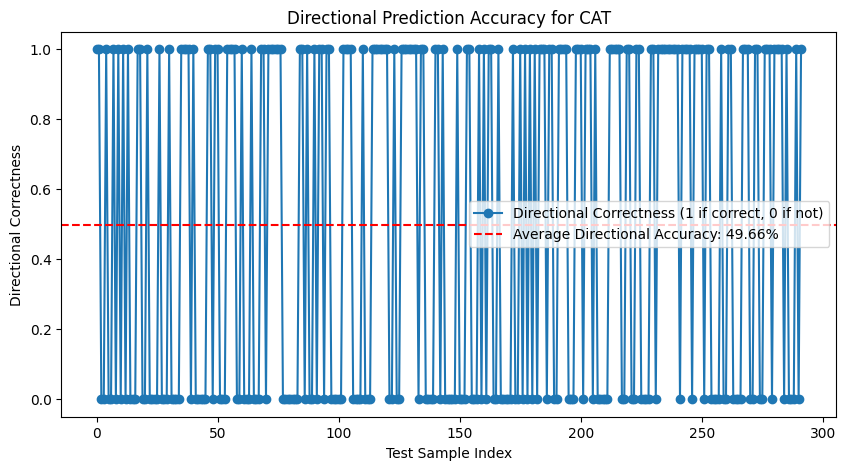

ROC AUC for CAT: 0.52


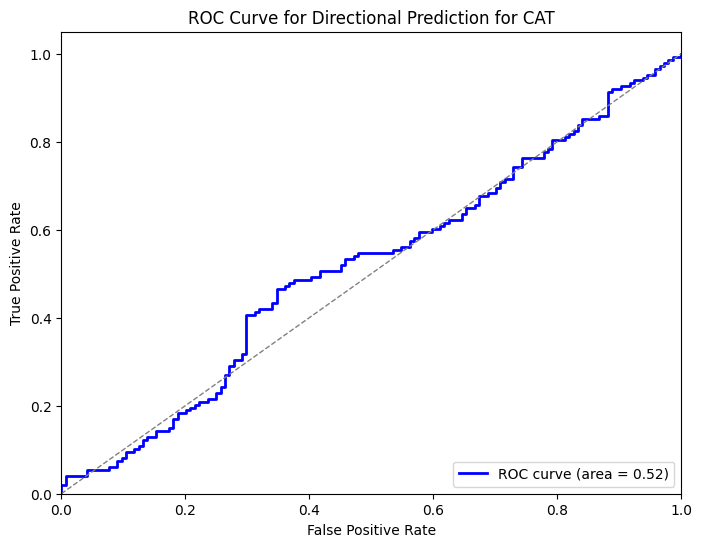


Processing ticker: CMCSA
Ticker: CMCSA - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0639 - val_loss: 0.0029
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.7667e-04 - val_loss: 0.0016
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.4415e-04 - val_loss: 0.0017
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.0895e-04 - val_loss: 0.0012
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.0817e-04 - val_loss: 0.0012
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.5869e-04 - val_loss: 9.9214e-04
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.7167e-04 - val_loss: 0.0011
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.7622e-04 - val_loss: 8.9813e-04
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 2.3204e-04 - val_loss: 0.0010
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.7341e-04 - val_loss: 7.3787e-04
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Ticker: CMCSA - MAE: 1.00, RMSE: 1.20, MAPE: 3.17%
Directional Accuracy for CMCSA

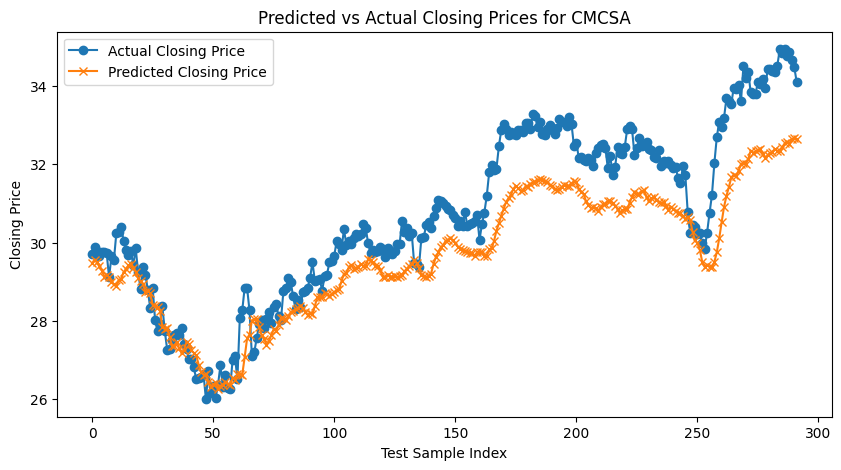

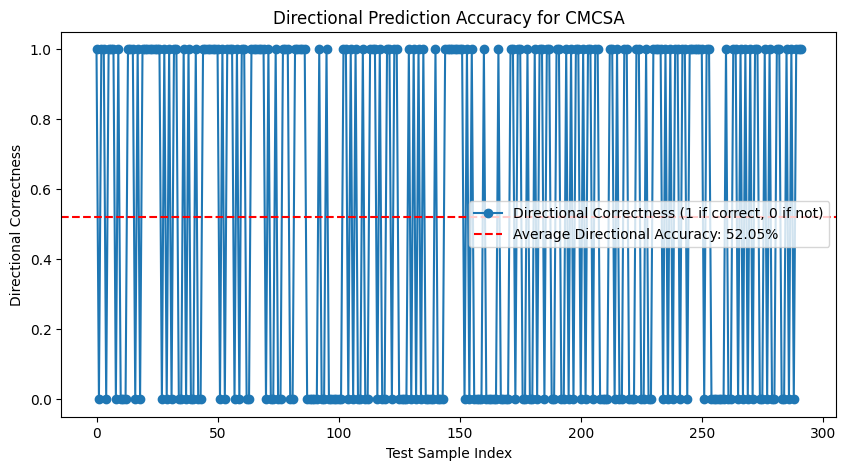

ROC AUC for CMCSA: 0.56


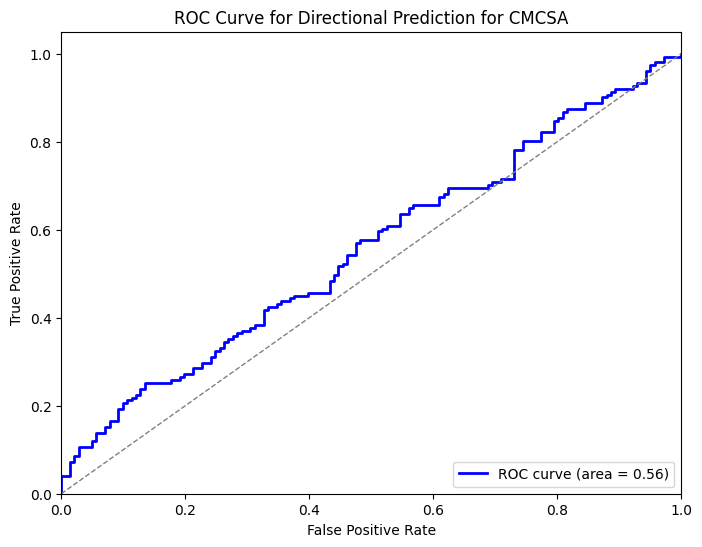


Processing ticker: COST
Ticker: COST - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0126 - val_loss: 0.0272
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 5.2801e-04 - val_loss: 0.0168
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5032e-04 - val_loss: 0.0131
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.1907e-04 - val_loss: 0.0098
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.8504e-04 - val_loss: 0.0106
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.4371e-04 - val_loss: 0.0086
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.3067e-04 - val_loss: 0.0065
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.1606e-04 - val_loss: 0.0069
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.9509e-04 - val_loss: 0.0066
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.0214e-04 - val_loss: 0.0043
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Ticker: COST - MAE: 10.43, RMSE: 10.96, MAPE: 7.00%
Directional Accuracy for COST: 48.63%


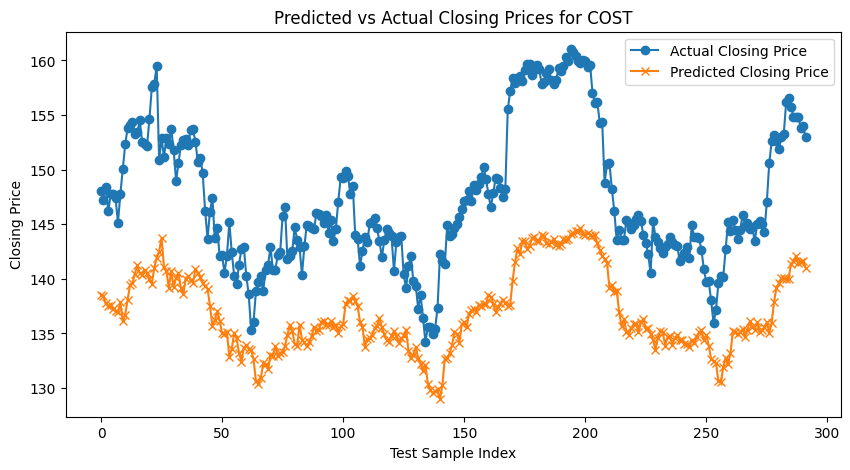

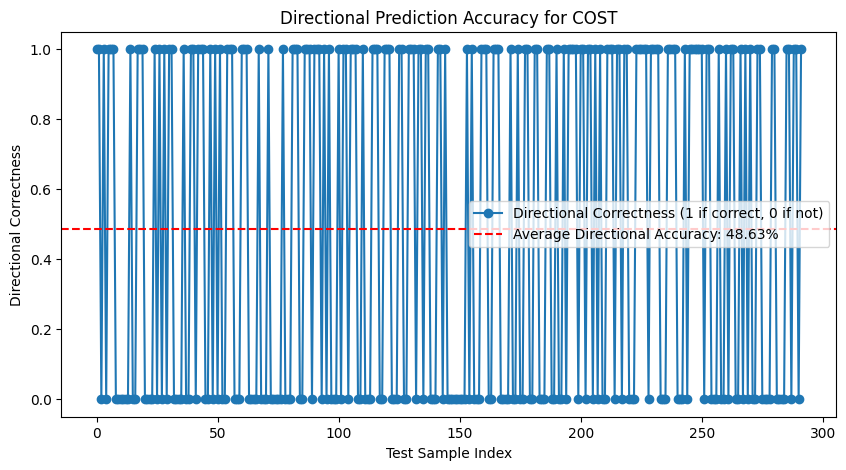

ROC AUC for COST: 0.55


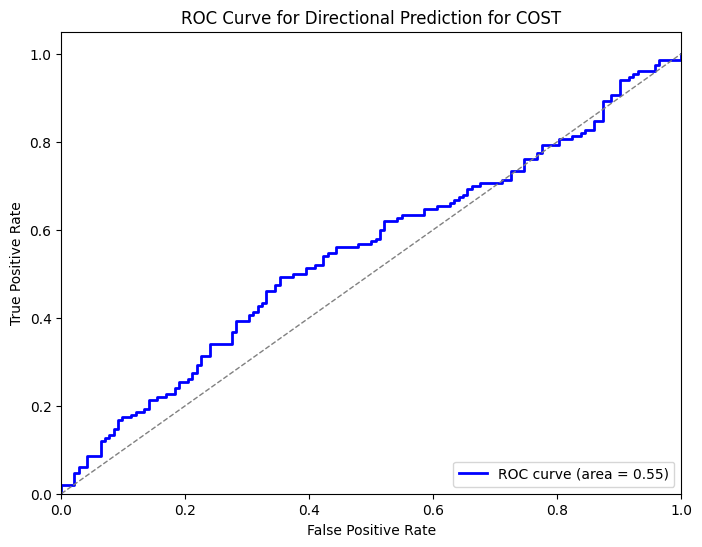


Processing ticker: CSCO
Ticker: CSCO - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.1230 - val_loss: 0.0141
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0018 - val_loss: 0.0113
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0012 - val_loss: 0.0101
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0011 - val_loss: 0.0072
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0010 - val_loss: 0.0065
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.9609e-04 - val_loss: 0.0047
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.0565e-04 - val_loss: 0.0052
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.8983e-04 - val_loss: 0.0037
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.2494e-04 - val_loss: 0.0045
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.4000e-04 - val_loss: 0.0037
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Ticker: CSCO - MAE: 1.81, RMSE: 2.05, MAPE: 6.43%
Directional Accuracy for CSCO: 49.32%


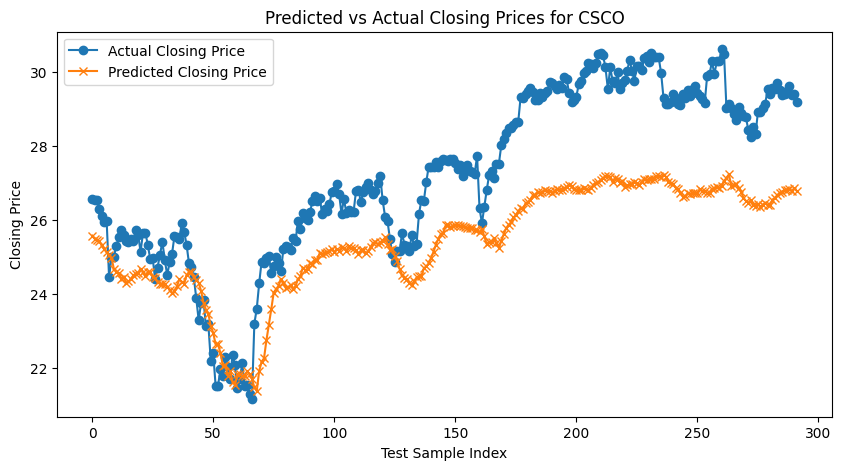

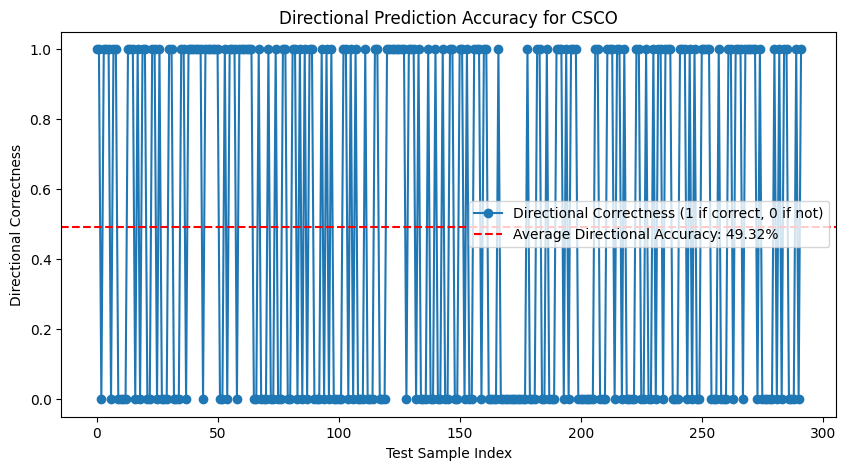

ROC AUC for CSCO: 0.51


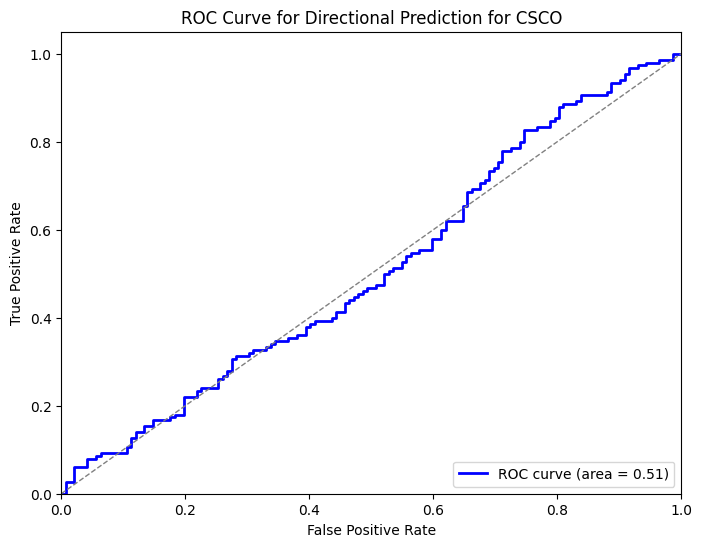


Processing ticker: CVX
Ticker: CVX - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.3395 - val_loss: 0.0059
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0036 - val_loss: 0.0039
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0022 - val_loss: 0.0035
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0016 - val_loss: 0.0031
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0015 - val_loss: 0.0030
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0013 - val_loss: 0.0028
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0012 - val_loss: 0.0025
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0011 - val_loss: 0.0024
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0012 - val_loss: 0.0025
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0012 - val_loss: 0.0022
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Ticker: CVX - MAE: 1.51, RMSE: 1.92, MAPE: 1.66%
Directional Accuracy for CVX: 54.11%


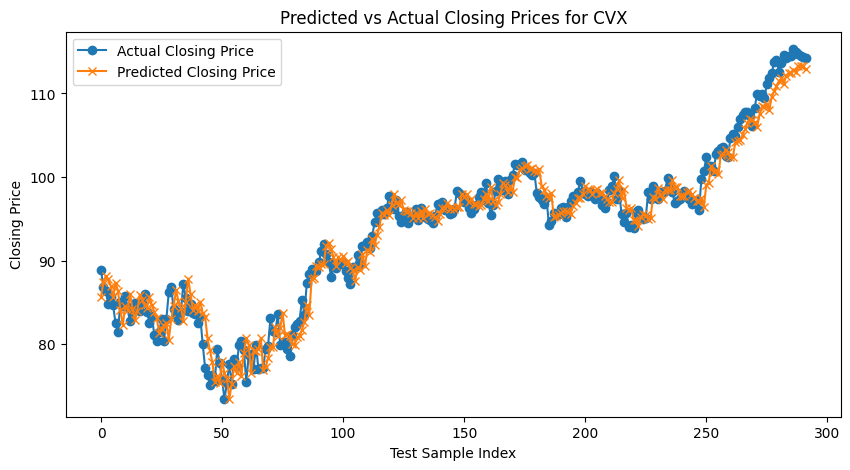

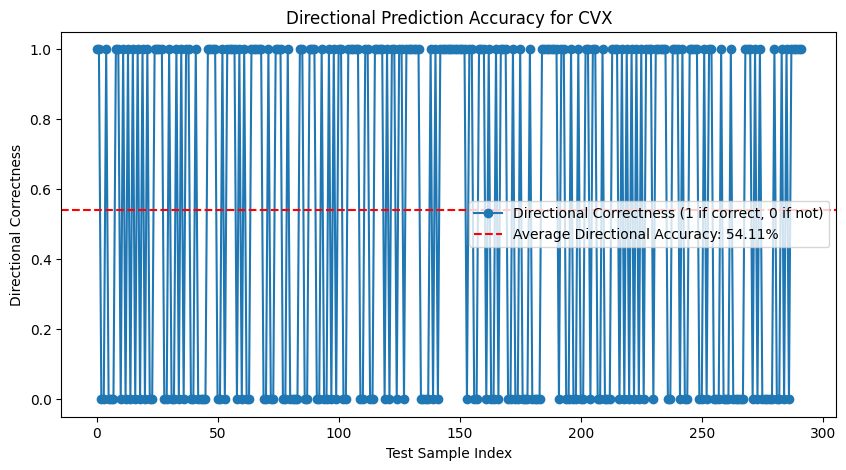

ROC AUC for CVX: 0.56


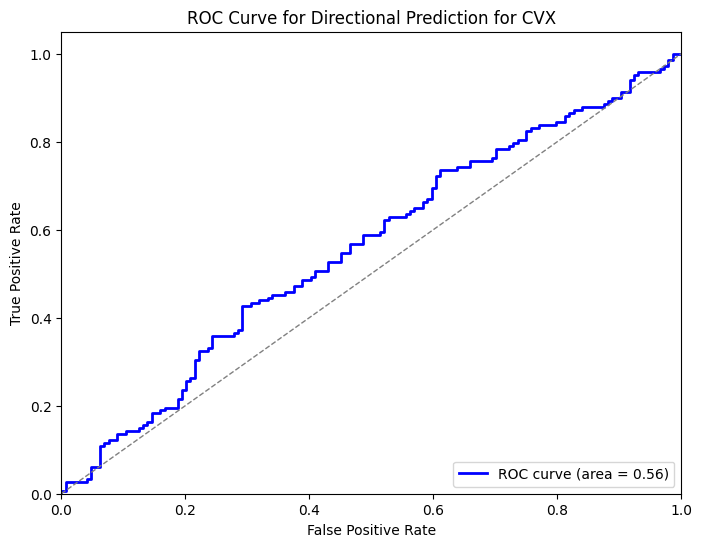


Processing ticker: DHR
Ticker: DHR - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0418 - val_loss: 0.0031
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0015 - val_loss: 0.0054
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 6.3037e-04 - val_loss: 0.0028
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 5.4324e-04 - val_loss: 0.0025
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.7822e-04 - val_loss: 0.0014
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 3.9678e-04 - val_loss: 0.0014
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 3.6525e-04 - val_loss: 0.0013
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 3.8330e-04 - val_loss: 7.8075e-04
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 5.0640e-04 - val_loss: 0.0017
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.2401e-04 - val_loss: 0.0011
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Ticker: DHR - MAE: 2.06, RMSE: 2.78, MAPE: 2.28%
Directional Accuracy for DHR: 54.79%


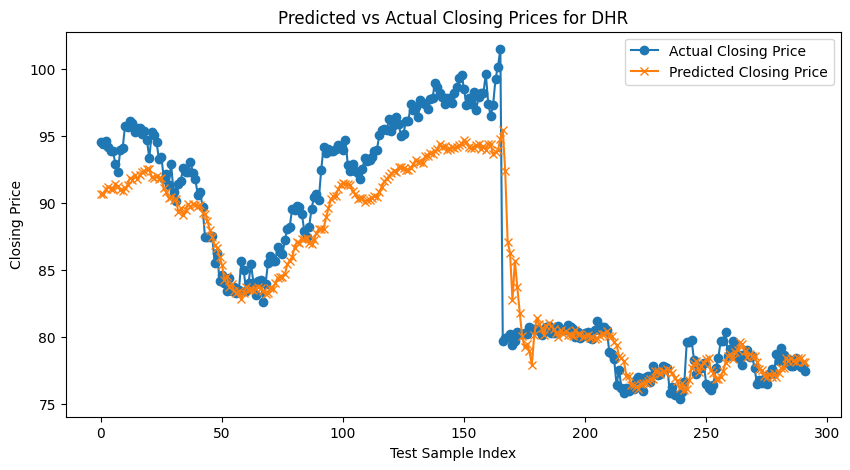

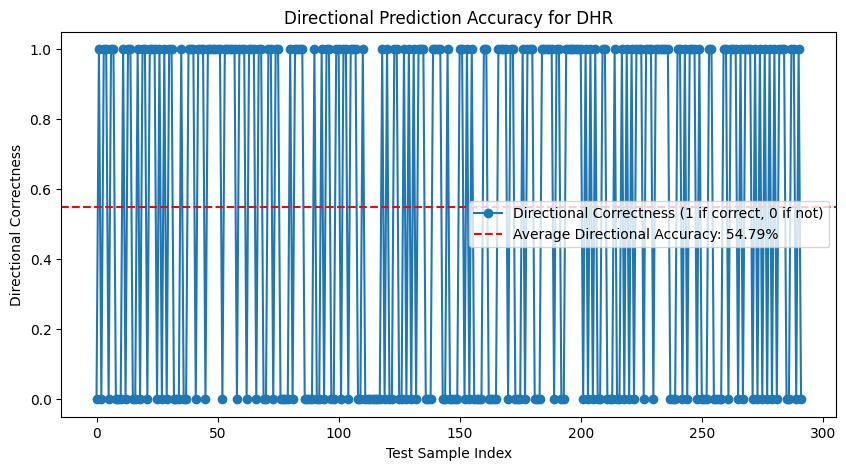

ROC AUC for DHR: 0.54


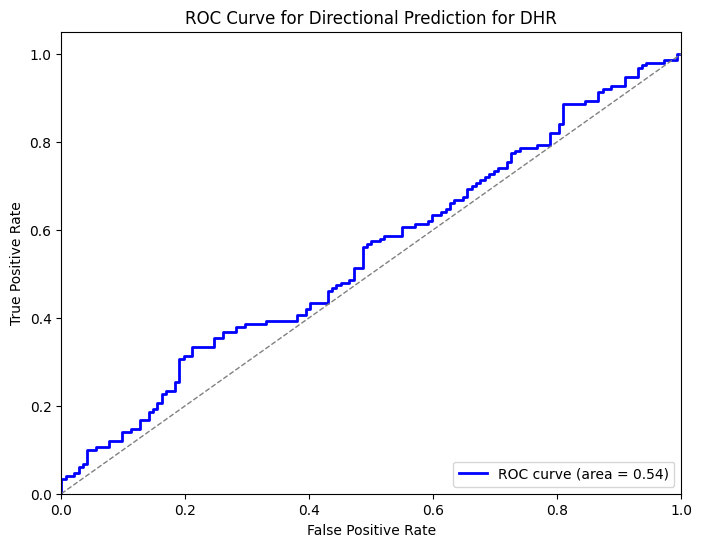


Processing ticker: DIS
Ticker: DIS - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0064 - val_loss: 0.0033
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.0180e-04 - val_loss: 0.0010
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.4097e-04 - val_loss: 0.0010
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.1380e-04 - val_loss: 0.0011
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.0839e-04 - val_loss: 0.0017
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.1754e-04 - val_loss: 0.0015
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.0096e-04 - val_loss: 0.0015
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.1160e-04 - val_loss: 0.0017
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.8444e-05 - val_loss: 0.0011
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.6686e-05 - val_loss: 6.0663e-04
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Ticker: DIS - MAE: 1.16, RMSE: 1.58, MAPE: 1.16%
Directional Accuracy for DIS: 54.45%


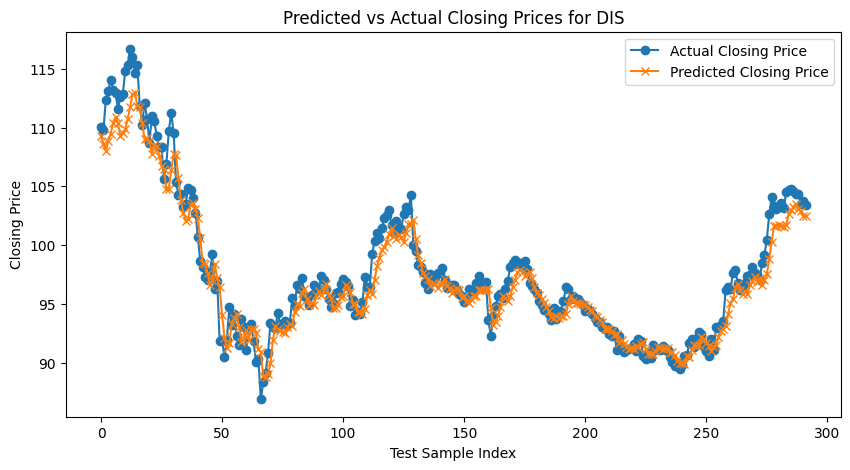

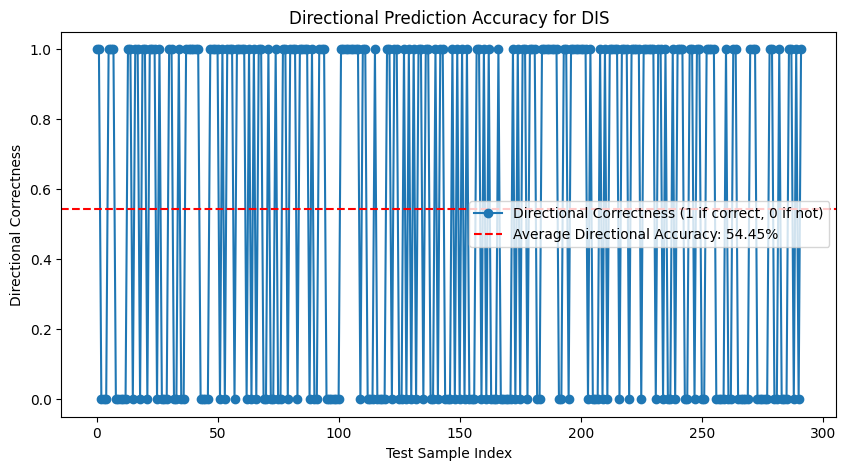

ROC AUC for DIS: 0.52


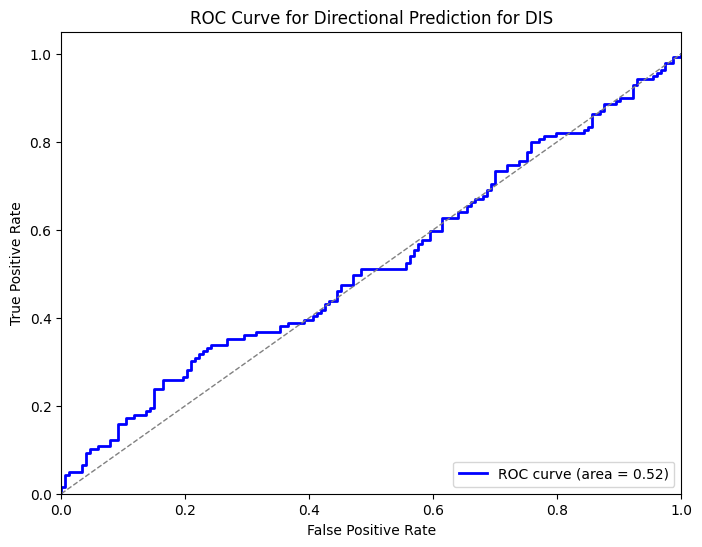


Processing ticker: GE
Ticker: GE - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0100 - val_loss: 0.0028
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.4995e-04 - val_loss: 8.7910e-04
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.2437e-04 - val_loss: 9.4497e-04
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.6618e-04 - val_loss: 9.0881e-04
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.9463e-04 - val_loss: 7.4324e-04
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.8594e-04 - val_loss: 0.0010
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.1632e-04 - val_loss: 5.7130e-04
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.7613e-04 - val_loss: 8.3277e-04
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.3757e-04 - val_loss: 6.2398e-04
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.4111e-04 - val_loss: 5.6648e-04
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Ticker: GE - MAE: 0.96, RMSE: 1.04, MAPE: 3.28%
Directional A

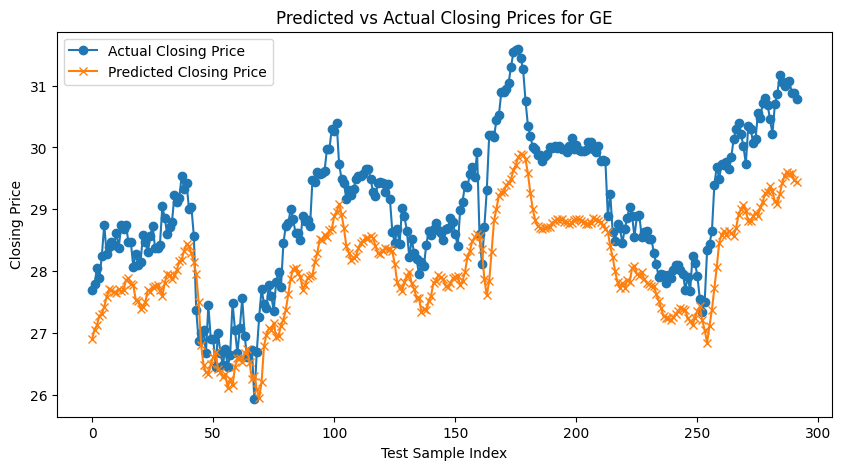

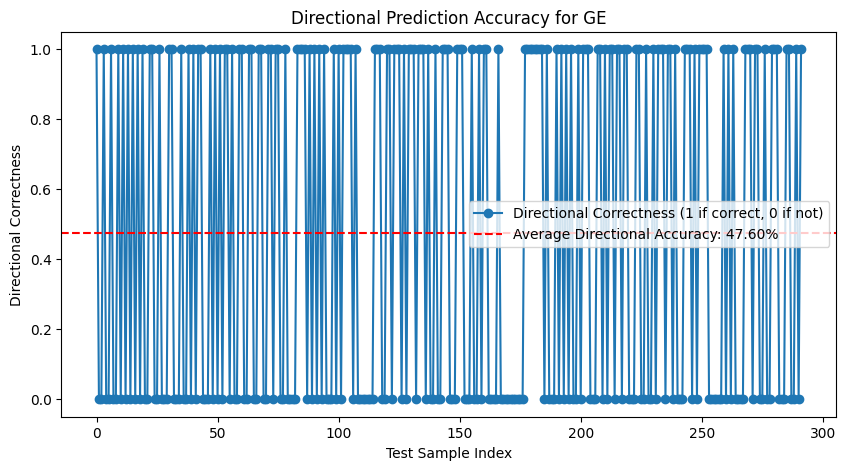

ROC AUC for GE: 0.53


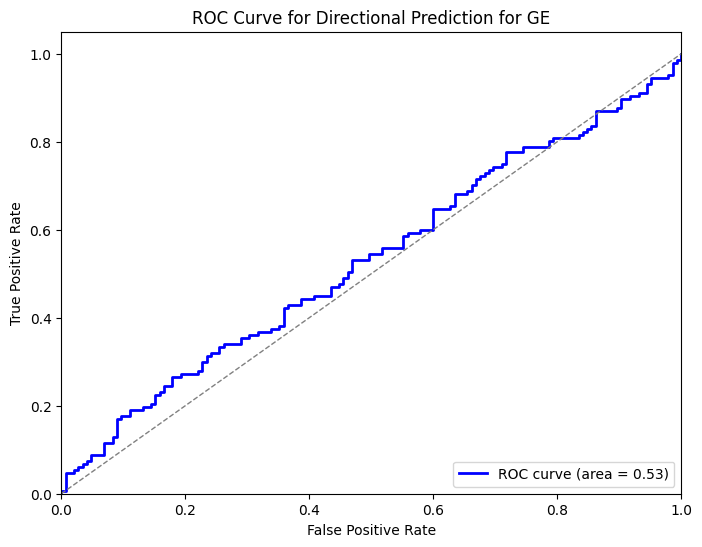


Processing ticker: GOOGL
Ticker: GOOGL - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0086 - val_loss: 0.0013
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3277e-04 - val_loss: 0.0013
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.3158e-04 - val_loss: 0.0015
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.7206e-04 - val_loss: 0.0013
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.7164e-04 - val_loss: 0.0012
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.4794e-04 - val_loss: 0.0013
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.3113e-04 - val_loss: 9.8924e-04
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.1626e-04 - val_loss: 8.8232e-04
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.1630e-04 - val_loss: 9.3016e-04
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.0625e-04 - val_loss: 0.0015
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Ticker: GOOGL - MAE: 40.53, RMSE: 42.63, MAPE: 5.26%
Directional Accuracy for GOO

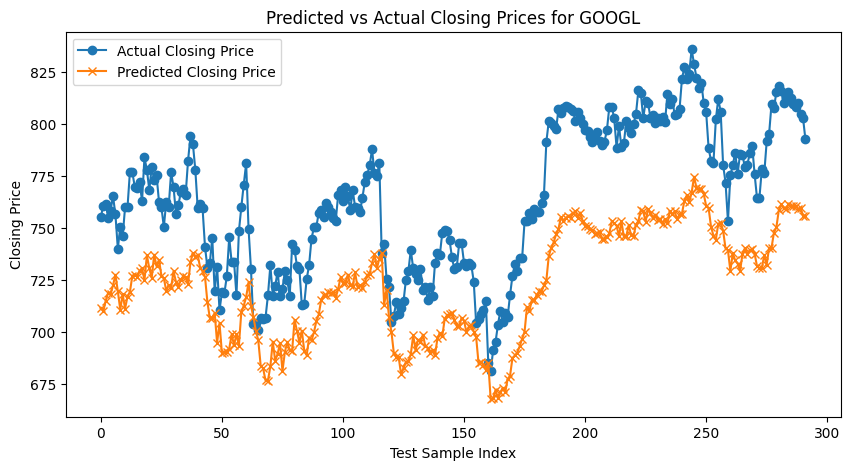

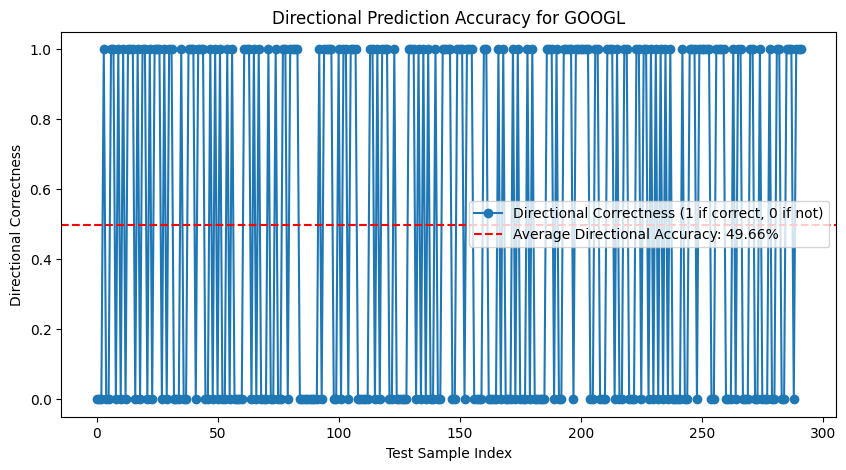

ROC AUC for GOOGL: 0.62


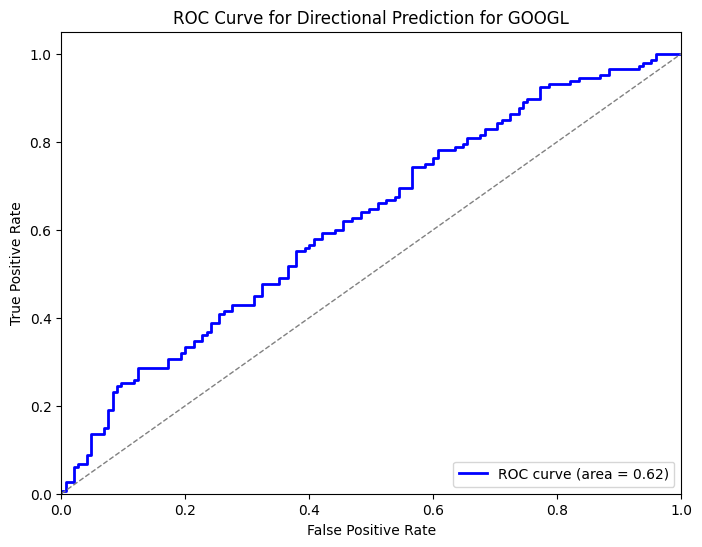


Processing ticker: GS
Ticker: GS - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.1383 - val_loss: 0.0453
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0032 - val_loss: 0.0147
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0018 - val_loss: 0.0119
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0016 - val_loss: 0.0112
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0015 - val_loss: 0.0100
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0014 - val_loss: 0.0099
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0013 - val_loss: 0.0081
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0014 - val_loss: 0.0070
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0011 - val_loss: 0.0057
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0011 - val_loss: 0.0059
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Ticker: GS - MAE: 9.20, RMSE: 14.61, MAPE: 4.88%
Directional Accuracy for GS: 46.92%


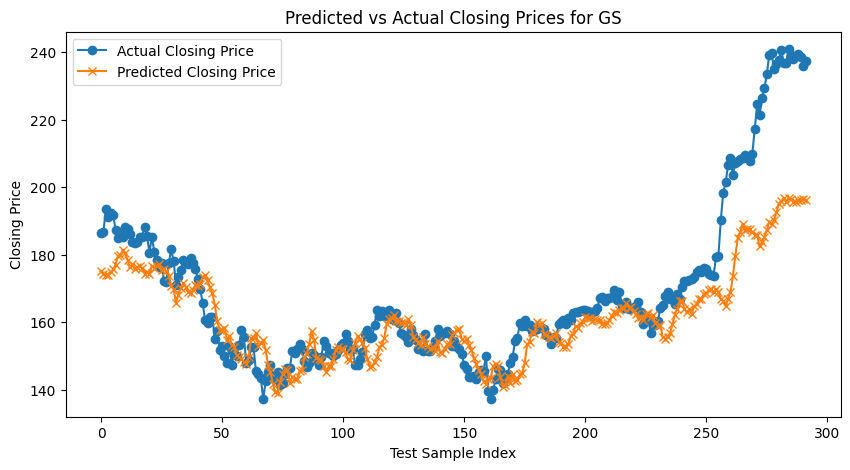

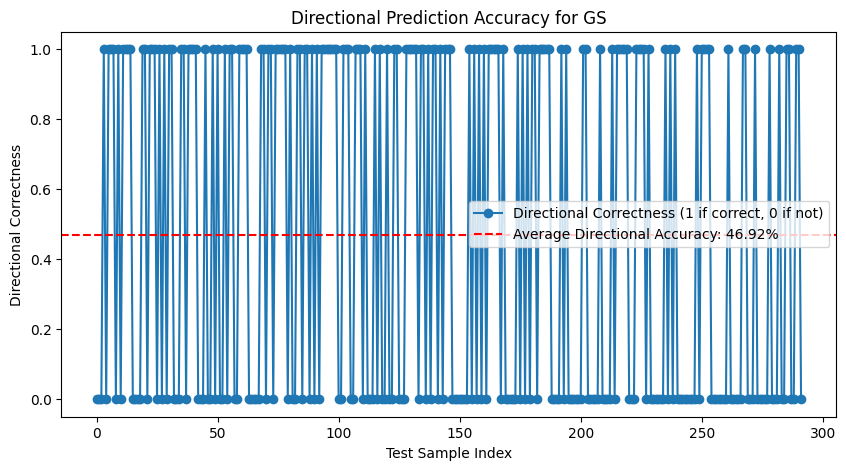

ROC AUC for GS: 0.47


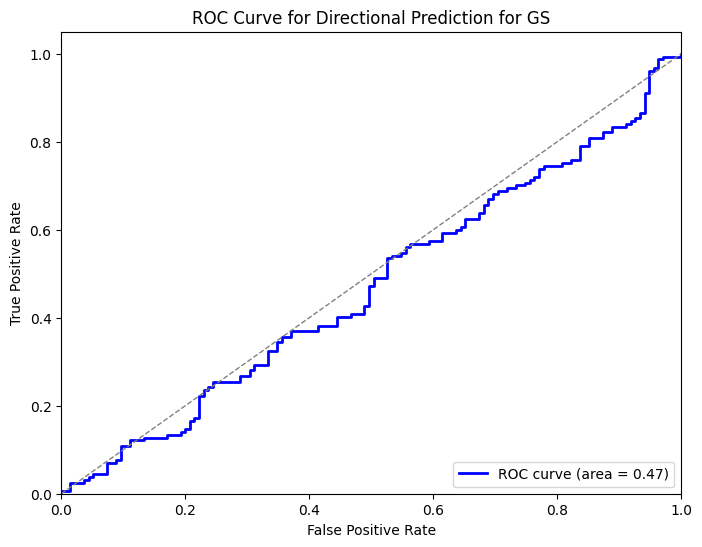


Processing ticker: HD
Ticker: HD - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0536 - val_loss: 0.0492
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.5940e-04 - val_loss: 0.0356
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8166e-04 - val_loss: 0.0257
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.1726e-04 - val_loss: 0.0260
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.6257e-04 - val_loss: 0.0210
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.8691e-04 - val_loss: 0.0199
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.2210e-04 - val_loss: 0.0169
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.4508e-04 - val_loss: 0.0170
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.1502e-04 - val_loss: 0.0136
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.2158e-04 - val_loss: 0.0140
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Ticker: HD - MAE: 25.87, RMSE: 26.33, MAPE: 20.40%
Directional Accuracy for HD: 48.97%


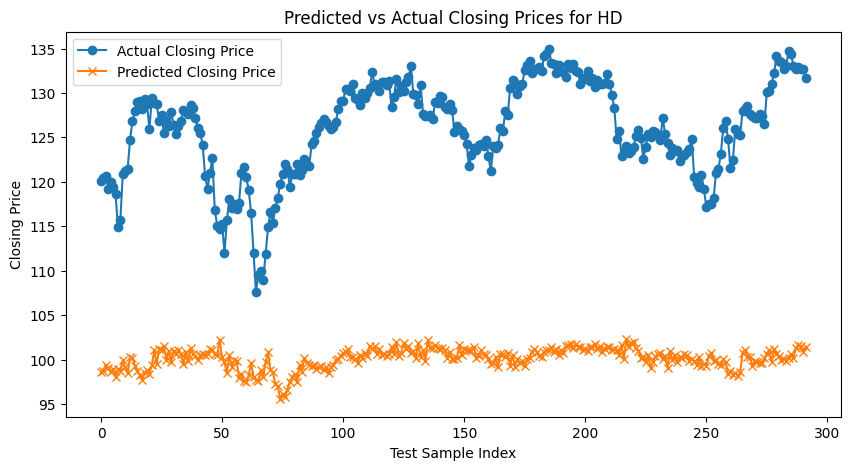

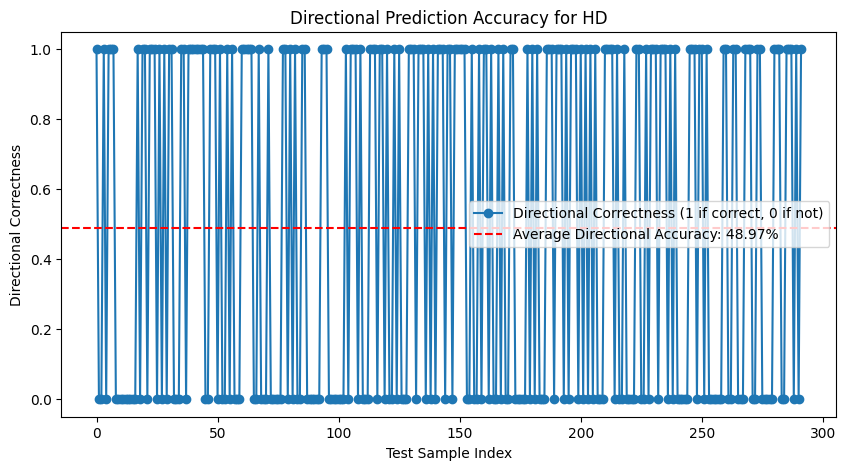

ROC AUC for HD: 0.59


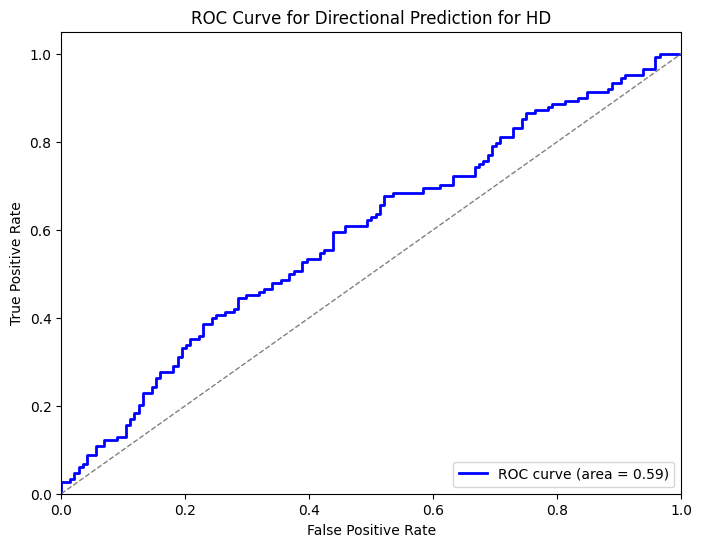


Processing ticker: HON
Ticker: HON - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0136 - val_loss: 0.0049
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.8935e-04 - val_loss: 0.0040
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0941e-04 - val_loss: 0.0015
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3079e-04 - val_loss: 0.0029
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.4357e-04 - val_loss: 0.0022
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5773e-04 - val_loss: 0.0020
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.4439e-04 - val_loss: 0.0023
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.2993e-04 - val_loss: 0.0010
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 2.4713e-04 - val_loss: 0.0014
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.5827e-04 - val_loss: 7.7881e-04
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Ticker: HON - MAE: 4.49, RMSE: 4.92, MAPE: 4.09%
Directional Accuracy for HON: 48.63%


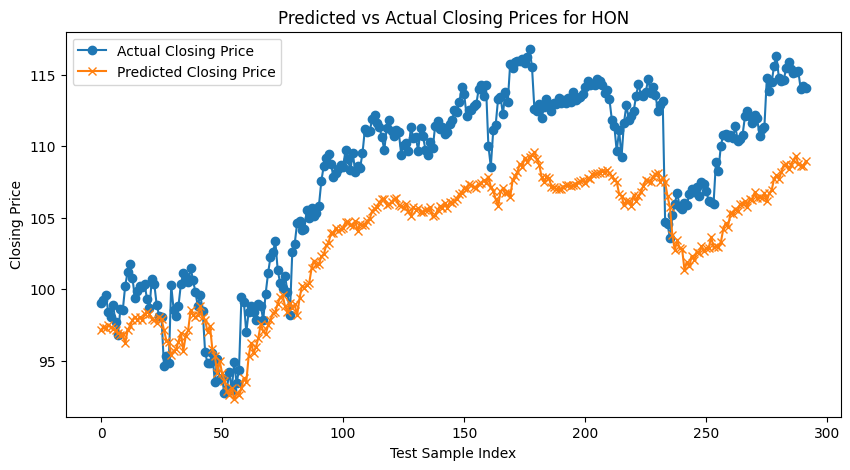

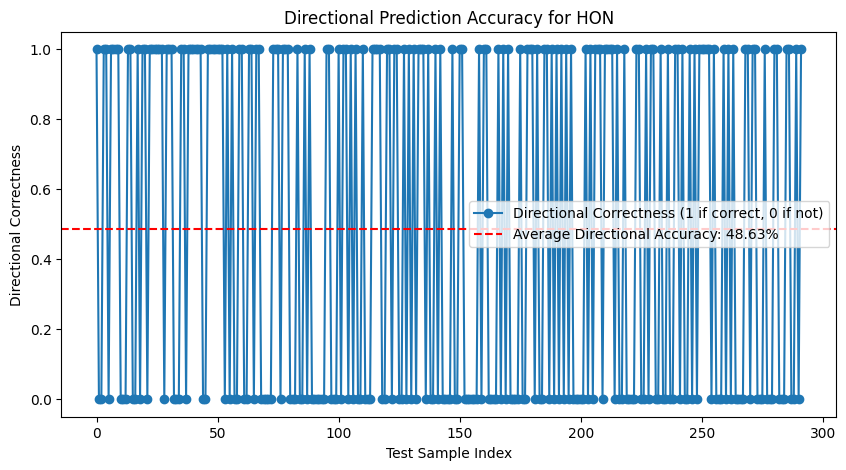

ROC AUC for HON: 0.52


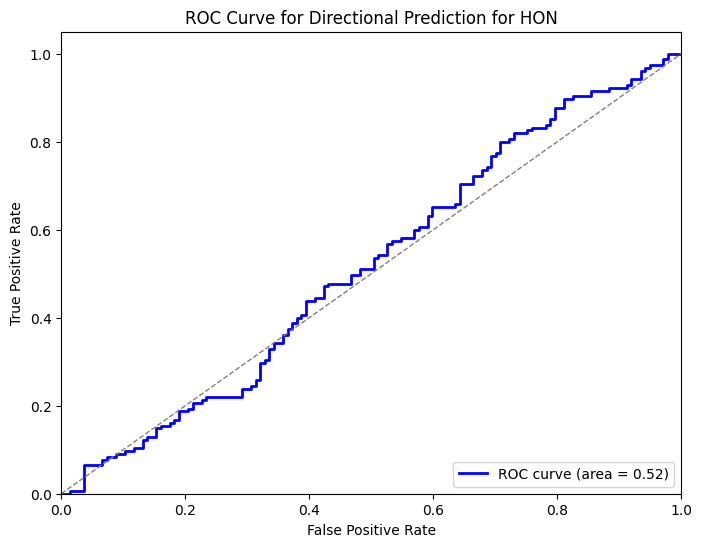


Processing ticker: IBM
Ticker: IBM - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.1726 - val_loss: 0.0112
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0044 - val_loss: 0.0032
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0031 - val_loss: 0.0029
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0024 - val_loss: 0.0027
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0021 - val_loss: 0.0027
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0020 - val_loss: 0.0025
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0019 - val_loss: 0.0022
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0017 - val_loss: 0.0019
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0016 - val_loss: 0.0018
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Ticker: IBM - MAE: 2.28, RMSE: 2.95, MAPE: 1.68%
Directional Accuracy for IBM: 51.71%


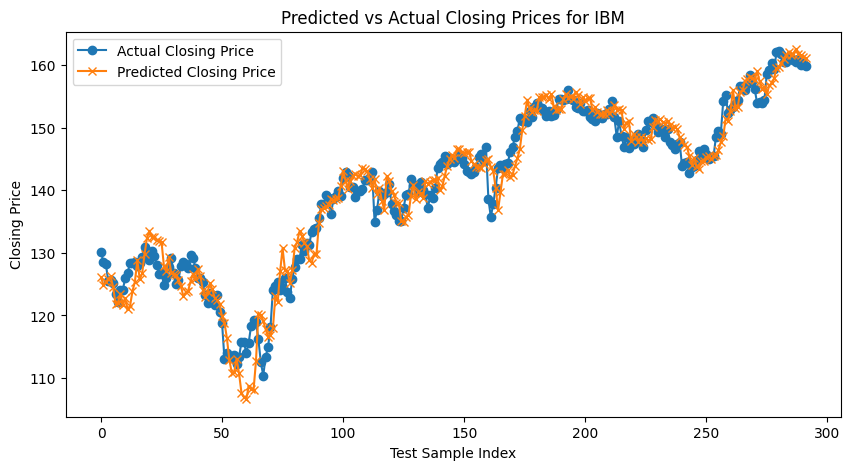

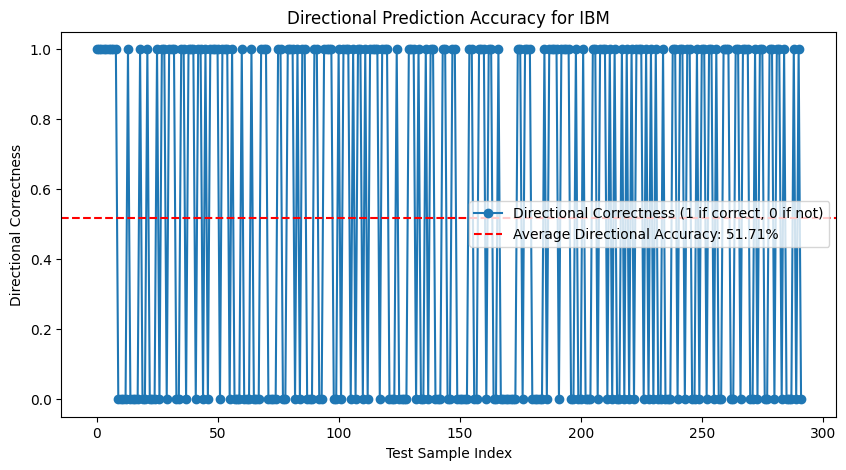

ROC AUC for IBM: 0.53


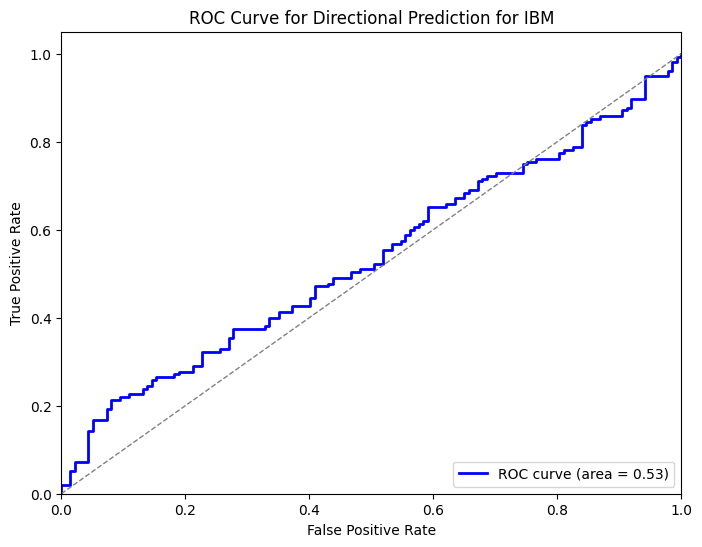


Processing ticker: INTU
Ticker: INTU - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0042 - val_loss: 0.0170
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2095e-04 - val_loss: 0.0081
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1707e-04 - val_loss: 0.0067
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6295e-04 - val_loss: 0.0063
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1636e-04 - val_loss: 0.0051
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.8545e-04 - val_loss: 0.0037
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.9984e-04 - val_loss: 0.0033
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.5182e-04 - val_loss: 0.0030
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 2.7937e-04 - val_loss: 0.0036
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.1486e-04 - val_loss: 0.0031
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Ticker: INTU - MAE: 6.96, RMSE: 7.61, MAPE: 6.57%
Directional Accuracy for INTU: 43.84%


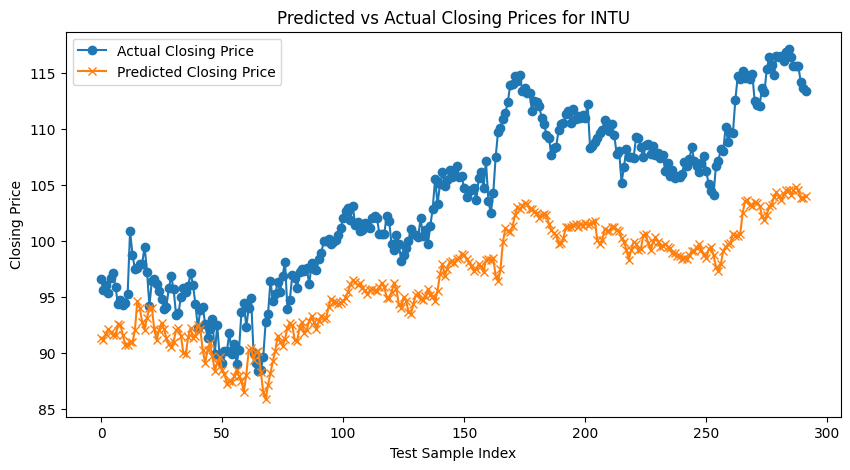

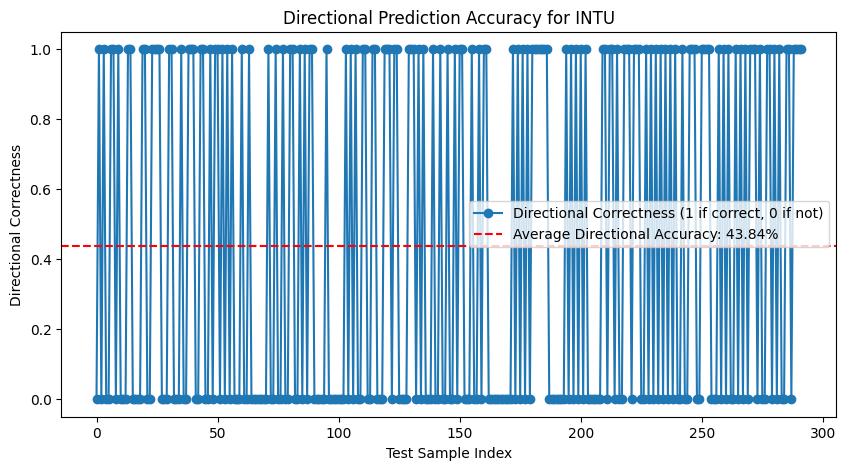

ROC AUC for INTU: 0.59


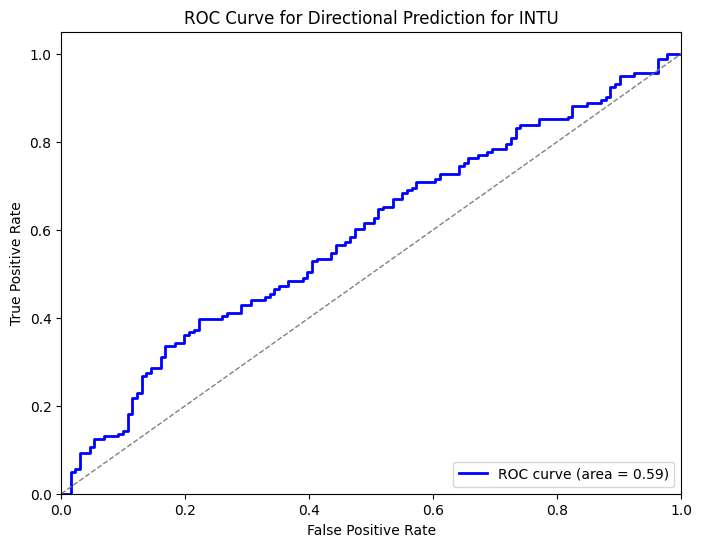


Processing ticker: JNJ
Ticker: JNJ - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0727 - val_loss: 0.0025
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.9349e-04 - val_loss: 0.0018
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3217e-04 - val_loss: 0.0014
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1270e-04 - val_loss: 0.0014
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7655e-04 - val_loss: 0.0019
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2566e-04 - val_loss: 7.6079e-04
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0024e-04 - val_loss: 8.3534e-04
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1186e-04 - val_loss: 7.3232e-04
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9659e-04 - val_loss: 6.9707e-04
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.6266e-04 - val_loss: 6.8381e-04
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Ticker: JNJ - MAE: 4.61, RMSE: 5.36, MAPE: 4.12%
Directional Accuracy for

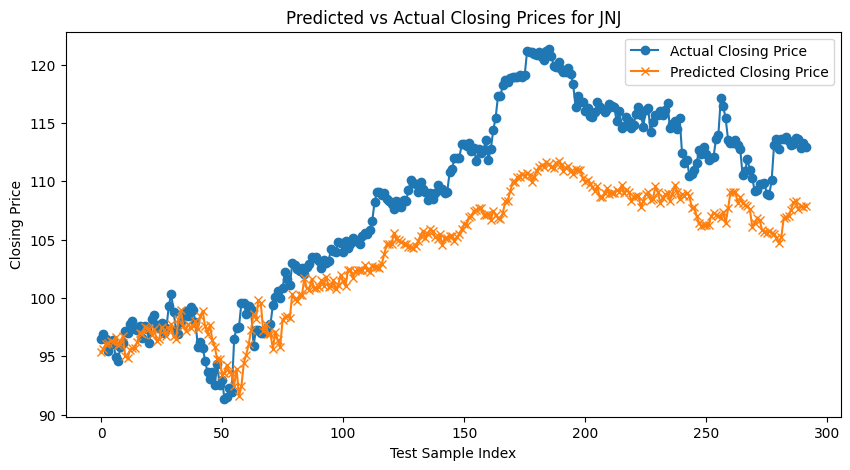

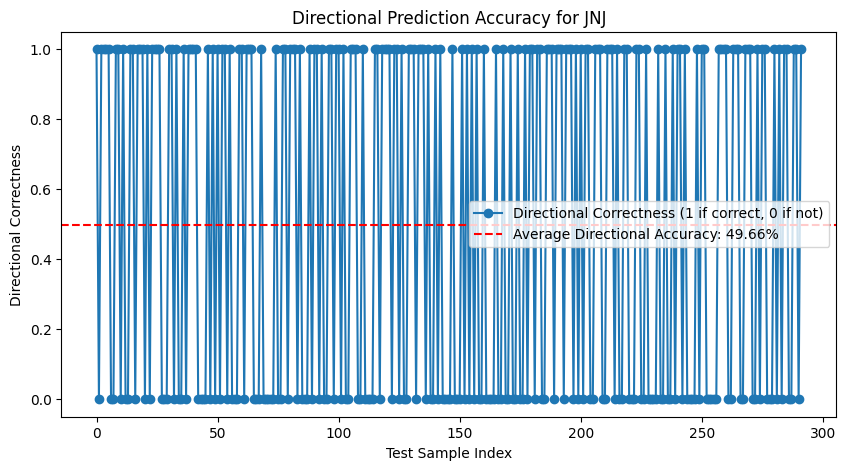

ROC AUC for JNJ: 0.55


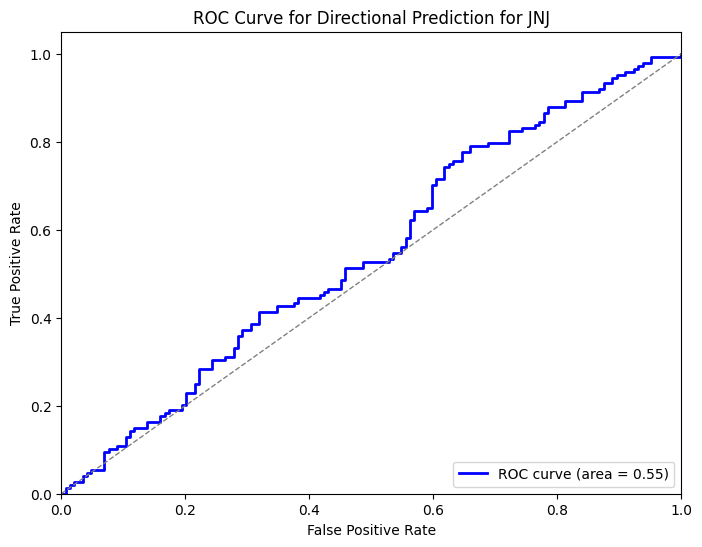


Processing ticker: JPM
Ticker: JPM - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0066 - val_loss: 0.0019
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.4515e-04 - val_loss: 4.2234e-04
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 2.6151e-04 - val_loss: 3.2054e-04
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.9486e-04 - val_loss: 4.2343e-04
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 2.0627e-04 - val_loss: 2.5962e-04
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.9482e-04 - val_loss: 3.9170e-04
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.0215e-04 - val_loss: 4.3000e-04
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.9850e-04 - val_loss: 3.0250e-04
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.1248e-04 - val_loss: 3.8215e-04
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.0243e-04 - val_loss: 3.5214e-04
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Ticker: JPM - MAE: 1.58, RMSE: 2.09, MAPE: 2.36%
Directio

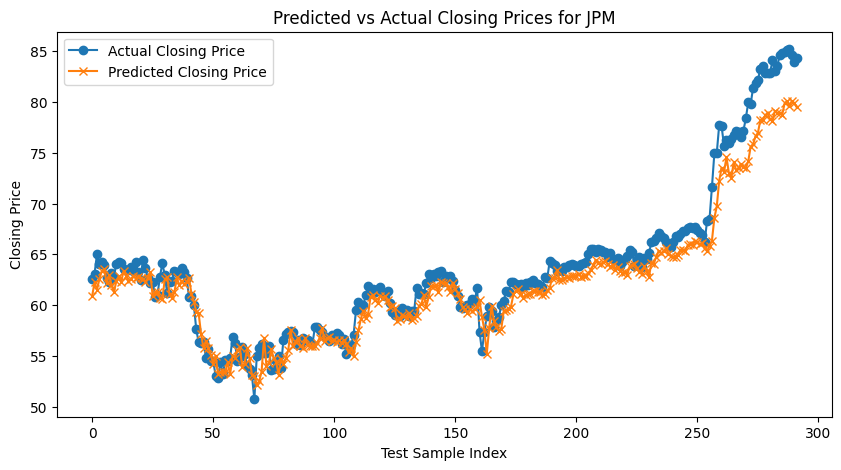

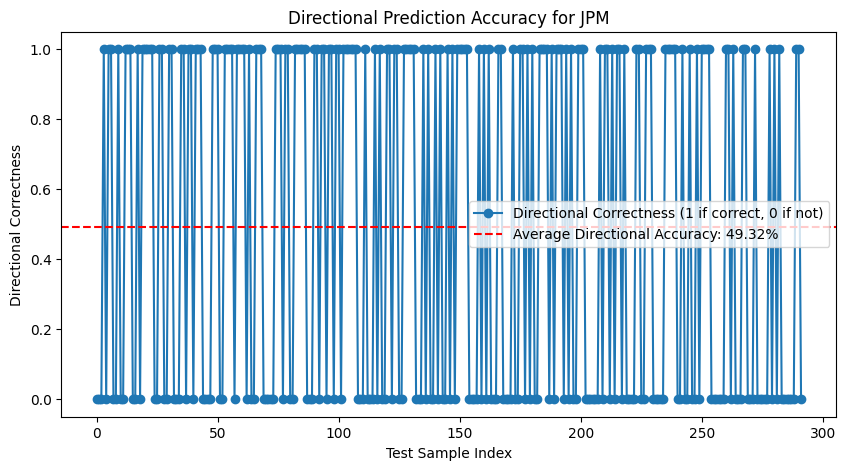

ROC AUC for JPM: 0.48


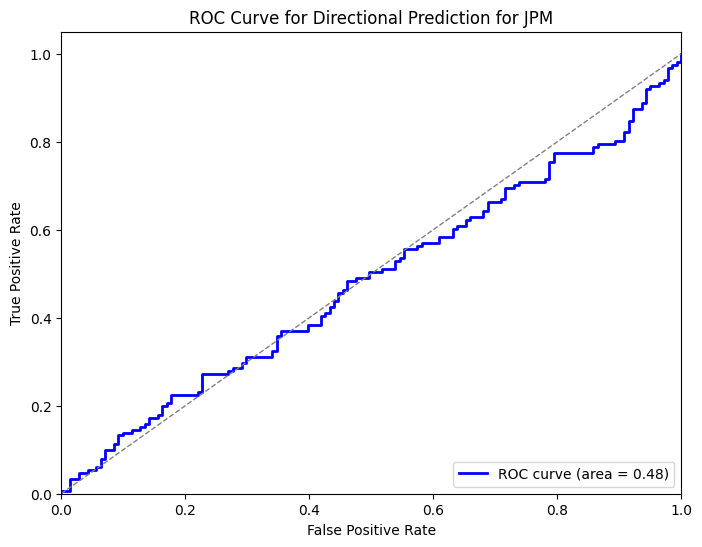


Processing ticker: KO
Ticker: KO - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0185 - val_loss: 8.6895e-04
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0010 - val_loss: 0.0018
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.4458e-04 - val_loss: 0.0012
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2554e-04 - val_loss: 0.0013
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.4847e-04 - val_loss: 7.5218e-04
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.8056e-04 - val_loss: 8.0491e-04
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5999e-04 - val_loss: 0.0011
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3956e-04 - val_loss: 9.1739e-04
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0975e-04 - val_loss: 0.0010
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2013e-04 - val_loss: 6.8622e-04
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Ticker: KO - MAE: 0.87, RMSE: 1.00, MAPE: 2.06%
Directional Accuracy for KO: 

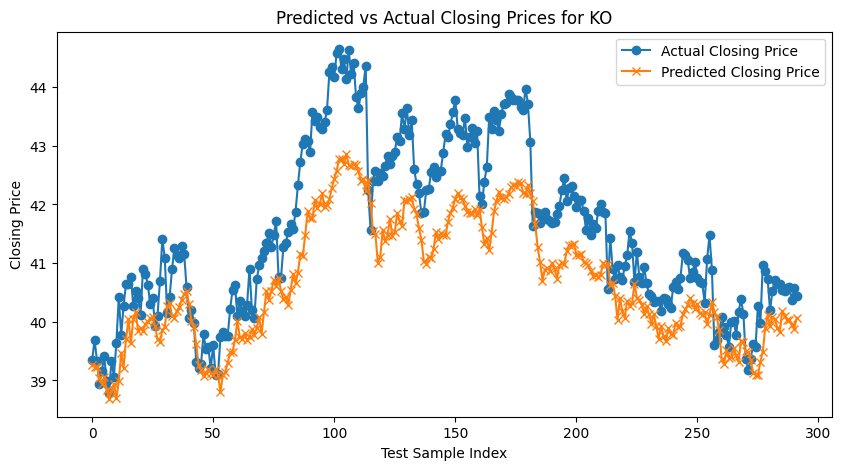

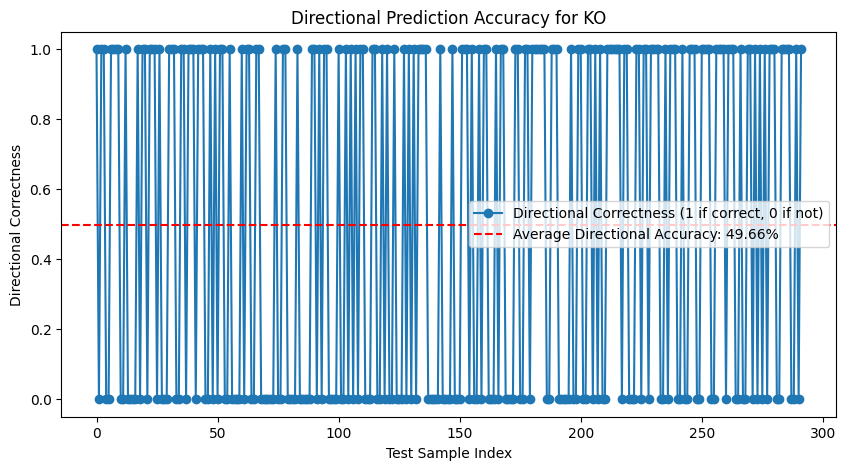

ROC AUC for KO: 0.55


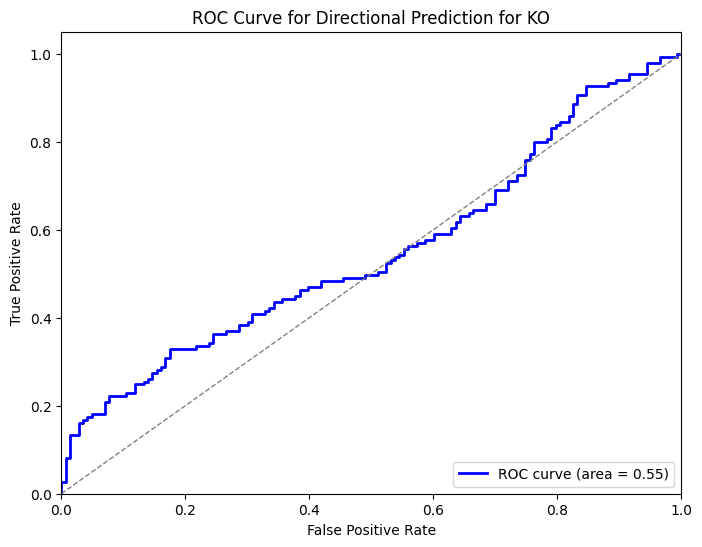


Processing ticker: LLY
Ticker: LLY - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0139 - val_loss: 0.0049
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.2529e-04 - val_loss: 0.0060
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.8573e-04 - val_loss: 0.0042
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.5112e-04 - val_loss: 0.0033
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.6294e-04 - val_loss: 0.0032
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.4071e-04 - val_loss: 0.0032
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.3275e-04 - val_loss: 0.0020
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.3275e-04 - val_loss: 0.0026
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.2756e-04 - val_loss: 0.0019
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.2611e-04 - val_loss: 0.0014
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Ticker: LLY - MAE: 1.95, RMSE: 2.29, MAPE: 2.57%
Directional Accuracy for LLY: 55.14%


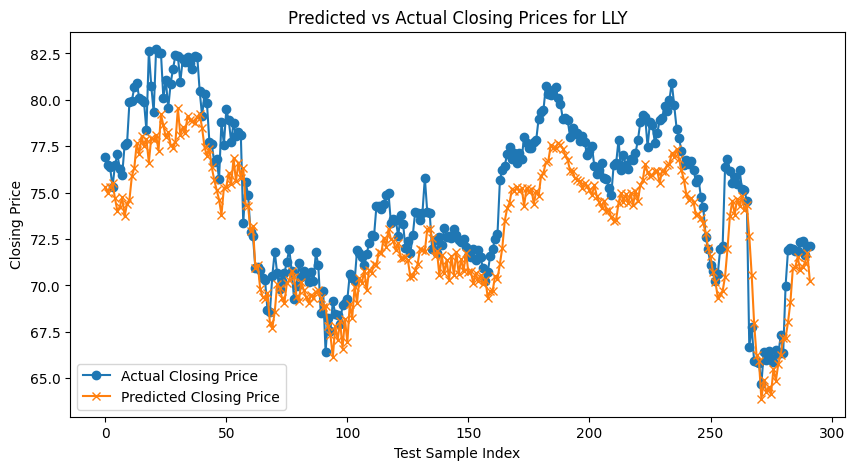

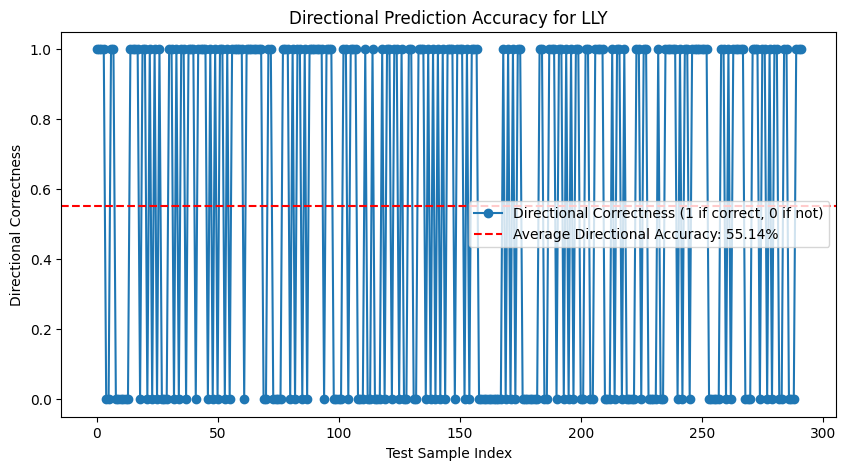

ROC AUC for LLY: 0.53


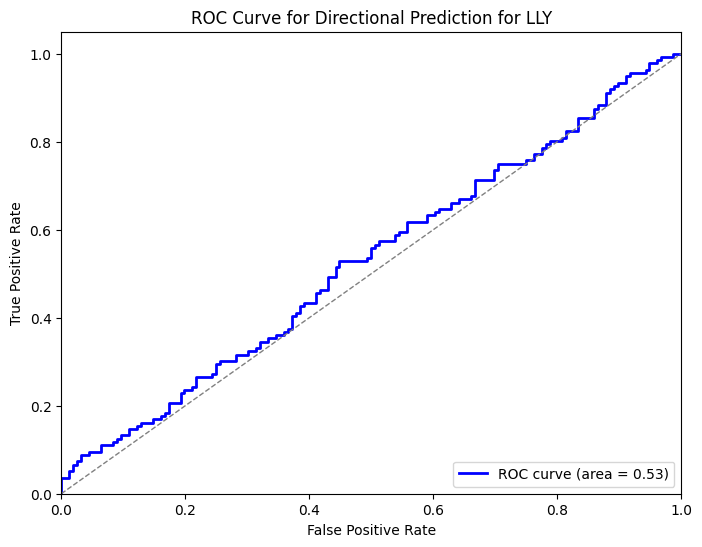


Processing ticker: MCD
Ticker: MCD - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0298 - val_loss: 0.0046
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.0662e-04 - val_loss: 0.0035
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7469e-04 - val_loss: 0.0030
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4543e-04 - val_loss: 0.0028
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6585e-04 - val_loss: 0.0027
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8505e-04 - val_loss: 0.0024
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4284e-04 - val_loss: 0.0023
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2057e-04 - val_loss: 0.0015
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4906e-04 - val_loss: 0.0019
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5815e-04 - val_loss: 0.0020
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Ticker: MCD - MAE: 10.72, RMSE: 11.12, MAPE: 9.24%
Directional Accuracy for MCD: 43.84%


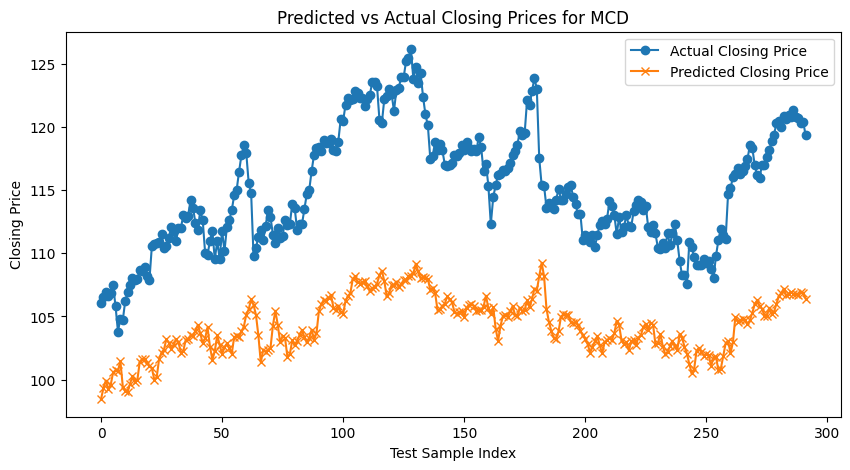

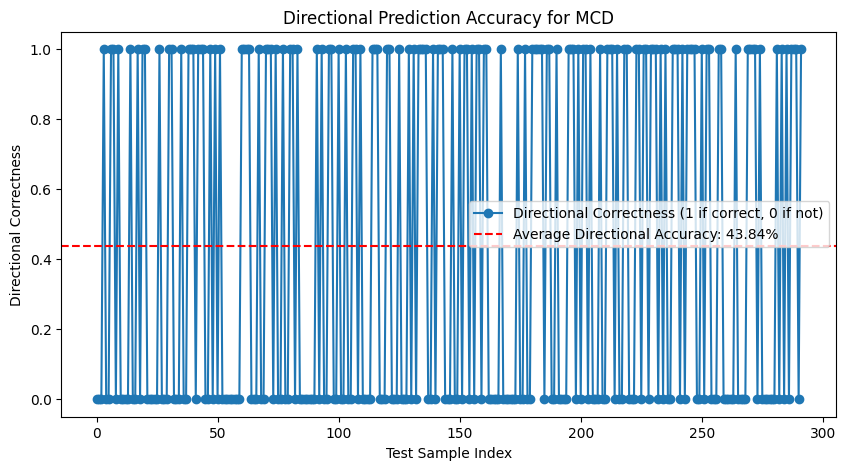

ROC AUC for MCD: 0.53


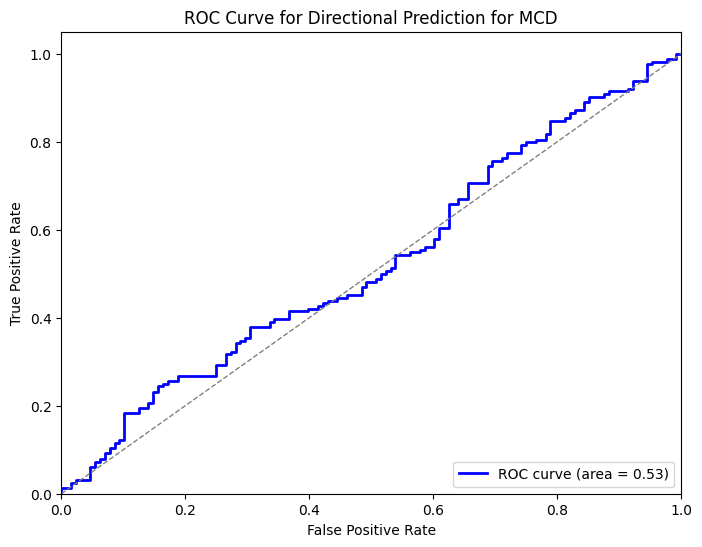


Processing ticker: MRK
Ticker: MRK - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.4252 - val_loss: 0.0101
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0032 - val_loss: 0.0058
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0017 - val_loss: 0.0046
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0014 - val_loss: 0.0053
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0012 - val_loss: 0.0030
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0013 - val_loss: 0.0039
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0010 - val_loss: 0.0035
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0010 - val_loss: 0.0040
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0010 - val_loss: 0.0030
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.0040e-04 - val_loss: 0.0027
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Ticker: MRK - MAE: 2.22, RMSE: 2.88, MAPE: 3.87%
Directional Accuracy for MRK: 53.77%


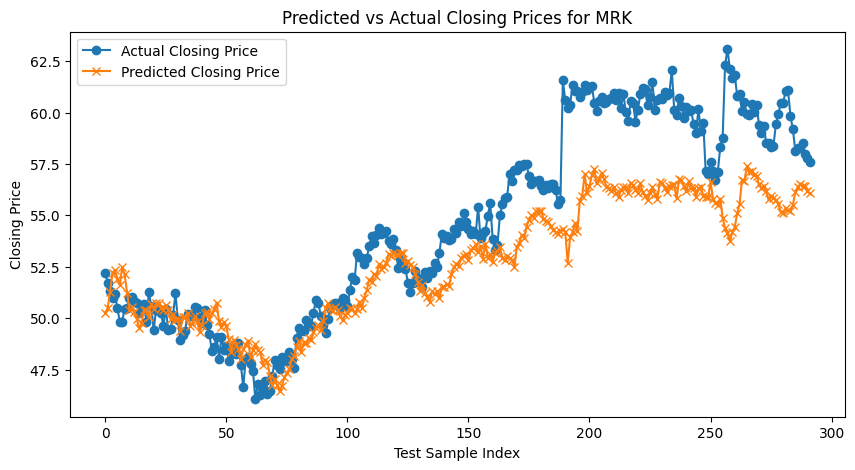

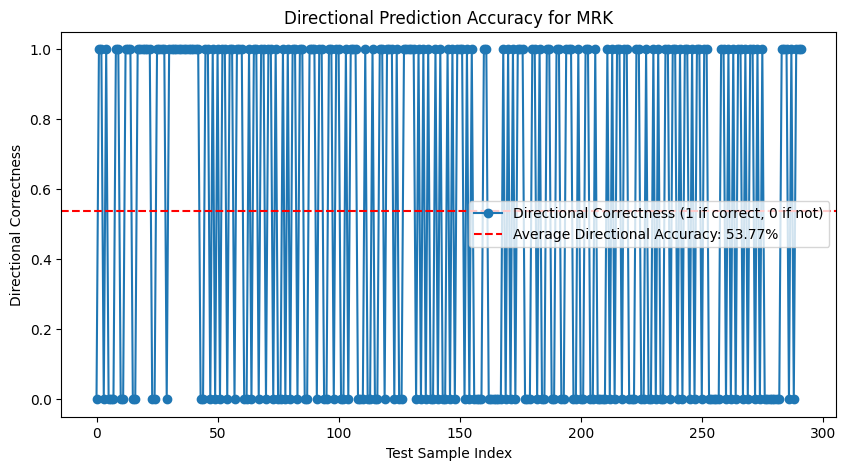

ROC AUC for MRK: 0.54


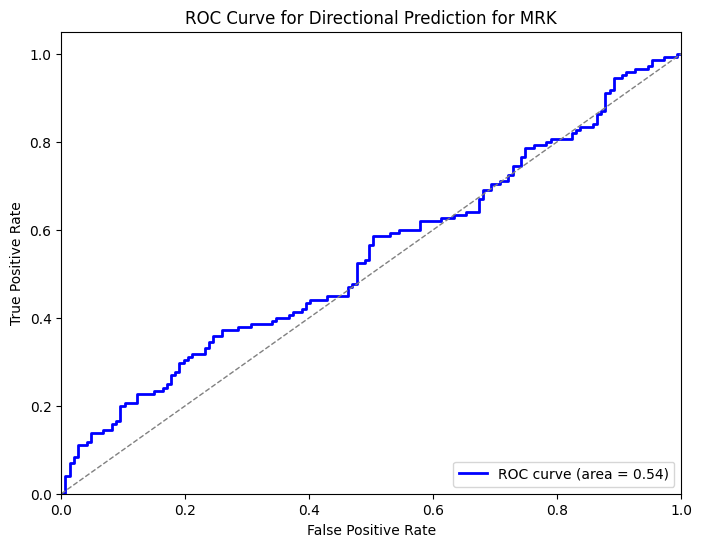


Processing ticker: MSFT
Ticker: MSFT - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0153 - val_loss: 0.0092
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.4664e-04 - val_loss: 0.0036
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5144e-04 - val_loss: 0.0029
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5205e-04 - val_loss: 0.0030
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0529e-04 - val_loss: 0.0026
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5555e-04 - val_loss: 0.0017
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7863e-04 - val_loss: 0.0015
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.2343e-04 - val_loss: 0.0015
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 2.8218e-04 - val_loss: 0.0017
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.7649e-04 - val_loss: 0.0014
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Ticker: MSFT - MAE: 3.19, RMSE: 3.60, MAPE: 5.80%
Directional Accuracy for MSFT: 47.26%


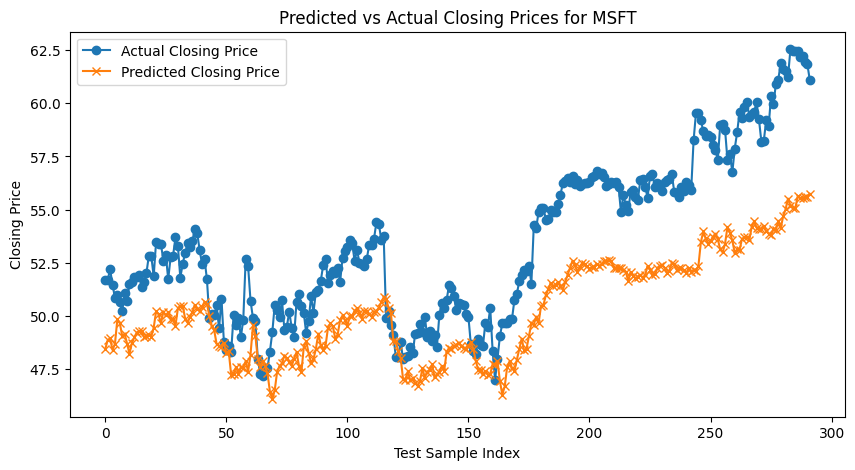

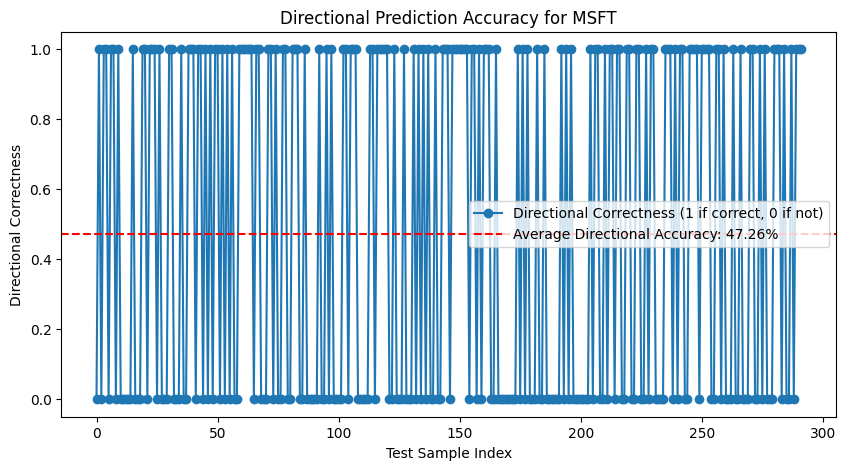

ROC AUC for MSFT: 0.55


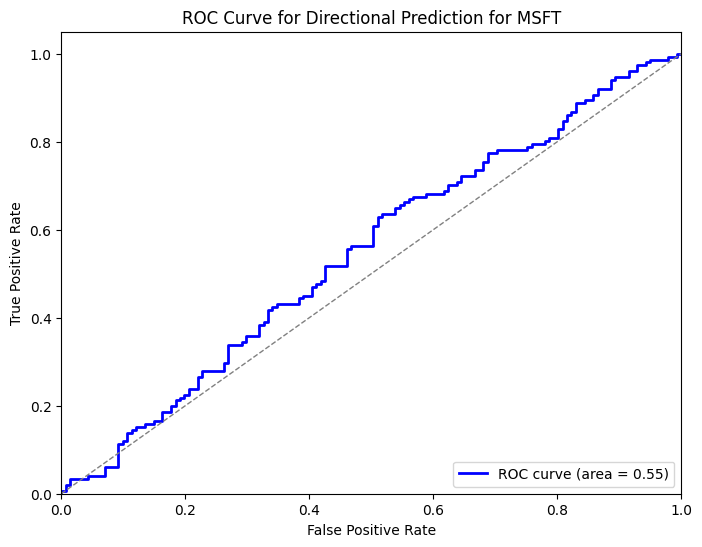


Processing ticker: NVDA
Ticker: NVDA - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.1817e-04 - val_loss: 5.4380e-04
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.9827e-05 - val_loss: 4.0020e-04
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8499e-05 - val_loss: 1.1976e-04
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7032e-05 - val_loss: 1.3329e-04
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.8383e-05 - val_loss: 7.4500e-05
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.2452e-05 - val_loss: 8.1691e-05
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.9612e-05 - val_loss: 4.8322e-05
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.7380e-05 - val_loss: 4.5027e-05
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.9339e-05 - val_loss: 4.1479e-05
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Ticker: NVDA - MAE: 4.41, RMSE: 6.70, MAPE: 6.91%
Directi

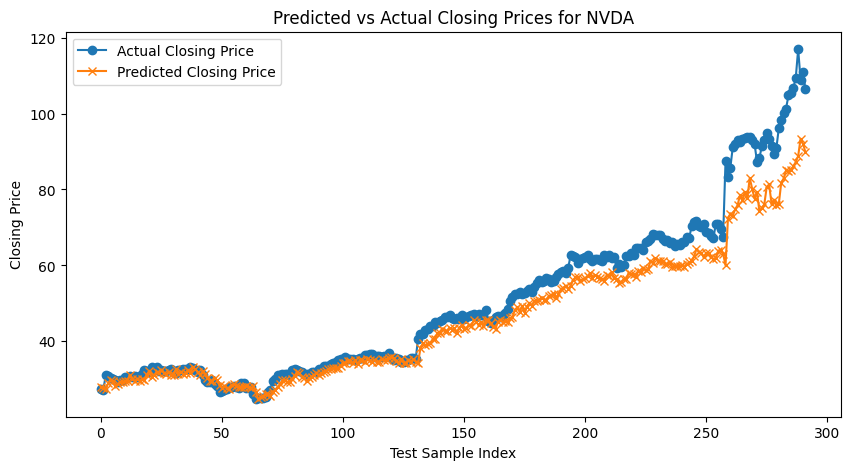

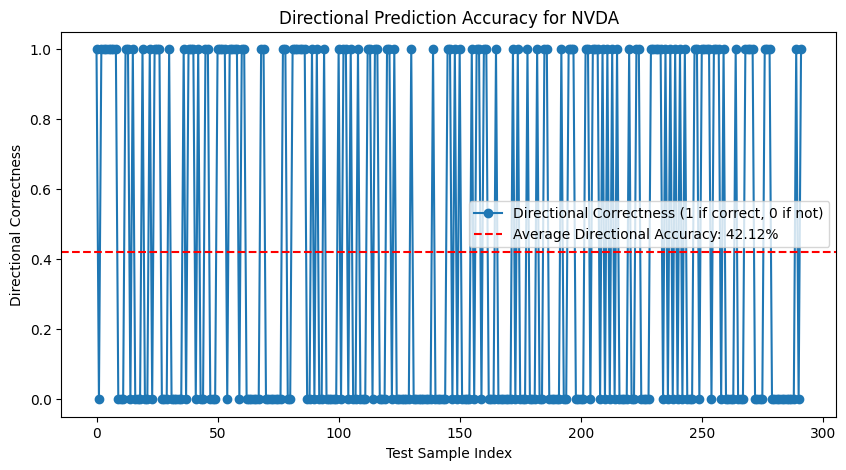

ROC AUC for NVDA: 0.49


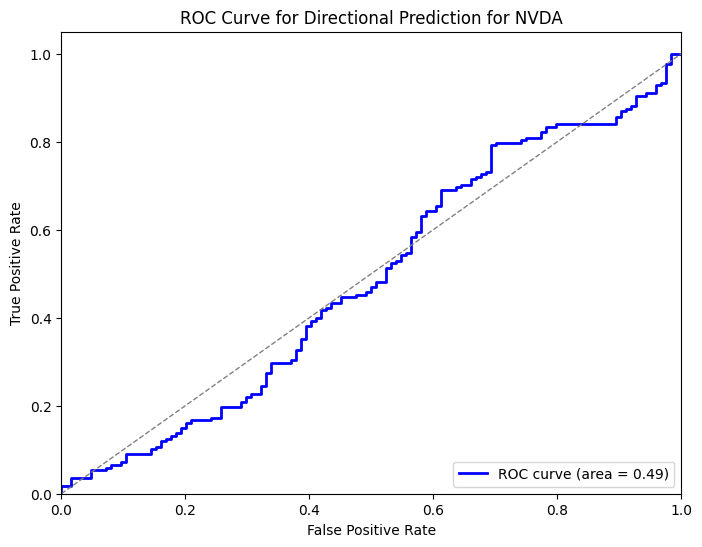


Processing ticker: ORCL
Ticker: ORCL - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0233 - val_loss: 0.0096
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0028 - val_loss: 0.0027
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0023 - val_loss: 0.0038
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0019 - val_loss: 0.0022
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0015 - val_loss: 0.0021
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0014 - val_loss: 0.0017
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0014 - val_loss: 0.0040
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0011 - val_loss: 0.0022
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Ticker: ORCL - MAE: 0.64, RMSE: 0.78, MAPE: 1.68%
Directional Accuracy for ORCL: 50.00%


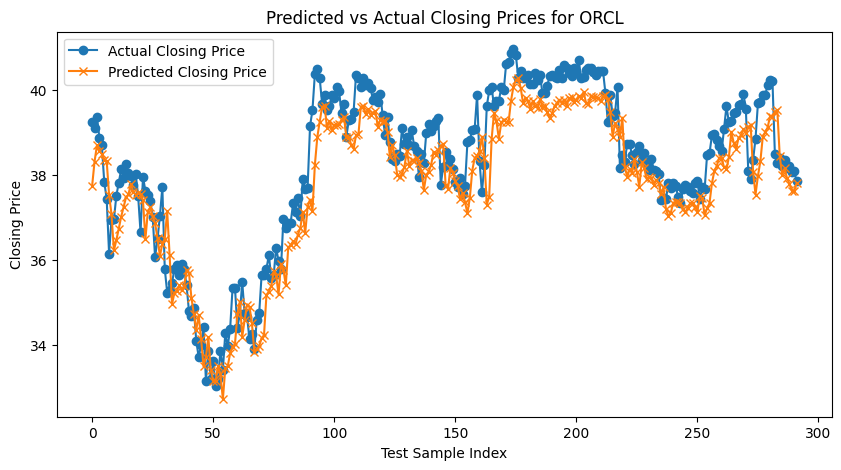

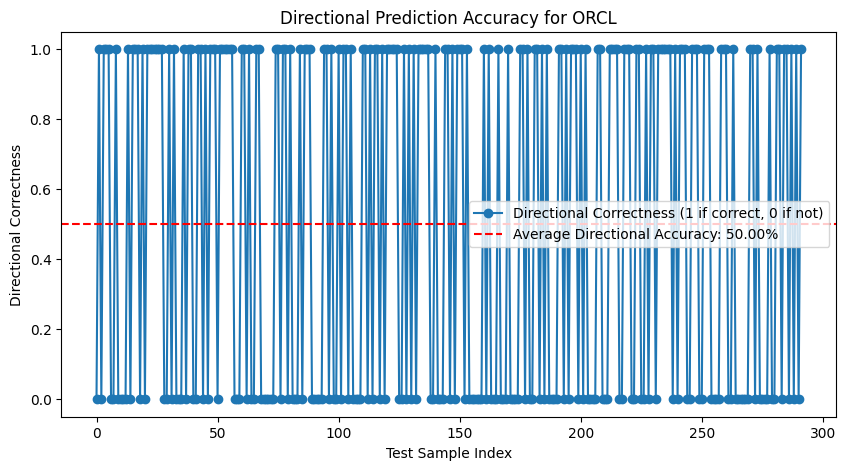

ROC AUC for ORCL: 0.60


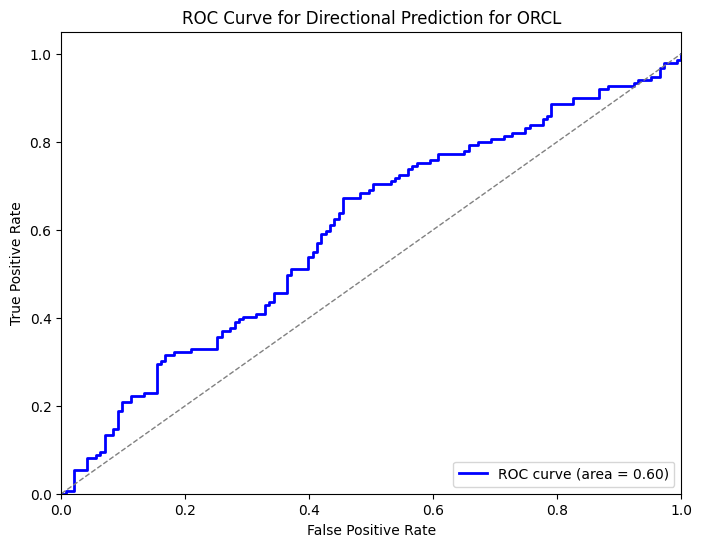


Processing ticker: PEP
Ticker: PEP - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0200 - val_loss: 0.0016
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1948e-04 - val_loss: 0.0029
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6539e-04 - val_loss: 0.0021
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.2290e-04 - val_loss: 0.0016
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.2976e-04 - val_loss: 0.0014
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.9425e-04 - val_loss: 0.0011
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.0145e-04 - val_loss: 0.0012
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.9638e-04 - val_loss: 0.0013
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.8032e-04 - val_loss: 7.3691e-04
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.6864e-04 - val_loss: 6.0410e-04
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Ticker: PEP - MAE: 2.74, RMSE: 3.19, MAPE: 2.70%
Directional Accuracy for PEP: 48.97%

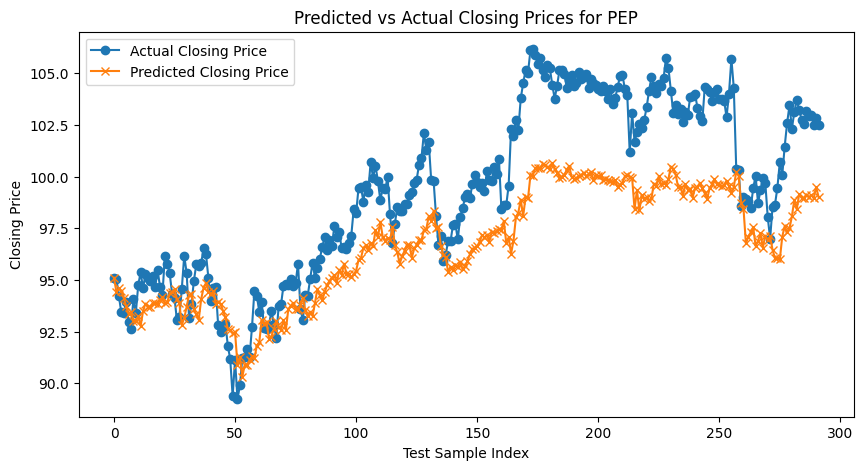

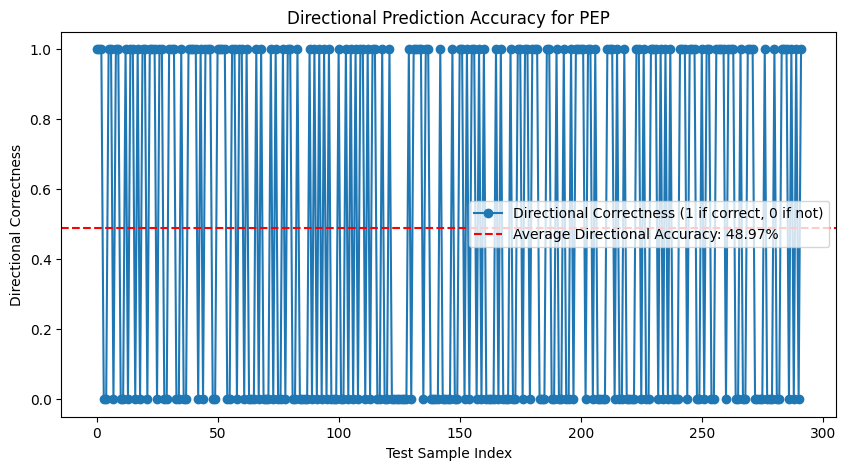

ROC AUC for PEP: 0.57


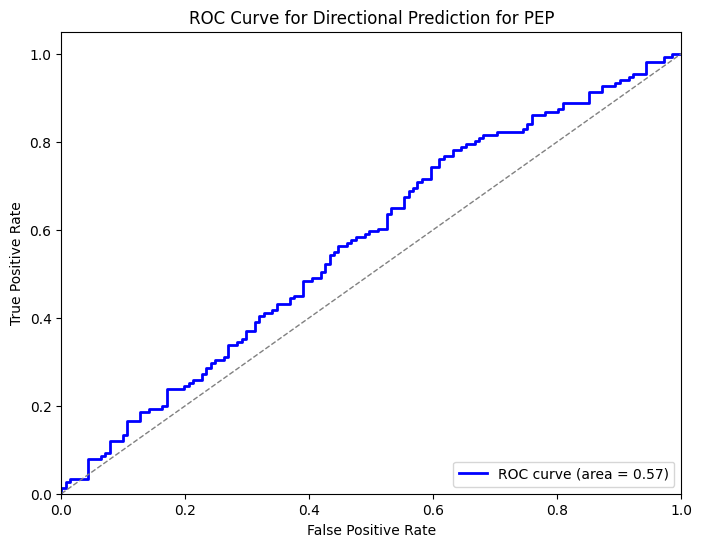


Processing ticker: PFE
Ticker: PFE - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0553 - val_loss: 0.0228
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0011 - val_loss: 0.0094
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.3312e-04 - val_loss: 0.0077
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.5553e-04 - val_loss: 0.0056
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8628e-04 - val_loss: 0.0053
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7929e-04 - val_loss: 0.0069
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 5.6340e-04 - val_loss: 0.0043
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9992e-04 - val_loss: 0.0035
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5091e-04 - val_loss: 0.0036
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0853e-04 - val_loss: 0.0025
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Ticker: PFE - MAE: 1.12, RMSE: 1.36, MAPE: 3.48%
Directional Accuracy for PFE: 52.05%


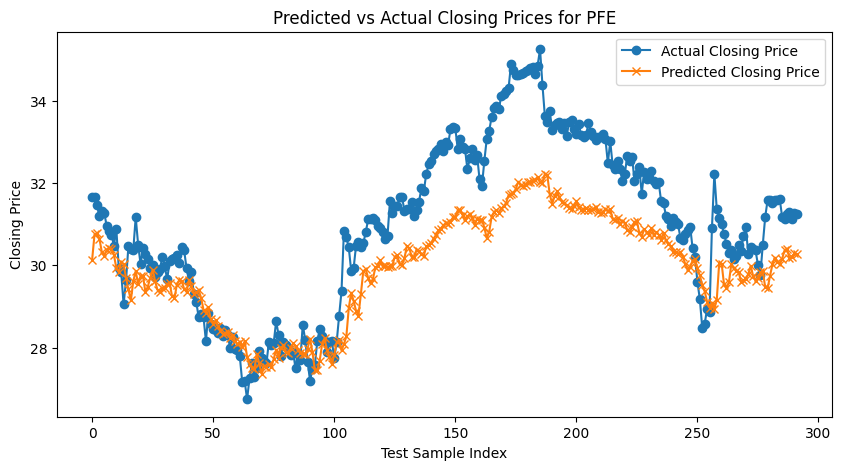

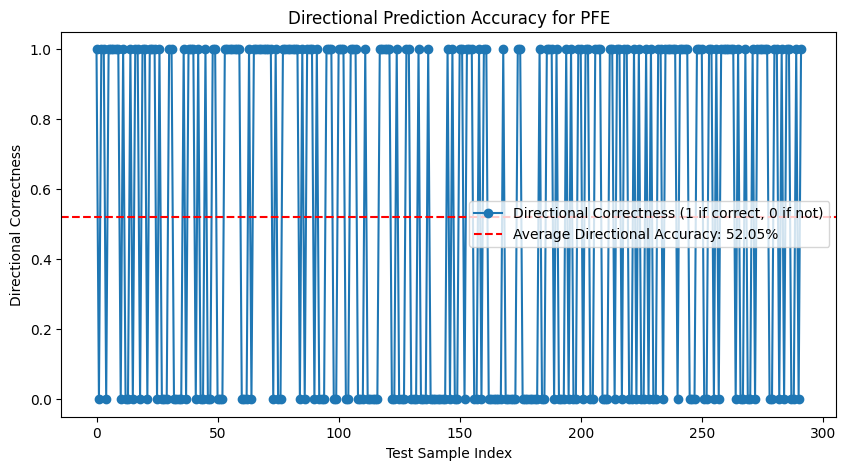

ROC AUC for PFE: 0.49


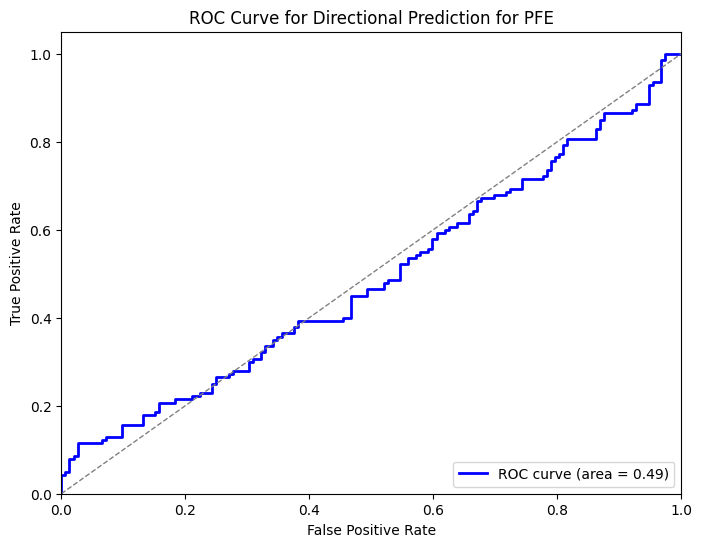


Processing ticker: PG
Ticker: PG - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0678 - val_loss: 0.0027
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0023 - val_loss: 0.0033
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0013 - val_loss: 0.0030
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0010 - val_loss: 0.0031
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.6916e-04 - val_loss: 0.0026
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.6306e-04 - val_loss: 0.0023
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.1588e-04 - val_loss: 0.0020
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 7.3163e-04 - val_loss: 0.0020
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.1582e-04 - val_loss: 0.0016
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1715e-04 - val_loss: 0.0018
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Ticker: PG - MAE: 1.95, RMSE: 2.23, MAPE: 2.41%
Directional Accuracy for PG: 48.63%


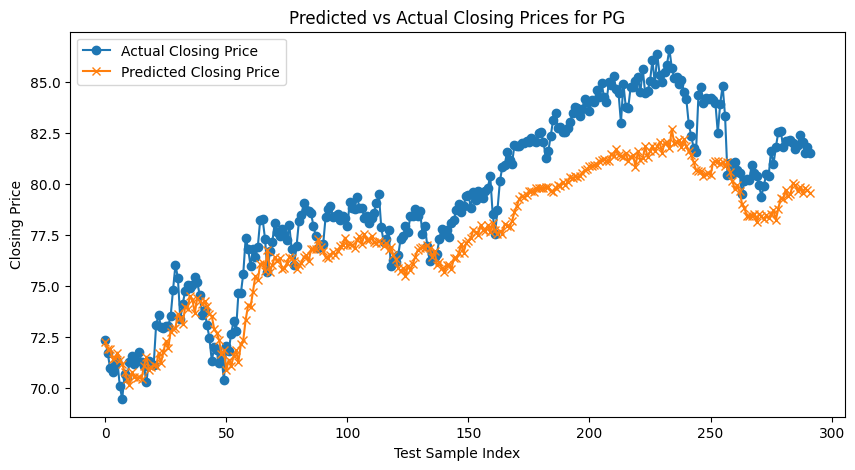

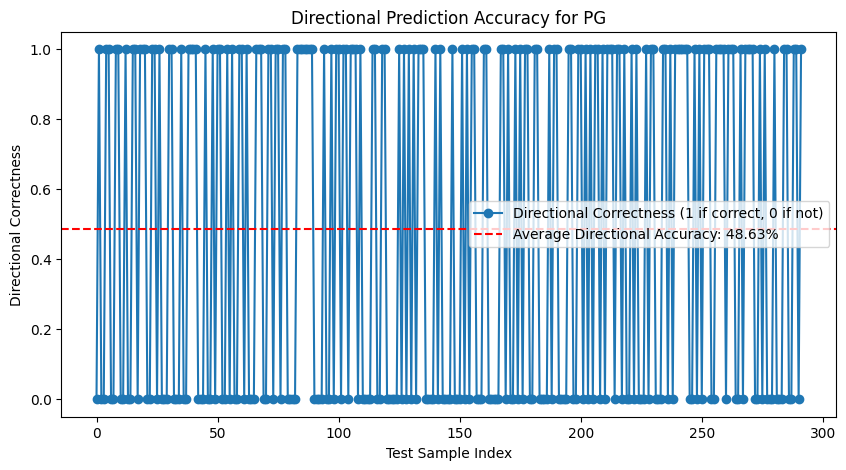

ROC AUC for PG: 0.58


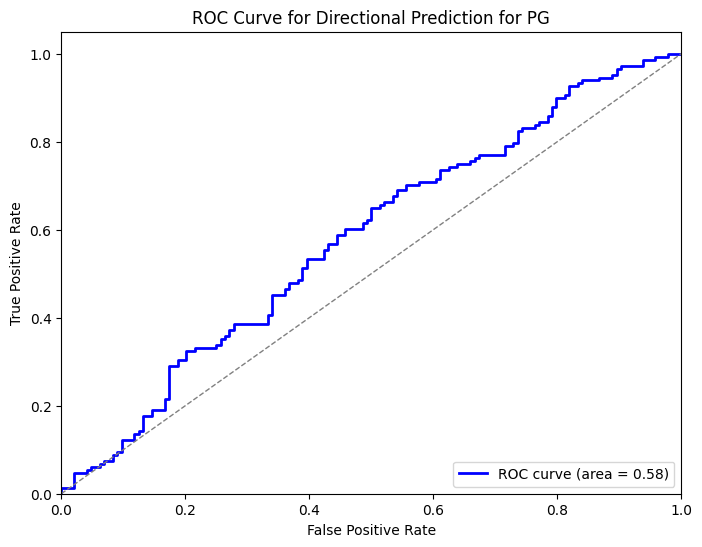


Processing ticker: PGR
Ticker: PGR - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0101 - val_loss: 0.0140
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.3301e-04 - val_loss: 0.0089
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0980e-04 - val_loss: 0.0066
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6116e-04 - val_loss: 0.0039
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8155e-04 - val_loss: 0.0029
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2164e-04 - val_loss: 0.0045
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9047e-04 - val_loss: 0.0028
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0027e-04 - val_loss: 0.0023
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.5214e-04 - val_loss: 0.0028
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0041e-04 - val_loss: 0.0022
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Ticker: PGR - MAE: 1.84, RMSE: 2.01, MAPE: 5.70%
Directional Accuracy for PGR: 49.66%


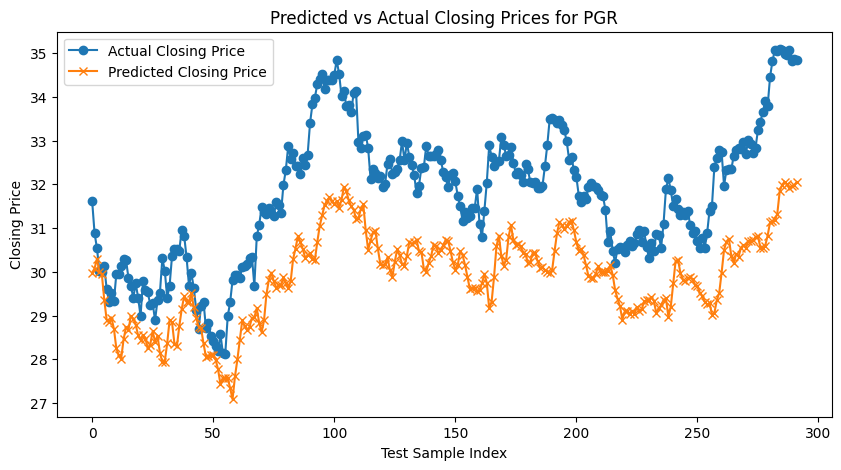

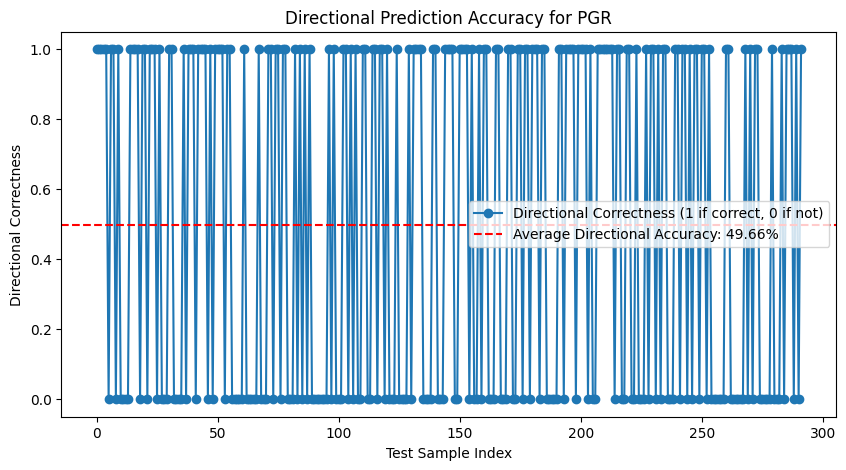

ROC AUC for PGR: 0.49


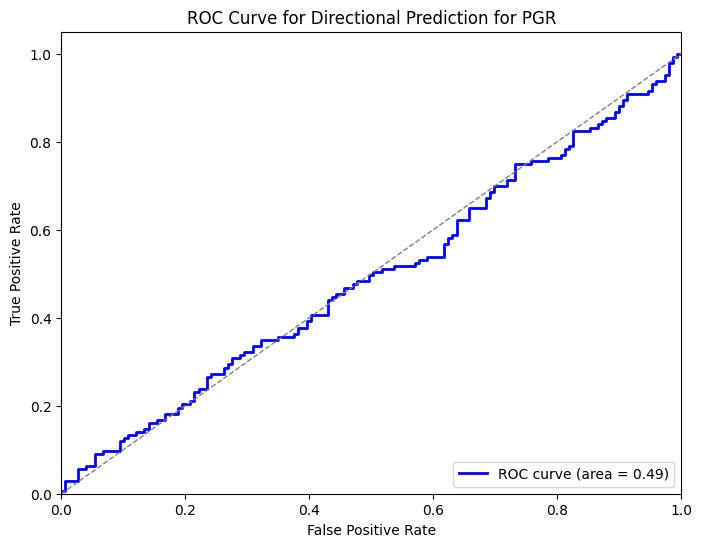


Processing ticker: QCOM
Ticker: QCOM - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0126 - val_loss: 0.0011
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0011 - val_loss: 0.0012
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.5189e-04 - val_loss: 0.0010
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5323e-04 - val_loss: 9.8070e-04
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1320e-04 - val_loss: 9.7827e-04
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2792e-04 - val_loss: 0.0011
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7487e-04 - val_loss: 8.9327e-04
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5864e-04 - val_loss: 8.5414e-04
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6582e-04 - val_loss: 9.1091e-04
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3721e-04 - val_loss: 0.0012
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Ticker: QCOM - MAE: 0.74, RMSE: 1.15, MAPE: 1.42%
Directional Accuracy for QCO

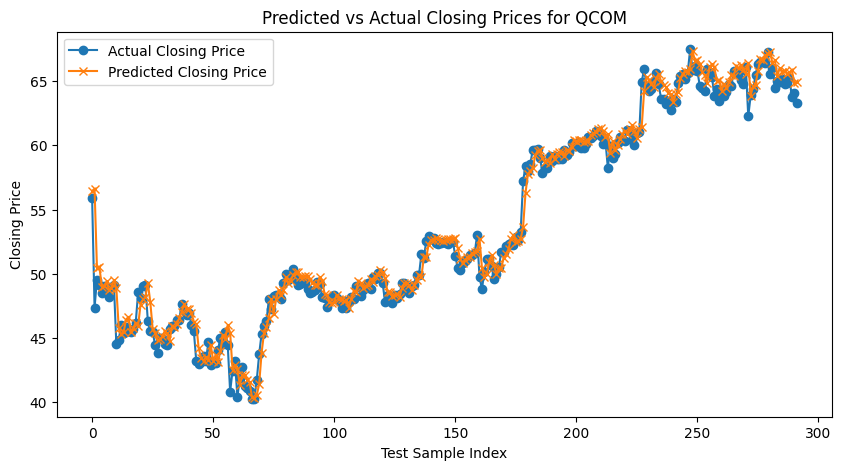

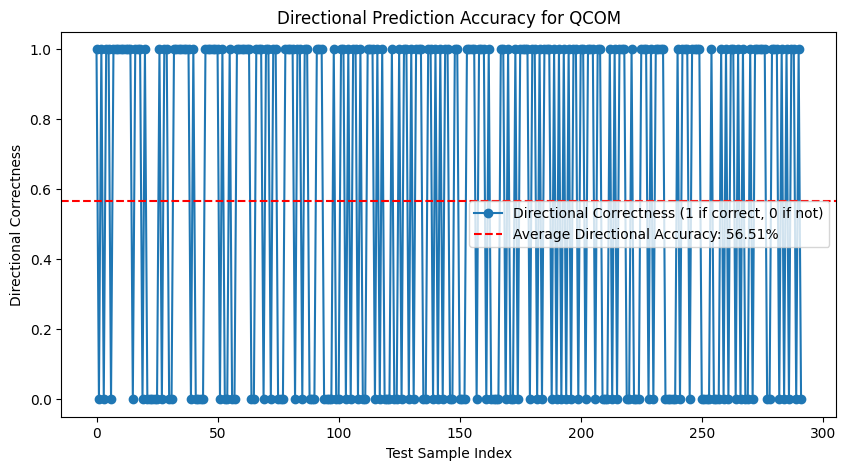

ROC AUC for QCOM: 0.56


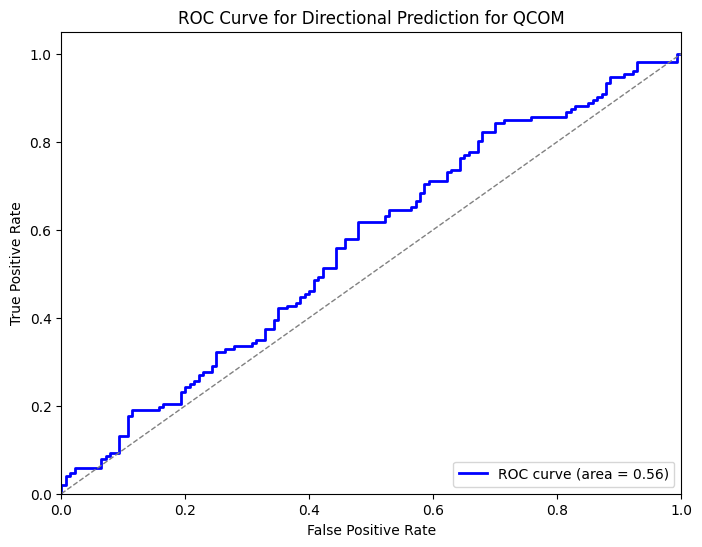


Processing ticker: SMFG
Ticker: SMFG - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.1998 - val_loss: 0.0170
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0077 - val_loss: 0.0050
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0036 - val_loss: 0.0026
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0033 - val_loss: 0.0025
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0028 - val_loss: 0.0021
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0025 - val_loss: 0.0020
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0020 - val_loss: 0.0019
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0018 - val_loss: 0.0018
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Ticker: SMFG - MAE: 0.20, RMSE: 0.26, MAPE: 3.18%
Directional Accuracy for SMFG: 44.86%


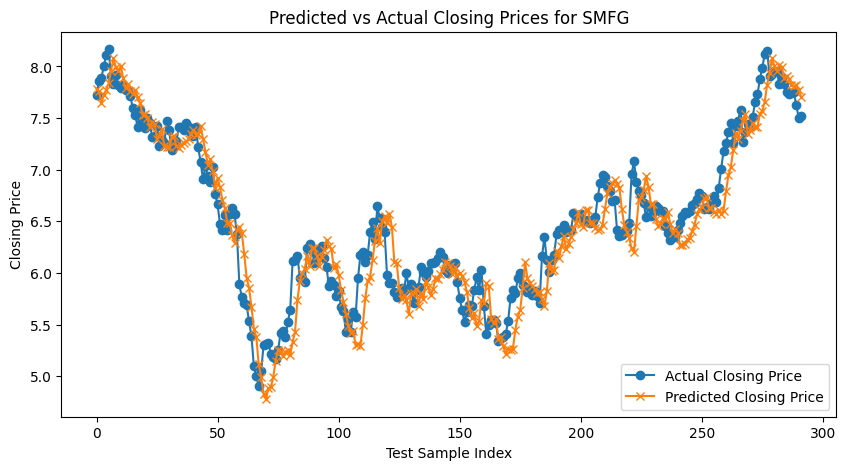

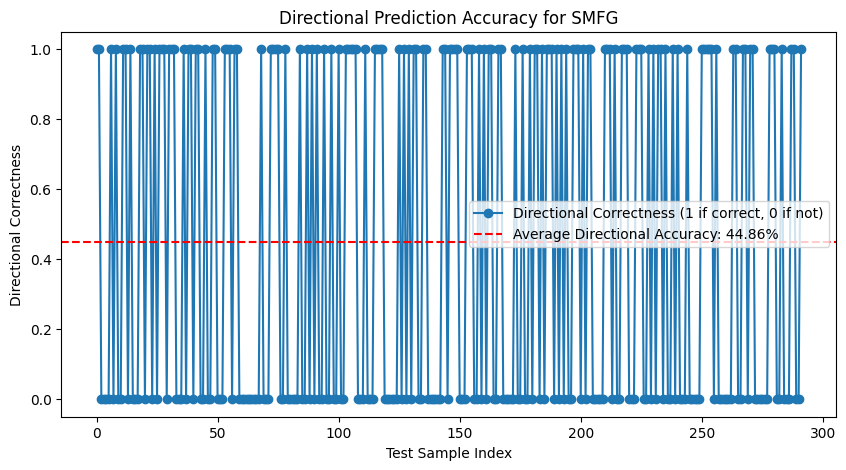

ROC AUC for SMFG: 0.42


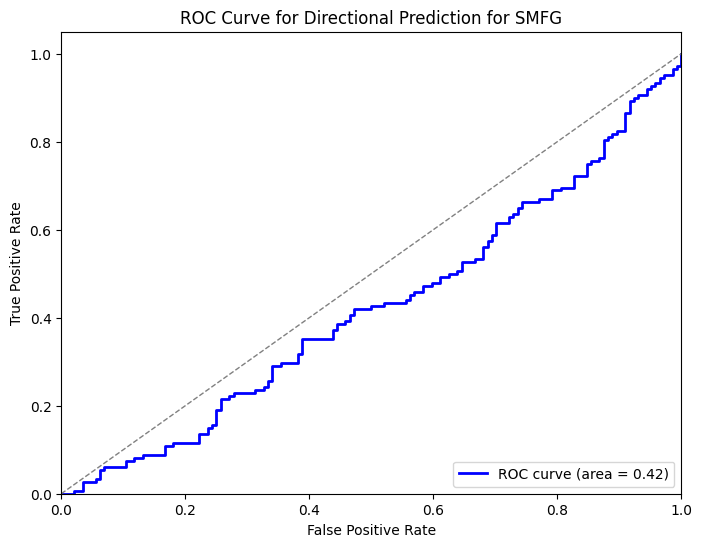


Processing ticker: SPGI
Ticker: SPGI - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0142 - val_loss: 0.0045
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5704e-04 - val_loss: 0.0066
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.3428e-04 - val_loss: 0.0043
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.8813e-04 - val_loss: 0.0030
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.3453e-04 - val_loss: 0.0033
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.0433e-04 - val_loss: 0.0015
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.7217e-04 - val_loss: 0.0013
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.8307e-04 - val_loss: 0.0013
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.5695e-04 - val_loss: 0.0014
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.6239e-04 - val_loss: 0.0012
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Ticker: SPGI - MAE: 5.75, RMSE: 6.64, MAPE: 5.17%
Directional Accuracy for SPGI: 50.68%


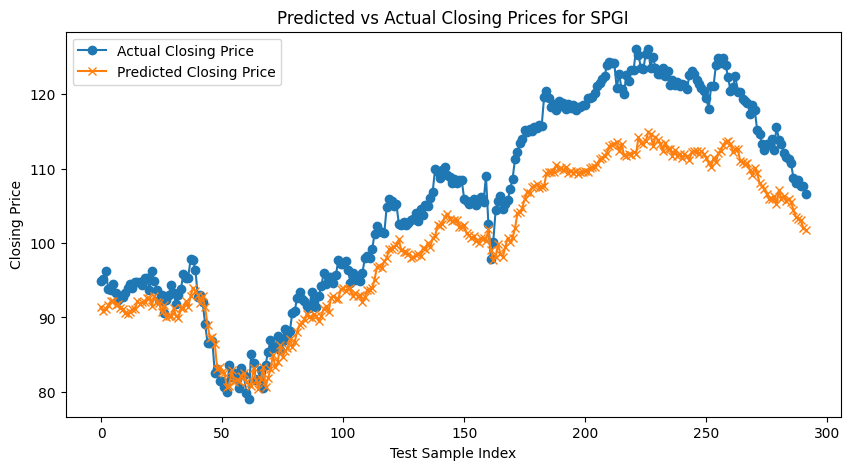

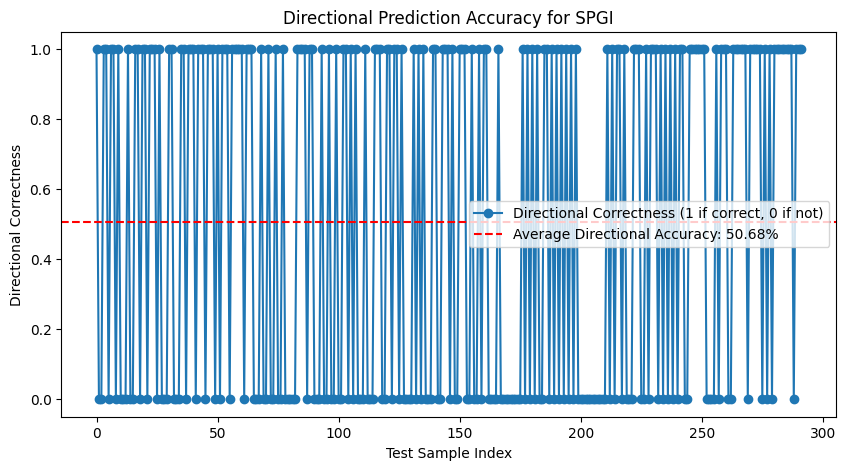

ROC AUC for SPGI: 0.53


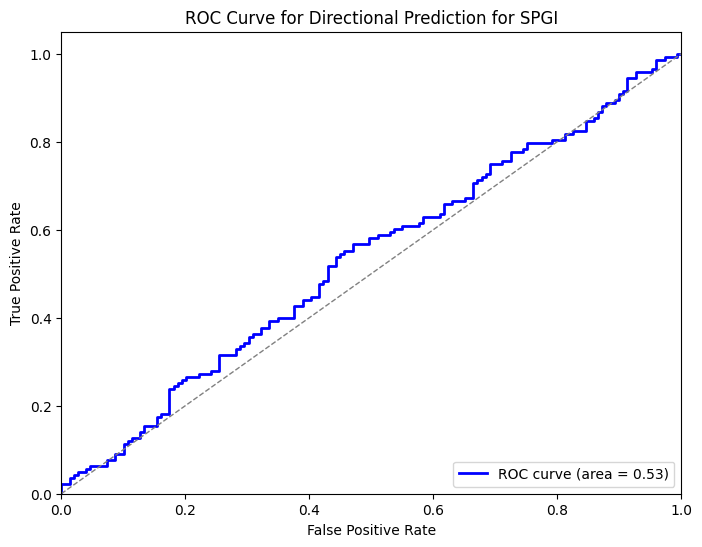


Processing ticker: SYK
Ticker: SYK - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0597 - val_loss: 0.0248
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0012 - val_loss: 0.0090
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3839e-04 - val_loss: 0.0058
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8369e-04 - val_loss: 0.0044
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3239e-04 - val_loss: 0.0031
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0198e-04 - val_loss: 0.0036
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7039e-04 - val_loss: 0.0020
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.7553e-04 - val_loss: 0.0025
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.5112e-04 - val_loss: 0.0027
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.5068e-04 - val_loss: 0.0016
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Ticker: SYK - MAE: 8.32, RMSE: 9.15, MAPE: 7.56%
Directional Accuracy for SYK: 40.41%


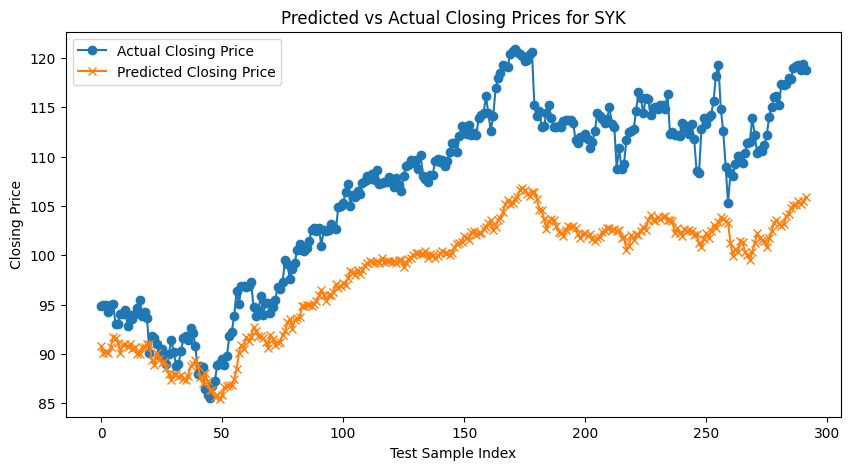

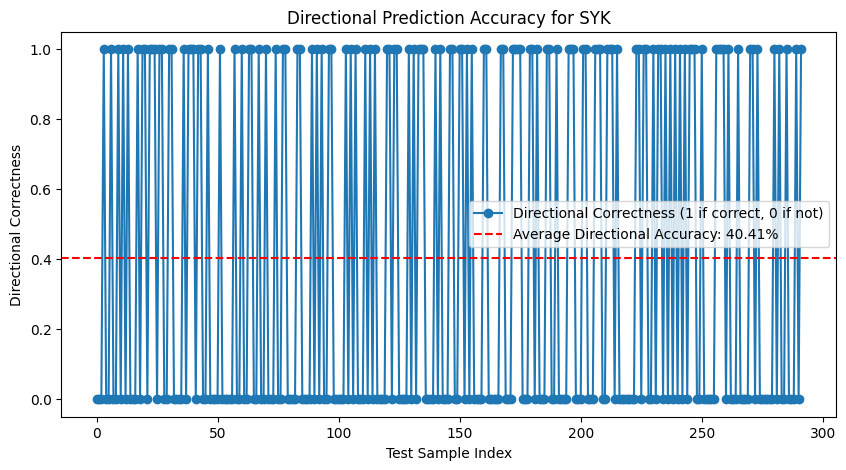

ROC AUC for SYK: 0.54


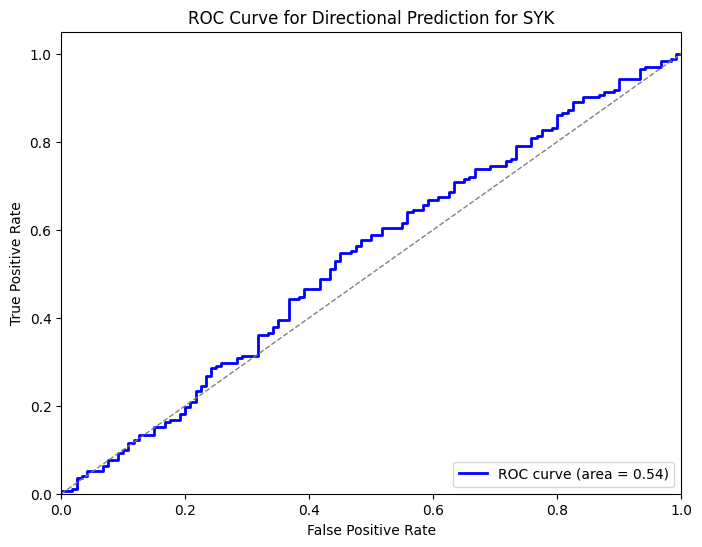


Processing ticker: T
Ticker: T - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0263 - val_loss: 0.0015
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0015 - val_loss: 9.4362e-04
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.8027e-04 - val_loss: 0.0014
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6549e-04 - val_loss: 0.0013
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.8472e-04 - val_loss: 6.9422e-04
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0770e-04 - val_loss: 6.4138e-04
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3386e-04 - val_loss: 7.8682e-04
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5889e-04 - val_loss: 5.6147e-04
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8028e-04 - val_loss: 5.4135e-04
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5438e-04 - val_loss: 6.3632e-04
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Ticker: T - MAE: 1.85, RMSE: 2.12, MAPE: 4.95%
Directional Accuracy f

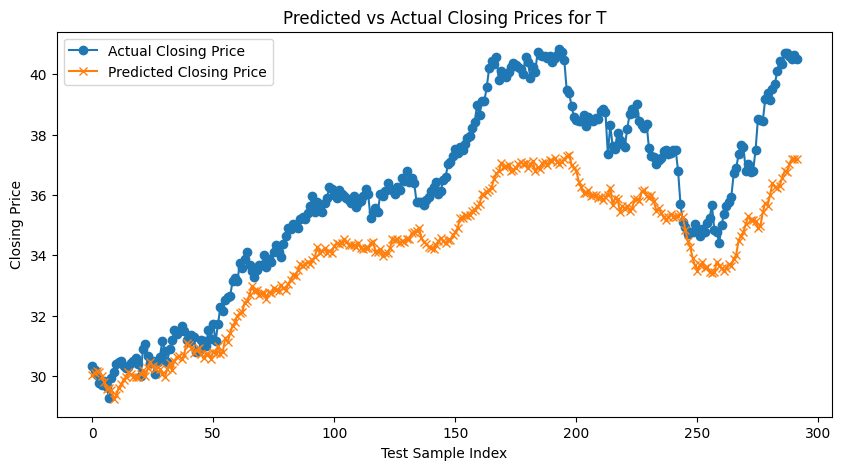

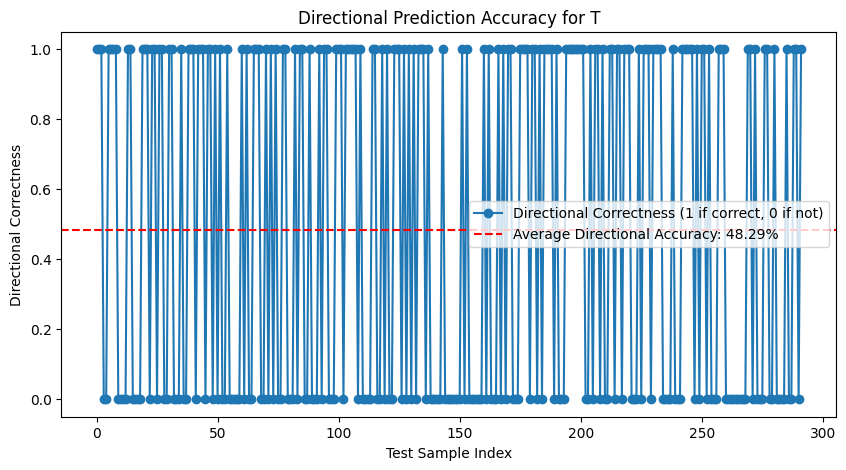

ROC AUC for T: 0.54


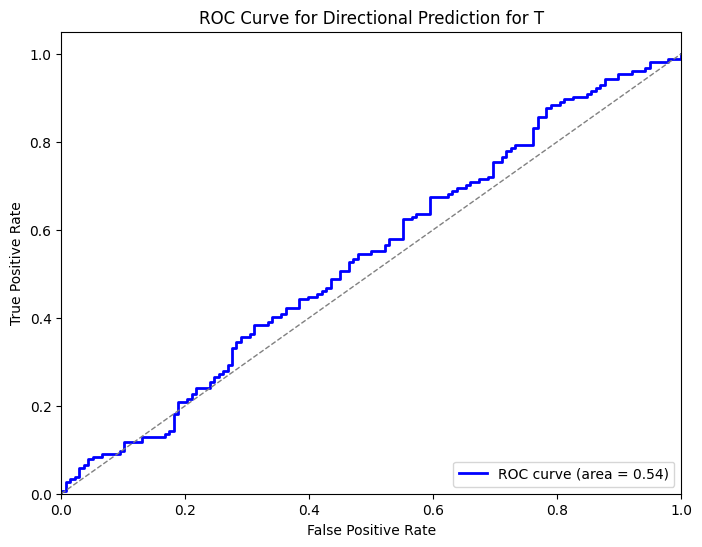


Processing ticker: TMO
Ticker: TMO - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0254 - val_loss: 0.0015
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5898e-04 - val_loss: 0.0017
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.3193e-04 - val_loss: 0.0010
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.3071e-04 - val_loss: 7.2353e-04
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.2535e-04 - val_loss: 6.3816e-04
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.3030e-04 - val_loss: 0.0010
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.2972e-04 - val_loss: 0.0013
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.5319e-04 - val_loss: 0.0011
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.1656e-04 - val_loss: 8.7592e-04
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.8546e-04 - val_loss: 7.5731e-04
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Ticker: TMO - MAE: 6.48, RMSE: 7.20, MAPE: 4.41%
Directional Accuracy for TMO:

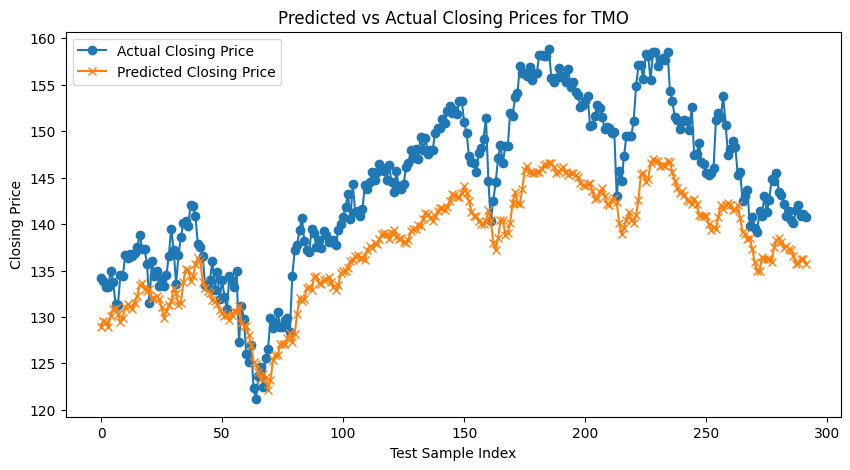

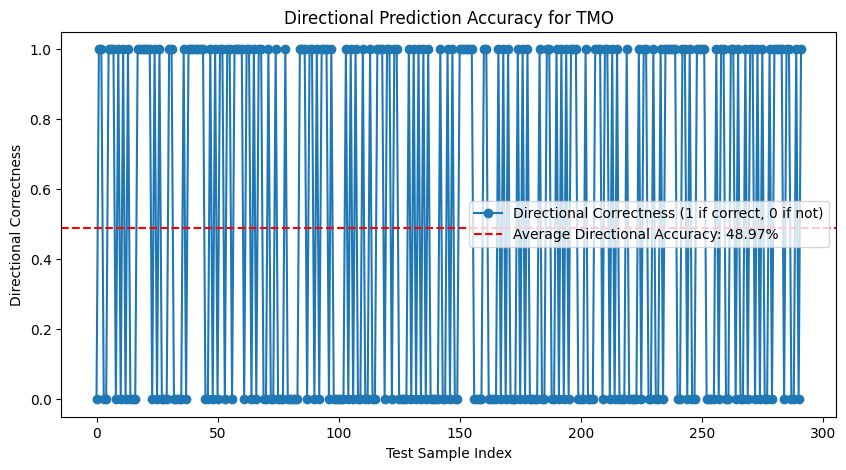

ROC AUC for TMO: 0.53


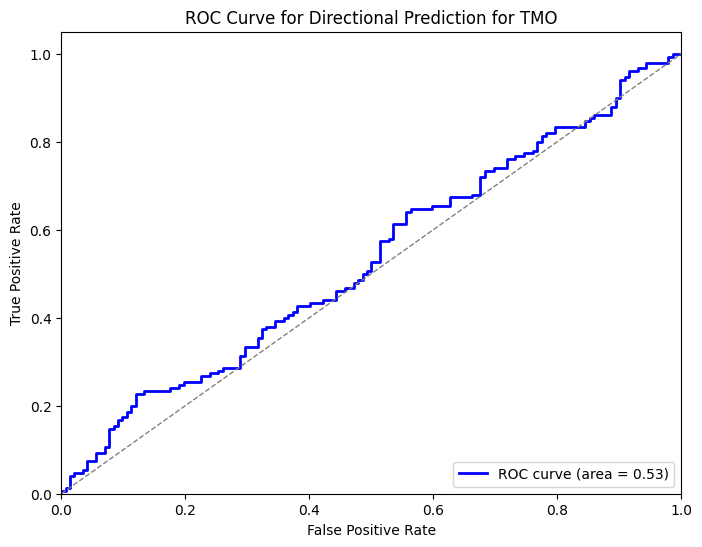


Processing ticker: TXN
Ticker: TXN - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0187 - val_loss: 0.0096
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.6682e-04 - val_loss: 0.0051
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7576e-04 - val_loss: 0.0047
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6274e-04 - val_loss: 0.0031
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1407e-04 - val_loss: 0.0031
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5176e-04 - val_loss: 0.0026
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.2366e-04 - val_loss: 0.0020
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.4389e-04 - val_loss: 0.0022
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.1206e-04 - val_loss: 0.0015
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.6613e-04 - val_loss: 0.0014
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Ticker: TXN - MAE: 4.74, RMSE: 5.69, MAPE: 7.41%
Directional Accuracy for TXN: 43.15%


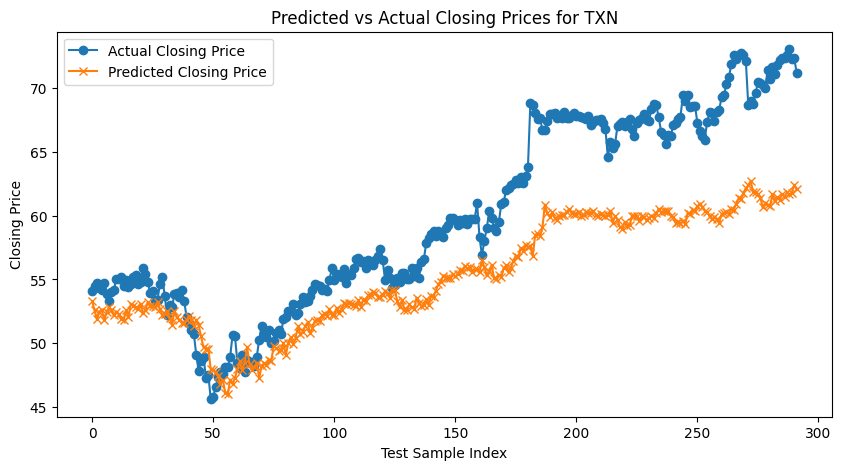

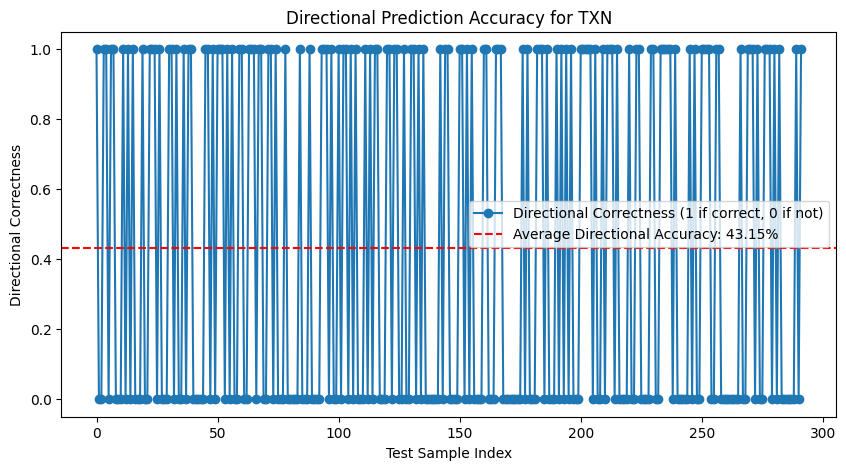

ROC AUC for TXN: 0.54


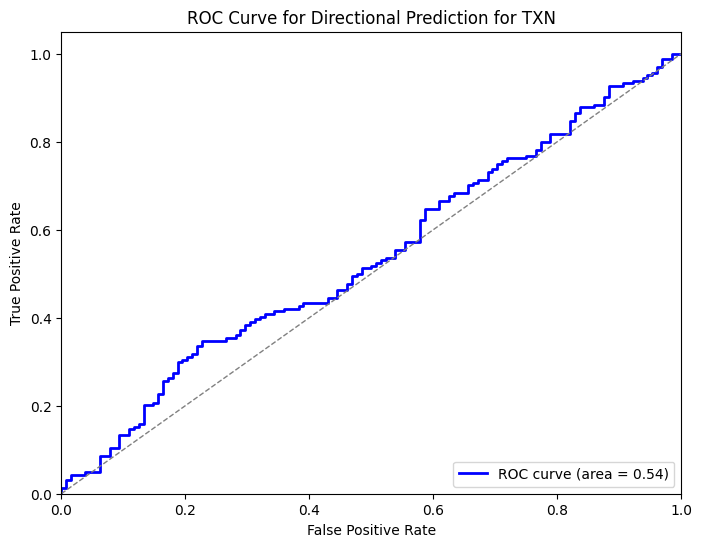


Processing ticker: UNH
Ticker: UNH - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0112 - val_loss: 0.0011
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.8410e-04 - val_loss: 0.0028
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.2225e-04 - val_loss: 0.0013
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.0254e-04 - val_loss: 0.0011
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.8228e-05 - val_loss: 0.0010
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.8035e-05 - val_loss: 8.3775e-04
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.5644e-05 - val_loss: 9.2125e-04
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.2114e-05 - val_loss: 0.0011
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.8918e-05 - val_loss: 0.0013
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.8689e-05 - val_loss: 8.3902e-04
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Ticker: UNH - MAE: 7.96, RMSE: 8.98, MAPE: 5.88%
Directional Accuracy for UNH: 51

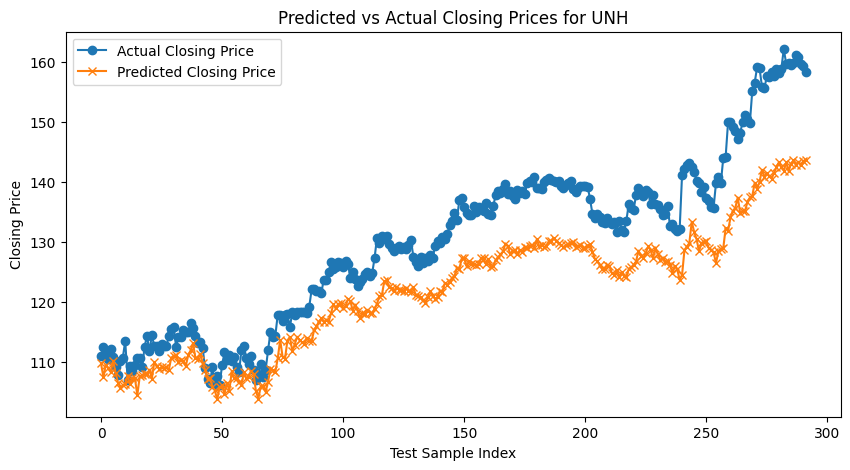

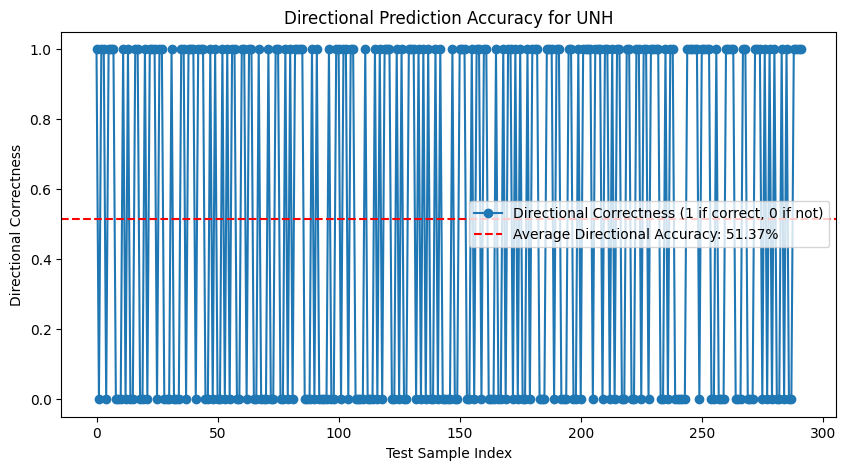

ROC AUC for UNH: 0.54


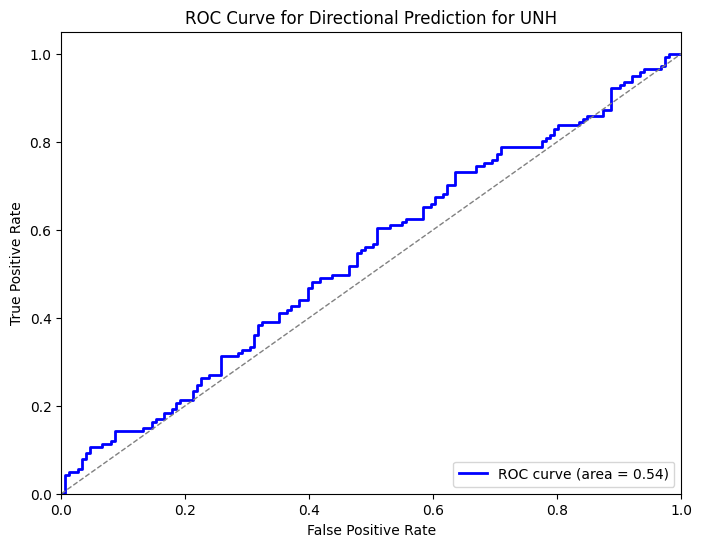


Processing ticker: UNP
Ticker: UNP - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0136 - val_loss: 0.0096
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.7064e-04 - val_loss: 0.0026
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7664e-04 - val_loss: 0.0022
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.0863e-04 - val_loss: 0.0021
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.2368e-04 - val_loss: 0.0019
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.6003e-04 - val_loss: 0.0020
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.6407e-04 - val_loss: 0.0016
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.5282e-04 - val_loss: 0.0021
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.6453e-04 - val_loss: 0.0017
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.2515e-04 - val_loss: 0.0014
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Ticker: UNP - MAE: 1.82, RMSE: 2.32, MAPE: 2.21%
Directional Accuracy for UNP: 49.66%


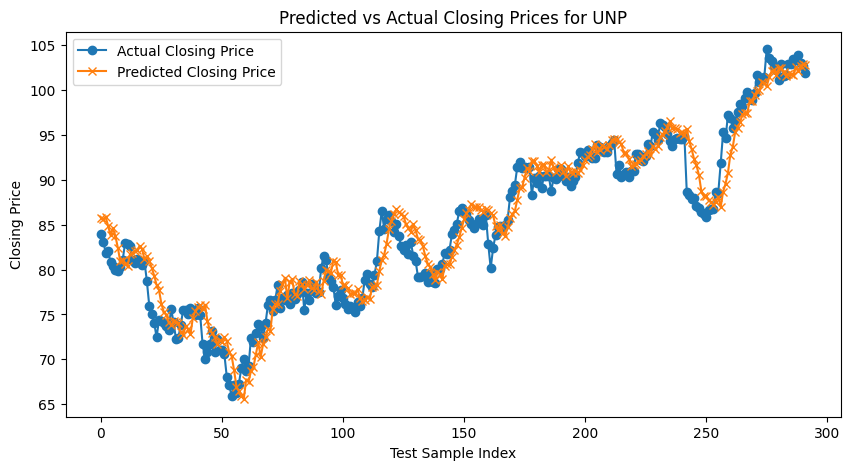

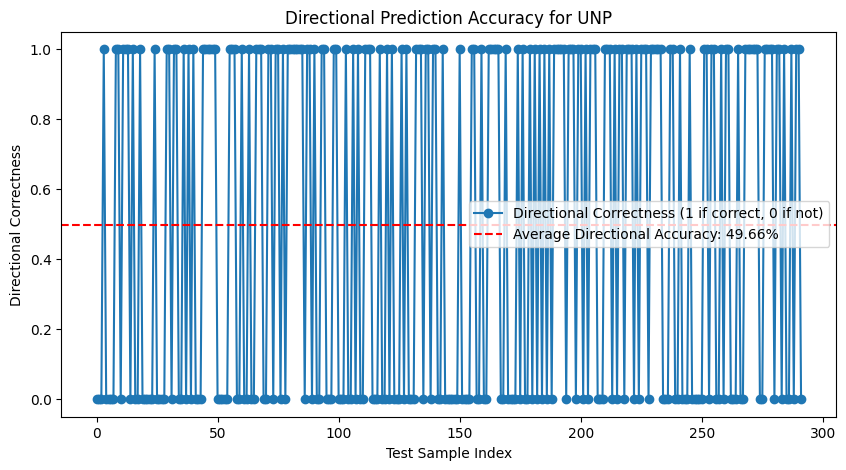

ROC AUC for UNP: 0.50


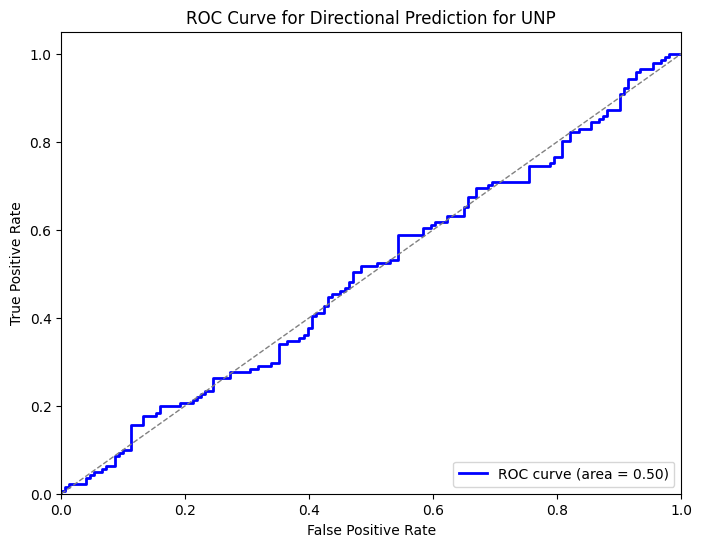


Processing ticker: VZ
Ticker: VZ - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0303 - val_loss: 0.0020
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0017 - val_loss: 0.0010
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.3060e-04 - val_loss: 0.0014
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.2493e-04 - val_loss: 0.0011
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2188e-04 - val_loss: 8.8602e-04
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6817e-04 - val_loss: 7.6148e-04
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1000e-04 - val_loss: 7.5341e-04
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1356e-04 - val_loss: 7.7677e-04
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3057e-04 - val_loss: 6.2228e-04
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0528e-04 - val_loss: 5.8550e-04
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Ticker: VZ - MAE: 1.37, RMSE: 1.63, MAPE: 2.82%
Directional Accuracy for 

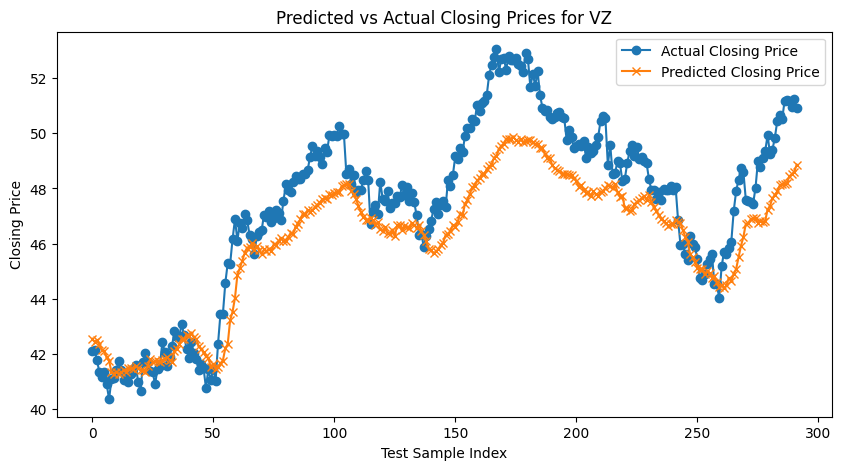

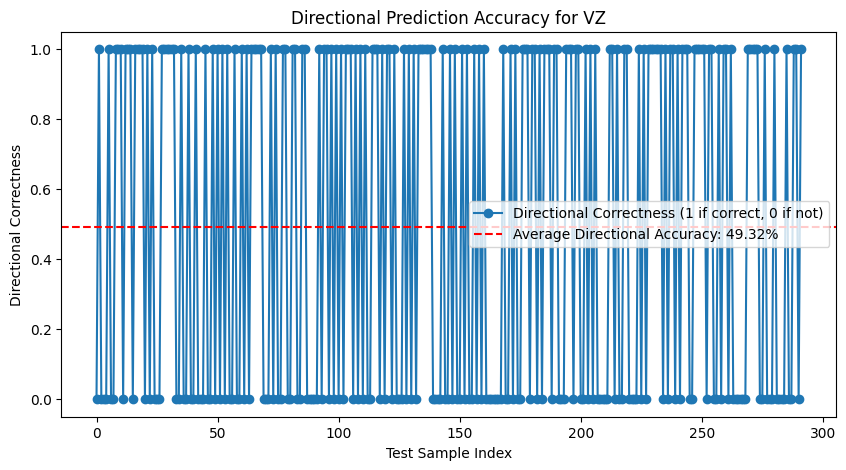

ROC AUC for VZ: 0.53


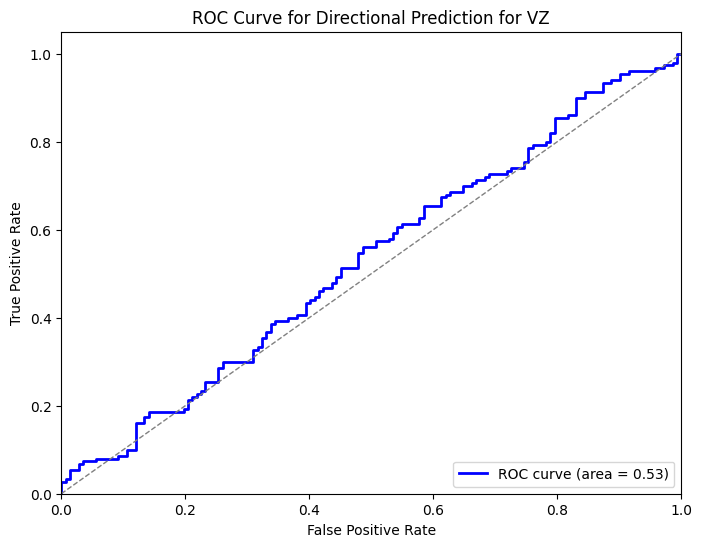


Processing ticker: WFC
Ticker: WFC - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0050 - val_loss: 0.0030
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3771e-04 - val_loss: 0.0013
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6715e-04 - val_loss: 7.8365e-04
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1143e-04 - val_loss: 0.0013
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7488e-04 - val_loss: 0.0012
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.3605e-04 - val_loss: 6.6180e-04
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5334e-04 - val_loss: 0.0012
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6576e-04 - val_loss: 0.0015
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.0659e-04 - val_loss: 0.0018
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8299e-04 - val_loss: 0.0013
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Ticker: WFC - MAE: 0.98, RMSE: 1.29, MAPE: 2.02%
Directional Accuracy for WFC: 49.66%

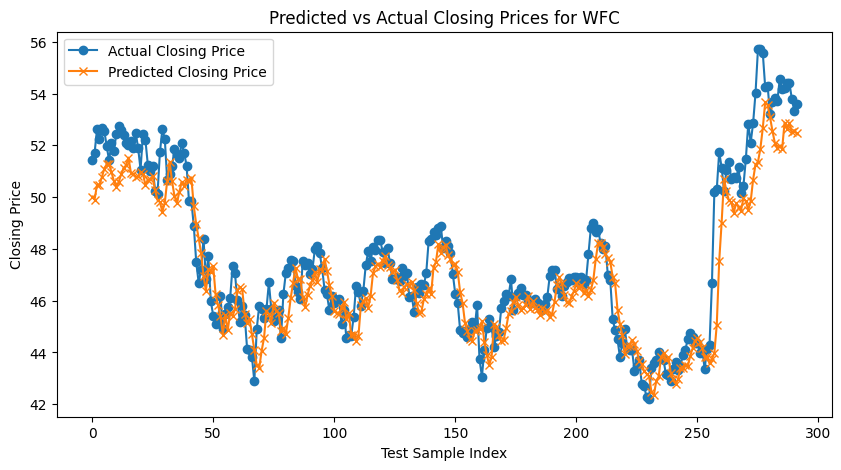

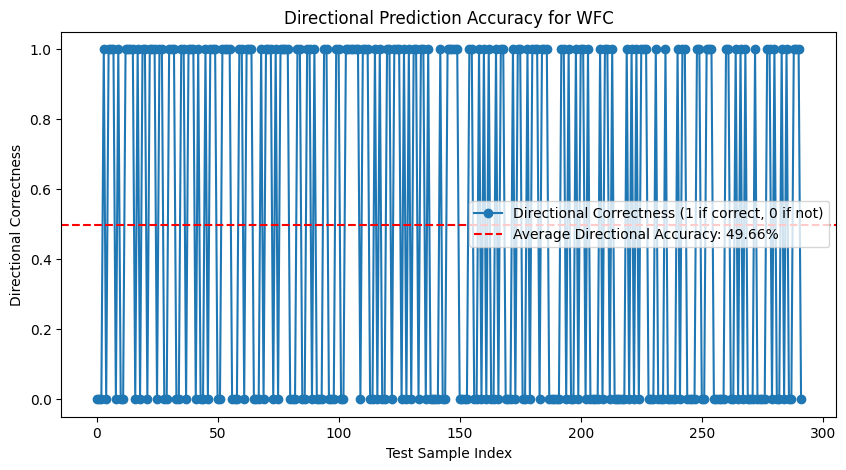

ROC AUC for WFC: 0.52


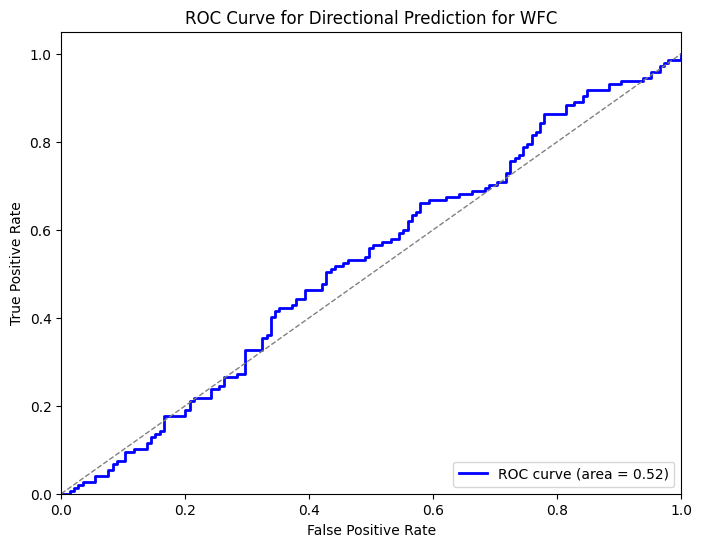


Processing ticker: WMT
Ticker: WMT - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.3116 - val_loss: 0.0036
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0016 - val_loss: 0.0024
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.4096e-04 - val_loss: 0.0025
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7570e-04 - val_loss: 0.0024
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0320e-04 - val_loss: 0.0025
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6312e-04 - val_loss: 0.0026
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1533e-04 - val_loss: 0.0023
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2526e-04 - val_loss: 0.0021
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3767e-04 - val_loss: 0.0023
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7599e-04 - val_loss: 0.0020
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Ticker: WMT - MAE: 0.96, RMSE: 1.31, MAPE: 1.50%
Directional Accuracy for WMT: 56.85%


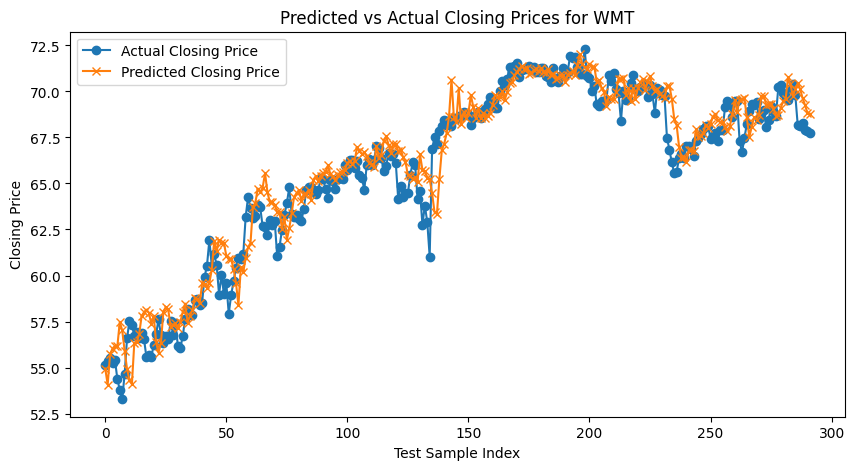

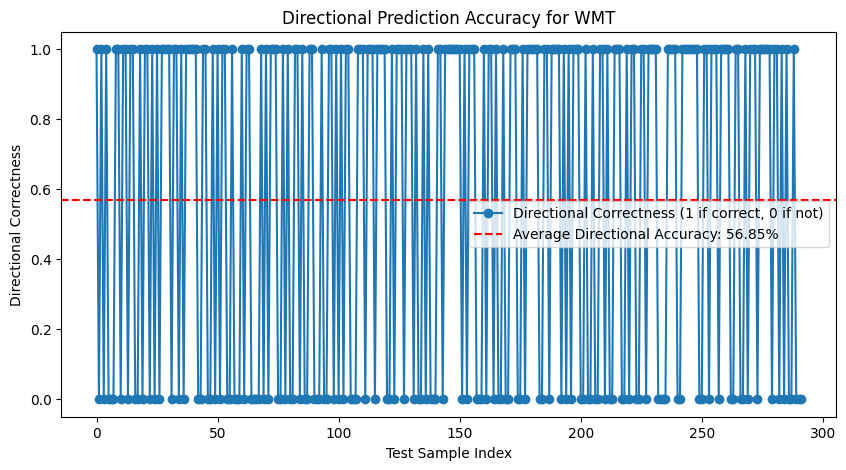

ROC AUC for WMT: 0.57


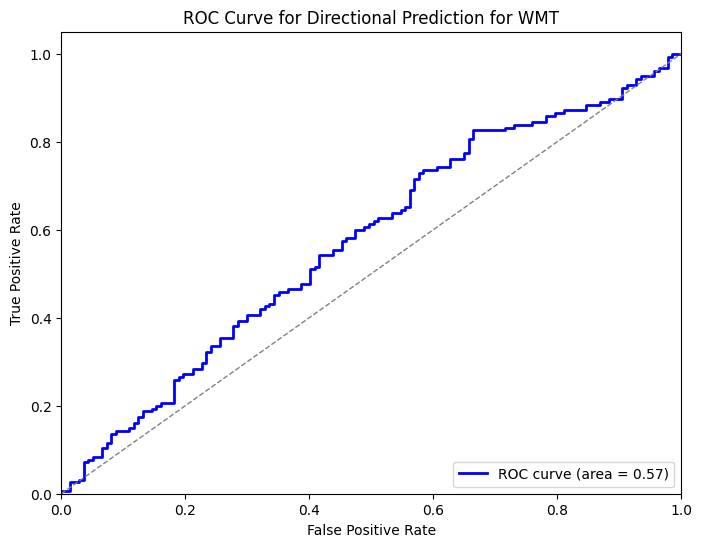


Processing ticker: XOM
Ticker: XOM - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0588 - val_loss: 0.0029
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0025 - val_loss: 0.0025
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0016 - val_loss: 0.0025
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0015 - val_loss: 0.0025
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0014 - val_loss: 0.0027
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0013 - val_loss: 0.0023
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0011 - val_loss: 0.0026
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0012 - val_loss: 0.0022
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0011 - val_loss: 0.0021
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Ticker: XOM - MAE: 0.99, RMSE: 1.37, MAPE: 1.27%
Directional Accuracy for XOM: 58.22%


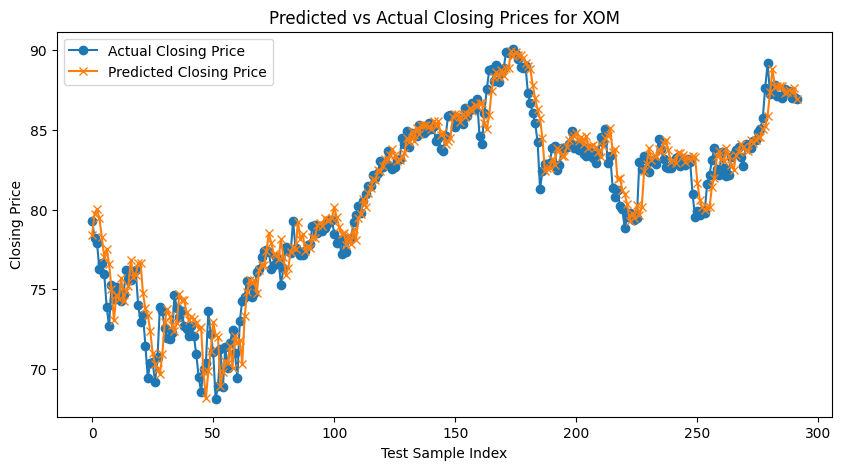

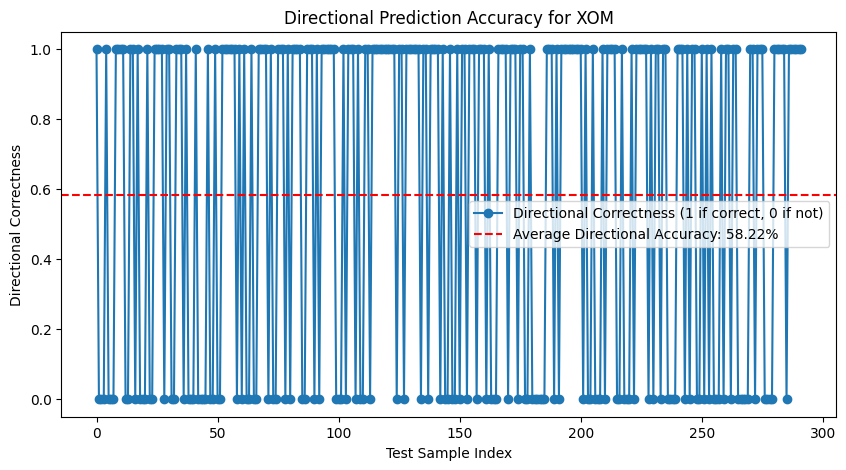

ROC AUC for XOM: 0.55


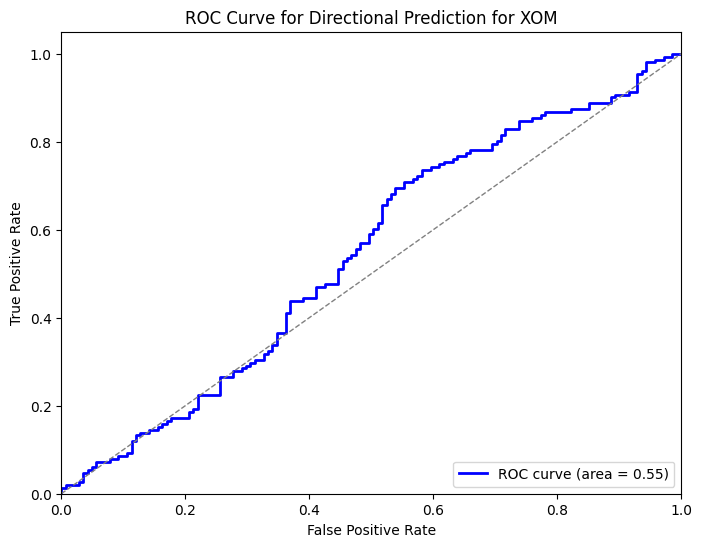

In [ ]:
# Import required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, SimpleRNN
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, roc_curve, auc

# Set the rolling window size (number of past data points in each sequence)
rolling_window = 50  # Change as needed

# Set a specific ticker to analyze (e.g., 'AAPL'). If set to None, the code iterates through all tickers.
specific_ticker = None  # Example: 'AAPL' or None for all tickers

# Training parameters
epochs = 10
batch_size = 32

# =====================================================
# STEP 1: LOAD AND PRE-PROCESS THE DATA
# =====================================================
# The CSV is assumed to have these columns in order: 
# Date,index,Open,High,Low,Close,Volume,OpenInt,ticker
data = pd.read_csv('filtered_stocks_combined.csv')  # Update with your actual file name

print("Loaded data with {} records.".format(len(data)))

# Convert the 'Date' column to datetime and sort by 'Date' and 'index'
data['Date'] = pd.to_datetime(data['Date'])
data.sort_values(['Date', 'index'], inplace=True)
print("Data sorted by 'Date' and 'index'.")
print(data.head())

# =====================================================
# STEP 2: DEFINE HELPER FUNCTIONS
# =====================================================
def create_sequences(data_series, seq_length):
    """
    Create overlapping sequences for RNN training.
    Each sample consists of 'seq_length' consecutive values,
    and the target is the immediately following value.
    """
    xs, ys = [], []
    for i in range(len(data_series) - seq_length):
        x = data_series[i:(i + seq_length)]
        y = data_series[i + seq_length]
        xs.append(x)
        ys.append(y)
    return np.array(xs), np.array(ys)

def build_rnn_model(seq_length):
    """
    Build and compile a simple RNN model.
    """
    model = Sequential()
    model.add(SimpleRNN(50, activation='tanh', input_shape=(seq_length, 1)))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    return model

def process_ticker(ticker, df, rolling_window, epochs=10, batch_size=32, verbose=1):
    """
    For the specified ticker:
      - Filter and sort the data.
      - Scale the 'Close' price.
      - Create sequences of scaled values.
      - Split the data into training (60%), validation (20%) and test (20%) sets.
      - Train a simple RNN model.
      - Predict the test set closing prices.
      - Calculate error metrics.
      - Compute directional prediction correctness.
      - Plot actual vs. predicted prices.
      - Plot the directional correctness (binary indicator) and a ROC curve.
    """
    print("\n==============================")
    print("Processing ticker:", ticker)
    print("==============================")
    
    # Filter data for this ticker and sort by Date and index
    stock_data = df[df['ticker'].str.upper() == ticker.upper()].copy()
    stock_data.sort_values(['Date', 'index'], inplace=True)
    
    # Ensure sufficient data for sequence creation
    if stock_data.shape[0] < rolling_window + 1:
        print(f"Not enough data for ticker {ticker} to create sequences.")
        return None
    
    # Scale the 'Close' price using MinMaxScaler
    scaler = MinMaxScaler()
    stock_data['Close_Scaled'] = scaler.fit_transform(stock_data['Close'].values.reshape(-1, 1))
    
    # Create sequences from the scaled 'Close' values
    prices = stock_data['Close_Scaled'].values
    X, y = create_sequences(prices, rolling_window)
    X = X.reshape((X.shape[0], rolling_window, 1))
    
    print(f"Ticker: {ticker} - Total sequences created: {X.shape[0]}")
    
    # ---------------------------
    # Split into training (60%), validation (20%) and testing (20%) sets
    # ---------------------------
    total_samples = len(X)
    train_end = int(total_samples * 0.6)
    val_end = train_end + int(total_samples * 0.2)
    X_train, X_val, X_test = X[:train_end], X[train_end:val_end], X[val_end:]
    y_train, y_val, y_test = y[:train_end], y[train_end:val_end], y[val_end:]
    print(f"Training samples: {X_train.shape[0]}, Validation samples: {X_val.shape[0]}, Testing samples: {X_test.shape[0]}")
    
    # Build and train the RNN model on the training data, validating on the validation set.
    model = build_rnn_model(rolling_window)
    history = model.fit(X_train, y_train, 
                        validation_data=(X_val, y_val),
                        epochs=epochs, 
                        batch_size=batch_size, 
                        verbose=verbose)
    
    # Predict on the test set.
    predictions_scaled = model.predict(X_test)
    predictions = scaler.inverse_transform(predictions_scaled)
    y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))
    
    # Calculate error metrics.
    mae = mean_absolute_error(y_test_actual, predictions)
    rmse = np.sqrt(mean_squared_error(y_test_actual, predictions))
    mape = np.mean(np.abs((y_test_actual - predictions) / y_test_actual)) * 100
    print(f"Ticker: {ticker} - MAE: {mae:.2f}, RMSE: {rmse:.2f}, MAPE: {mape:.2f}%")
    
    # ---------------------------
    # Directional Prediction Calculation
    # ---------------------------
    # For each test sample, compare the predicted change (predicted price - last value of input sequence)
    # with the actual change (actual closing price - last value of input sequence).
    direction_correct = []
    actual_labels = []      # For ROC: actual upward movement indicator (1 if up, 0 if down)
    predicted_scores = []   # For ROC: predicted price difference used as the score
    
    for i in range(len(X_test)):
        # Last value in the corresponding input sequence (scaled)
        last_val = X_test[i, -1, 0]
        pred_diff = predictions_scaled[i, 0] - last_val  # using scaled differences
        actual_diff = y_test[i] - last_val
        
        # Determine directional correctness: same direction yields 1, otherwise 0.
        if (pred_diff > 0 and actual_diff > 0) or (pred_diff < 0 and actual_diff < 0):
            direction_correct.append(1)
        else:
            direction_correct.append(0)
        
        # For ROC curve:
        # Actual label: 1 if actual_diff > 0, else 0.
        actual_labels.append(1 if actual_diff > 0 else 0)
        # Predicted score: use the predicted difference.
        predicted_scores.append(pred_diff)
        
    direction_correct = np.array(direction_correct)
    directional_accuracy = np.mean(direction_correct) * 100
    print(f"Directional Accuracy for {ticker}: {directional_accuracy:.2f}%")
    
    # ---------------------------
    # Plot: Actual vs Predicted Closing Prices
    # ---------------------------
    plt.figure(figsize=(10, 5))
    plt.plot(y_test_actual, label='Actual Closing Price', marker='o')
    plt.plot(predictions, label='Predicted Closing Price', marker='x')
    plt.title(f'Predicted vs Actual Closing Prices for {ticker}')
    plt.xlabel('Test Sample Index')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.show()
    
    # ---------------------------
    # Plot: Directional Prediction Accuracy (Binary Indicator)
    # ---------------------------
    plt.figure(figsize=(10, 5))
    plt.plot(direction_correct, 'o-', label='Directional Correctness (1 if correct, 0 if not)')
    plt.axhline(np.mean(direction_correct), color='red', linestyle='--', 
                label=f'Average Directional Accuracy: {directional_accuracy:.2f}%')
    plt.xlabel('Test Sample Index')
    plt.ylabel('Directional Correctness')
    plt.title(f'Directional Prediction Accuracy for {ticker}')
    plt.legend()
    plt.show()
    
    # ---------------------------
    # Plot: ROC Curve for Directional Prediction
    # ---------------------------
    # Compute ROC curve and AUC using the actual labels and predicted scores.
    fpr, tpr, thresholds = roc_curve(actual_labels, predicted_scores)
    roc_auc = auc(fpr, tpr)
    print(f"ROC AUC for {ticker}: {roc_auc:.2f}")
    
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='grey', lw=1, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve for Directional Prediction for {ticker}')
    plt.legend(loc="lower right")
    plt.show()

# =====================================================
# STEP 3: PROCESS TICKERS
# =====================================================
if specific_ticker is None:
    tickers = data['ticker'].unique()
    print("Processing all tickers:\n", tickers)
    for ticker in tickers:
        process_ticker(ticker, data, rolling_window, epochs, batch_size)
else:
    print("Processing specific ticker:", specific_ticker)
    process_ticker(specific_ticker, data, rolling_window, epochs, batch_size)
